## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2 
import math
import glob

%matplotlib inline


### Helper functoin PLOT

In [2]:
def side_by_side_plot(im1, im2, im1_title=None, im2_title=None):
    f, (ax1, ax2) = plt.subplots(1,2, figsize=(24, 10))
    f.tight_layout()
    
    ax1.imshow(im1)
    if im1_title: ax1.set_title(im1_title, fontsize=40)
    ax2.imshow(im2, cmap='gray')#, cmap='gray'
    if im2_title: ax2.set_title(im2_title, fontsize=40)

        
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
def big_plot(img):
    fig, ax = plt.subplots(figsize=(20, 10))
    ax.imshow(img, cmap='gray')

# 1. Camera calibration and distortion coefficients

### 1.1 Images & Object points

In [5]:
# prepare object points
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        #Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)


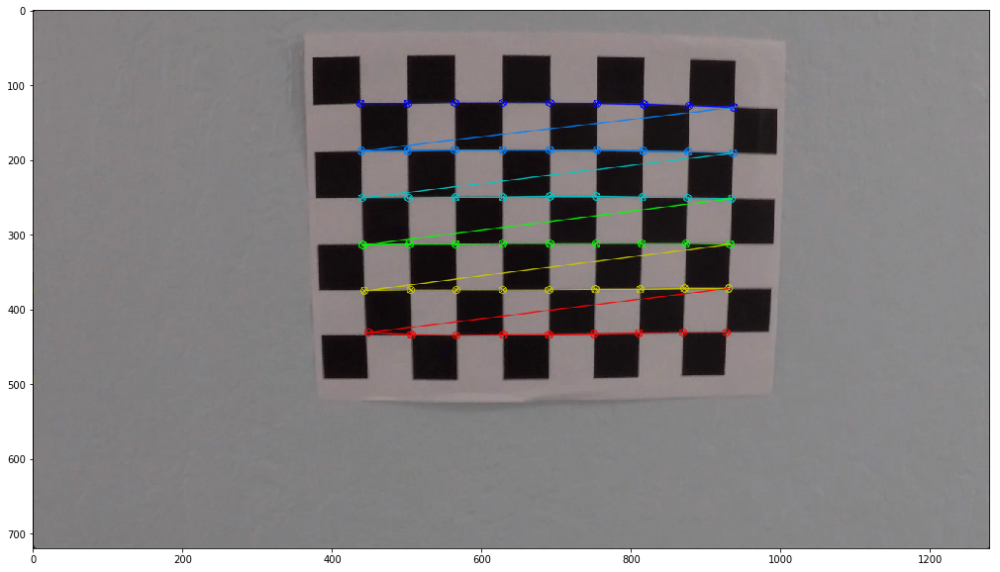

In [6]:
big_plot(img)

### 1.2 Camera Calibration

In [8]:
def calibrate_camera(img, objpoints, imgpoints):
    
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    
    return cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

img = mpimg.imread('camera_cal/calibration2.jpg')

et, mtx, dist, rvecs, tvecs = calibrate_camera(img, objpoints, imgpoints)

### 1.3 Distortion correction

In [11]:
def cal_undistort(img):

    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undist

### 1.4 Test examples

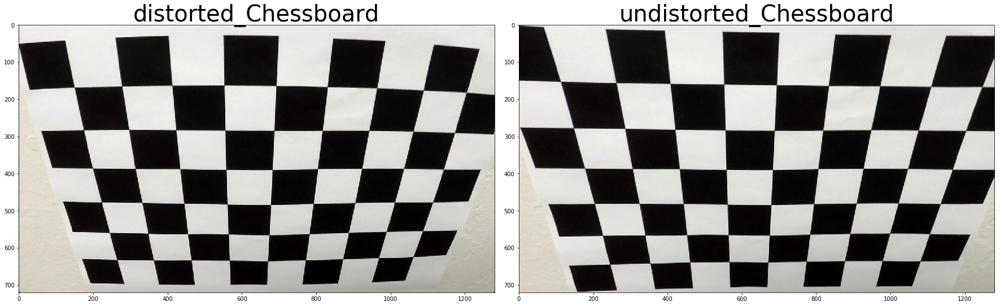

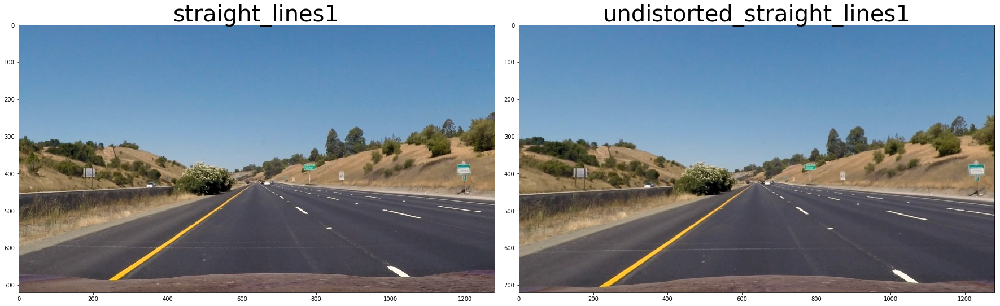

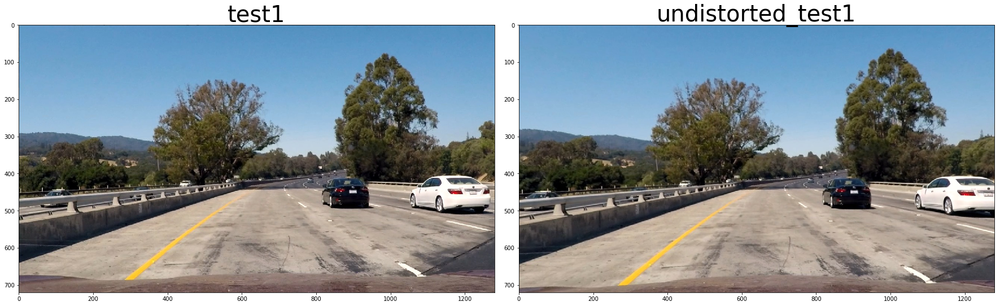

In [12]:
distorted_Chessboard = mpimg.imread('camera_cal/calibration2.jpg')
undistorted_Chessboard = cal_undistort(distorted_Chessboard)
cv2.imwrite('output_images/undistorted_calibration2.jpg',cv2.cvtColor(undistorted_Chessboard, cv2.COLOR_RGB2BGR))

# apply the distortion correction to one of the test images
#test 1
img_1 = mpimg.imread('test_images/straight_lines1.jpg')
undist_1 = cal_undistort(img_1)
cv2.imwrite('output_images/undistorted_straight_lines1.jpg',cv2.cvtColor(undist_1, cv2.COLOR_RGB2BGR))

# test 2
img_2 = mpimg.imread('test_images/straight_lines2.jpg')
undist_2 = cal_undistort(img_2)
cv2.imwrite('output_images/undistorted_straight_lines2.jpg',cv2.cvtColor(undist_2, cv2.COLOR_RGB2BGR))

# test 3
img_3 = mpimg.imread('test_images/test1.jpg')
undist_3 = cal_undistort(img_3)
cv2.imwrite('output_images/undistorted_test1.jpg',cv2.cvtColor(undist_3, cv2.COLOR_RGB2BGR))

img_4 = mpimg.imread('test_images/test2.jpg')
undist_4 = cal_undistort(img_4)
cv2.imwrite('output_images/undistorted_test2.jpg',cv2.cvtColor(undist_4, cv2.COLOR_RGB2BGR))

side_by_side_plot(distorted_Chessboard, undistorted_Chessboard, 'distorted_Chessboard', 'undistorted_Chessboard')
side_by_side_plot(img_1, undist_1,'straight_lines1','undistorted_straight_lines1')
side_by_side_plot(img_3, undist_3,'test1','undistorted_test1')



# 2. Color transforms, Gradients

We will be using 2 types of gradient thresholds: Along the X axis, directional gradient 

We will apply 3 color thresholds: R & G, L and S channel threshold

### 2.1 Apply sobel on the horizontal gradient

In [13]:
def abs_sobelx_thresh(image):
    
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Apply x  gradient with the OpenCV Sobel() function & take the absolute value
    abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=3))
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= 15) & (scaled_sobel <= 200)] = 1
    
    return grad_binary

### 2.2 Apply gradient direction threshold to detect edges closer to vertical

In [14]:
def dir_threshold(image):

    # 1) Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=19)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=19)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    direction_mag = np.arctan2(abs_sobely , abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    dir_binary = np.zeros_like(direction_mag)
    dir_binary[(direction_mag >= np.pi/6) & (direction_mag <= np.pi/2)] = 1
    # 6) Return this mask as your binary_output image
    return dir_binary

### 2.3 S_channel performs good for detecting bright yellow and white lanes

In [15]:
def treshold_S_channel(image):
    
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    # Threshold S_channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= 100) & (s_channel <= 255)] = 1

    return s_binary

### 2.4 Red & Green thresholds so that yellow lanes are fully detected

In [16]:
def Red_Green_tresh(image):
    
    R = image[:,:,0]
    G = image[:,:,1]
    R_G_combined = np.zeros_like(R)
    r_g_combined = (R > 155) & (G > 155)
    
    return r_g_combined

### 2.5 L_channel to keep clear shadowed pixels 

In [17]:
def treshold_L_channel(image):
    
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= 120) & (l_channel <= 255)] = 1

    return l_binary

###  2.6 Color channel and gradient thresholds combined

In [18]:
# image input should be undistorted

def get_optimal_treshold(image):

    sobel_x_binary = abs_sobelx_thresh(image)
    dir_binary = dir_threshold(image)
    combined_grad_dir = ((sobel_x_binary == 1) & (dir_binary == 1))
    
    S_binary = treshold_S_channel(image)
    L_binary = treshold_L_channel(image)
    R_G_binary = Red_Green_tresh(image)
    
    # combine all the thresholds
    # A pixel should either be a yellowish or whiteish
    # And it should also have a gradient, as per our thresholds
    R = img[:,:,0]
    optimal_treshold = np.zeros_like(image)
    optimal_treshold = (((R_G_binary== 1) & (L_binary== 1)) & ((S_binary== 1) | (combined_grad_dir== 1)))
    optimal_treshold = np.array(optimal_treshold, dtype=np.uint8)
    
    return optimal_treshold

### 2.7 Test examples

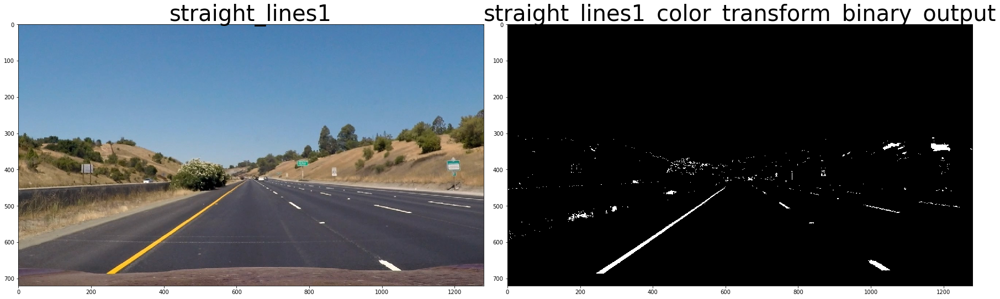

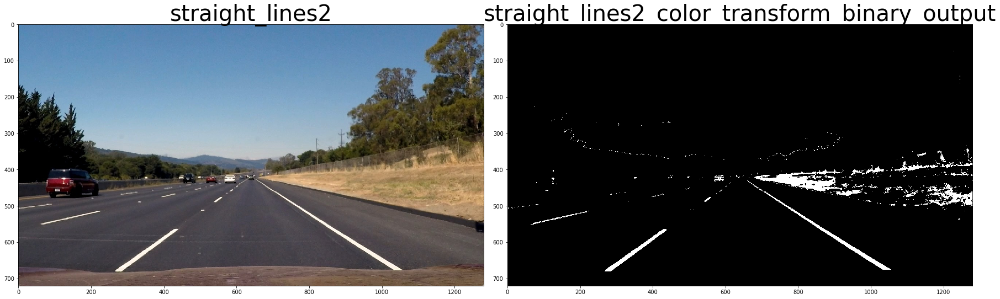

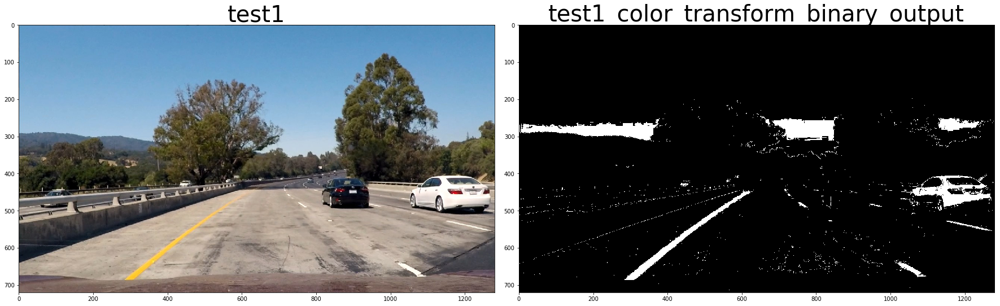

In [19]:
#test 1
img_1 = mpimg.imread('test_images/straight_lines1.jpg')
binary_grad_1 = get_optimal_treshold(img_1)
#cv2.imwrite('../output_images/straight_lines1_color_transform_binary_output.jpg',binary_grad_1)

# test 2
img_2 = mpimg.imread('test_images/straight_lines2.jpg')
binary_grad_2 = get_optimal_treshold(img_2)
#cv2.imwrite('../output_images/straight_lines2_color_transform_binary_output.jpg',binary_grad_2)

# test 3
img_3 = mpimg.imread('test_images/test1.jpg')
binary_grad_3 = get_optimal_treshold(img_3)
#cv2.imwrite('../output_images/test1_color_transform_binary_output.jpg',binary_grad_3)

side_by_side_plot(img_1, binary_grad_1, 'straight_lines1', 'straight_lines1_color_transform_binary_output')
side_by_side_plot(img_2, binary_grad_2,'straight_lines2','straight_lines2_color_transform_binary_output')
side_by_side_plot(img_3, binary_grad_3,'test1','test1_color_transform_binary_output')

# 3. Perspective Transform

Now that we can undistort images and performing thresholds in order to detect useful informations, we need to focus our information selection only at the portion of the image we are interested in -> the road.

To focus on that portion of the image we will then transform the binary image to show the birds eye view. 

### 3.1 Perspective transform function

In [20]:
def PerspectiveTransform(img):
    
    img_size = (img.shape[1], img.shape[0])
    offset = 100
    x_dim, y_dim = img.shape[1], img.shape[0]

    middle_x = x_dim//2

    top_y = 2*y_dim//3

    top_margin = 95

    bottom_margin = 470
    
    points = [
        (middle_x-top_margin, top_y),
        (middle_x+top_margin, top_y),
        (middle_x+bottom_margin, y_dim),
        (middle_x-bottom_margin, y_dim)
    ]
    src = np.float32(points)
    
    dst = np.float32([
        (middle_x-bottom_margin, 0),
        (middle_x+bottom_margin, 0),
        (middle_x+bottom_margin, y_dim),
        (middle_x-bottom_margin, y_dim)
    ])

    M = cv2.getPerspectiveTransform(src, dst)
    inv_M = cv2.getPerspectiveTransform(dst, src)
        # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size)
    # Return the resulting image and matrix
    return warped, M, inv_M

### 3.2 Test examples

we will use a road image with straight lines

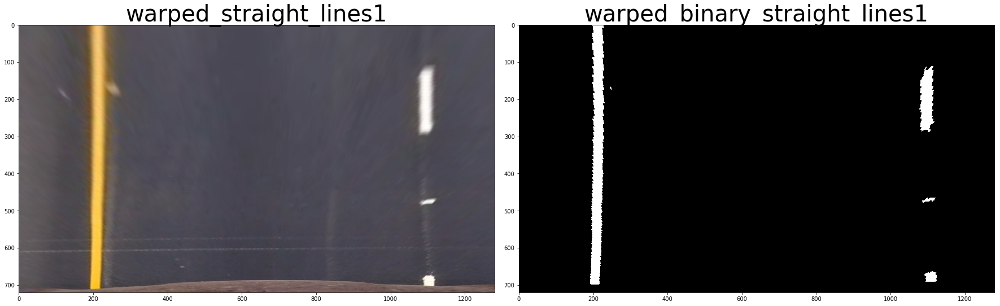

In [21]:
# Inputs should be undistorted images

test1, perspective_M, inv_perspective_M  = PerspectiveTransform(undist_1)
cv2.imwrite('output_images/warped_straight_lines1.jpg',cv2.cvtColor(test1, cv2.COLOR_RGB2BGR))

binary_test1, perspective_M, inv_perspective_M  = PerspectiveTransform(binary_grad_1)

side_by_side_plot(test1, binary_test1, 'warped_straight_lines1', 'warped_binary_straight_lines1')

# 4. Line Finding Method

### 4.1 Histogram

After applying calibration, thresholding, and a perspective transform to the image, we have a binary image where the lane lines stand out clearly. However, you still need to decide explicitly which pixels are part of the lines and which belong to the left line and which belong to the right line. Plotting peaks in a histogram of where the binary activations occur across the image is one potential solution for this

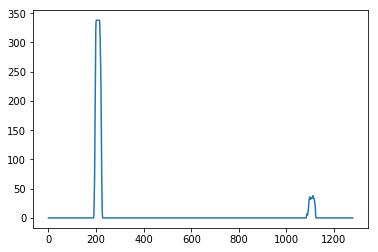

In [22]:
# We grab only the bottom half of the image
# Lane lines are likely to be mostly vertical nearest to the car
bottom_half = binary_test1[binary_test1.shape[0]//2:,:]
histogram = np.sum(bottom_half, axis=0)
plt.plot(histogram)

### 4.2 Sliding Windows 

With this histogram we are adding up the pixel values along each column in the image. In our thresholded binary image, pixels are either 0 or 1, so the two most prominent peaks in this histogram will be good indicators of the x-position of the base of the lane lines. We can use that as a starting point for where to search for the lines. From that point, we can use a sliding window, placed around the line centers, to find and follow the lines up to the top of the frame.

Blind_search method below shows how to get those pixels

In [23]:
def blind_search(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    output_visualize = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 200

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(output_visualize,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(255,0,0), 2) 
        cv2.rectangle(output_visualize,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(255,0,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        left_inds = (
            (nonzeroy >= win_y_low)&
            (nonzeroy < win_y_high)&
            (nonzerox >= win_xleft_low)&
            (nonzerox < win_xleft_high)
        ).nonzero()[0]
        
        right_inds = (
            (nonzeroy >= win_y_low) &
            (nonzeroy < win_y_high) &
            (nonzerox >= win_xright_low)&
            (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(left_inds)
        right_lane_inds.append(right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        
        if len(left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[left_inds]))
        if len(right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    
    left_X = nonzerox[left_lane_inds]
    left_Y = nonzeroy[left_lane_inds] 
    right_X = nonzerox[right_lane_inds]
    right_Y = nonzeroy[right_lane_inds]
    
    return left_X, left_Y, right_X, right_Y, output_visualize

### 4.3 Fit a Polynomial

Now that we have found all our pixels belonging to each line through the sliding window method, it's time to fit a polynomial to the line.

In [47]:
def fit_polynomial(binary_warped):
    
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = blind_search(binary_warped)
    
    if (len(leftx) == 0)| (len(lefty) == 0) |(len(rightx) == 0)| (len(righty) == 0) :
        left_fit =[0,0,0]
        right_fit =[0,0,0]
    else:
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
        
    ## Visualization ##
    out_img[lefty, leftx] = [0, 255, 0] 
    out_img[righty, rightx] = [255, 255, 0]  
    
    #Plots the left and right polynomials on the lane lines
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    
    
    return  left_fitx, right_fitx, ploty, out_img

### 4.4 Blind search test example

True

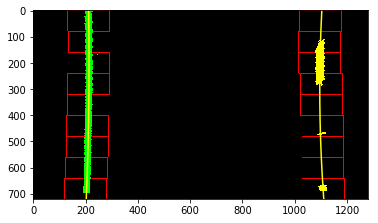

In [46]:
# Test_ lane pixel detection
# Load test image
binary_warped = binary_test1
left_fitx, right_fitx, ploty, lane_detection = fit_polynomial(binary_warped)
plt.imshow(lane_detection)
cv2.imwrite('output_images/lane_detection_warped_straight_lines1.jpg',cv2.cvtColor(lane_detection, cv2.COLOR_RGB2BGR))


### 4.5 Skiping windows transition algorithm : prediction search

You've now built an algorithm that uses sliding windows to track the lane lines out into the distance. However, using the full algorithm from before and starting fresh on every frame may seem inefficient, as the lane lines don't necessarily move a lot from frame to frame.

In the next frame of video we don't need to do a blind search over and over, but instead we can just search in a margin around the previous lane line position. Once we know where the lines are in one frame of video, we can do a highly targeted search for them in the next frame.

This is equivalent to using a customized region of interest for each frame of video, and should help you track the lanes through sharp curves and tricky conditions. If we lose track of the lines, we go back to your sliding windows search.

In [26]:
# Polynomial fit values from the previous frame
# We grab the actual values from the test image used in section 4.4 !
leftx, lefty, rightx, righty, out_img = blind_search(binary_warped)
left_fit1 = np.polyfit(lefty, leftx, 2)
right_fit1 = np.polyfit(righty, rightx, 2)

left_fit = left_fit1
right_fit = right_fit1

def prediction_search(binary_warped):

    margin = 100
    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty, out_img = fit_polynomial(binary_warped)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result


### 4.6 Prediction search test example

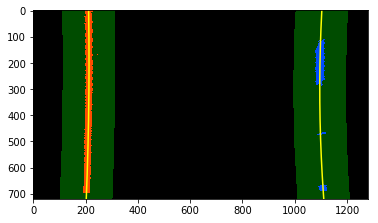

In [27]:
# Test_ lane pixel detection
# Load test image(same as section 4.4)
test_prediction_search = prediction_search(binary_warped)
cv2.imwrite('output_images/prediction_search_lane_detection_warped_straight_lines1.jpg',cv2.cvtColor(test_prediction_search, cv2.COLOR_RGB2BGR))

# View your output
plt.imshow(test_prediction_search)

# 5. Lane metrics

### 5.1 Lane curvature

In [28]:
def measure_curvature(binary_warped):

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    # data detection using blind search
    leftx, lefty, rightx, righty, out_img = blind_search(binary_warped)
    #fit poly
    if (len(leftx) == 0)| (len(lefty) == 0) |(len(rightx) == 0)| (len(righty) == 0) :
        left_fit_cr =[0,0,0]
        right_fit_cr =[0,0,0]
    else:
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = binary_warped.shape[0]
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad

### 5.2 Center of the lane

In [29]:
def get_center_distance(binary_warped):
    
    left_fitx, right_fitx, ploty, out_image = fit_polynomial(binary_warped)
    lane_width = right_fitx[-1] - left_fitx[-1]
    lane_mid = lane_width/2 + left_fitx[-1]
    lane_width_m = 3.7
    center_distance = lane_width_m*((lane_mid- binary_warped.shape[1]//2)/lane_width)
    
    return center_distance

### 5.3 Draw function

In [30]:
def draw_lane(original_img,binary_warped, left_fitx,right_fitx,ploty, inv_perspective_M):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, inv_perspective_M, (binary_warped.shape[1], binary_warped.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(original_img, 1, newwarp, 0.3, 0)

    return result


### 5.4  Draw values function : curvatures, center

In [31]:
def draw_values(img,left_curvature,right_curvature, center_distance):
    
        offset_y = 100
        offset_x = 100

        template = "{0:17}{1:17}{2:17}"
        txt_header = template.format("Left Curvature", "Right Curvature", "Center offset and Alignment")
        print(txt_header)
        txt_values = template.format("{:.4f}m".format(left_curvature),
                                     "{:.4f}m".format(right_curvature),
                                     "{:.4f}m Right".format(center_distance))
        if center_distance < 0.0:
            txt_values = template.format("{:.4f}m".format(left_curvature),
                                         "{:.4f}m".format(right_curvature),
                                         "{:.4f}m Left".format(math.fabs(center_distance)))

        print(txt_values)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(img, txt_header, (offset_x, offset_y), font, 1, (255, 255, 255), 1, cv2.LINE_AA)
        cv2.putText(img, txt_values, (offset_x, offset_y + 50), font, 1, (255, 255, 255), 2, cv2.LINE_AA)
        
        return img

# 6 The Complete pipeline¶


With all the parts of the lane-detection pipeline complete, let's combine them into a single pipeline function

### 6.1 Lane detection main pipeline

In [32]:
def detect_lane_pipeline(image):

    undist = cal_undistort(image)
    threshed = get_optimal_treshold(undist)
    warped, M, Minv = PerspectiveTransform(threshed)
    
    left_x, right_x, ploty, out_image  = fit_polynomial(warped)
    
    left_curvature, right_curvature = measure_curvature(warped)
    center = get_center_distance(warped)
    
    drawn_img = draw_lane(image,warped, left_x, right_x, ploty,Minv)
    drawn_img_with_values = draw_values(drawn_img,left_curvature,right_curvature, center)
    
    return drawn_img_with_values, left_curvature, right_curvature, center

### 6.2 Test example

Left Curvature   Right Curvature  Center offset and Alignment
1961.5624m       1235.0590m       0.3146m Right    


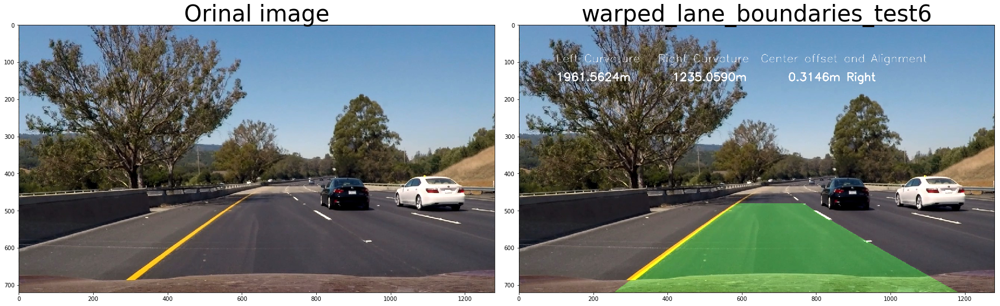

In [33]:
test_pipeline = mpimg.imread('test_images/test6.jpg')
warped_lane_boundaries, left_curverad, right_curverad, center = detect_lane_pipeline(test_pipeline)
cv2.imwrite('output_images/warped_lane_boundaries_test6.jpg',cv2.cvtColor(warped_lane_boundaries, cv2.COLOR_RGB2BGR))

side_by_side_plot(test_pipeline, warped_lane_boundaries, 'Orinal image', 'warped_lane_boundaries_test6')

# 7. Lane Class

Let's define a class to receive the characteristics of each line detection

In [34]:
class Lane():
    def __init__(self):
        self.left_fit = None
        self.right_fit = None
        self.ploty = None
        self.left_fitx = None
        self.right_fitx = None
        self.binary_warped = None
        self.left_curvature = None
        self.right_curvature = None
        self.center_distance = None

In [35]:
def blind_search_class(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 200

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Identify the nonzero pixels in x and y within the window #
        left_inds = (
            (nonzeroy >= win_y_low)&
            (nonzeroy < win_y_high)&
            (nonzerox >= win_xleft_low)&
            (nonzerox < win_xleft_high)
        ).nonzero()[0]
        
        right_inds = (
            (nonzeroy >= win_y_low) &
            (nonzeroy < win_y_high) &
            (nonzerox >= win_xright_low)&
            (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(left_inds)
        right_lane_inds.append(right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[left_inds]))
        if len(right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    left_X = nonzerox[left_lane_inds]
    left_Y = nonzeroy[left_lane_inds] 
    right_X = nonzerox[right_lane_inds]
    right_Y = nonzeroy[right_lane_inds]
    
    #left_fit = np.polyfit(left_Y, left_X, 2)
    #right_fit = np.polyfit(right_Y, right_X, 2)
    
    # Fit a second order polynomial to each using `np.polyfit`
    if (len(left_X) == 0)| (len(left_Y) == 0) |(len(right_X) == 0)| (len(right_Y) == 0) :
        left_fit =[0,0,0]
        right_fit =[0,0,0]
    else:
        left_fit = np.polyfit(left_Y, left_X, 2)
        right_fit = np.polyfit(right_Y, right_X, 2)


    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
        
    #left_curvature, right_curvature = measure_curvature(binary_warped)
    #center = get_center_distance(binary_warped)
    left_curvature, right_curvature = measure_curvature(binary_warped)
    center = get_center_distance(binary_warped)
    
    lane = Lane()
    
    lane.left_fit = left_fit
    lane.right_fit = right_fit
    lane.ploty = ploty
    lane.left_fitx = left_fitx
    lane.right_fitx = right_fitx
    lane.binary_warped = binary_warped
    lane.left_curvature = left_curvature
    lane.right_curvature = right_curvature
    lane.center_distance = center
        
    return lane

In [36]:
def draw_lane_class(original_img,lane):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(lane.binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([lane.left_fitx, lane.ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([lane.right_fitx, lane.ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, inv_perspective_M, (lane.binary_warped.shape[1], lane.binary_warped.shape[0])) 
    # Combine the result with the original image
    lane_drawn = cv2.addWeighted(original_img, 1, newwarp, 0.3, 0)
    lane_drawn = draw_values_class(lane_drawn,lane)

    return lane_drawn

In [37]:
def draw_values_class(img,lane):
    
        offset_y = 100
        offset_x = 100

        template = "{0:17}{1:17}{2:17}"
        txt_header = template.format("Left Curvature", "Right Curvature", "Center offset and Alignment")
        print(txt_header)
        txt_values = template.format("{:.4f}m".format(lane.left_curvature),
                                     "{:.4f}m".format(lane.right_curvature),
                                     "{:.4f}m Right".format(lane.center_distance))
        if lane.center_distance < 0.0:
            txt_values = template.format("{:.4f}m".format(lane.left_curvature),
                                         "{:.4f}m".format(lane.right_curvature),
                                         "{:.4f}m Left".format(math.fabs(lane.center_distance)))

        print(txt_values)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(img, txt_header, (offset_x, offset_y), font, 1, (255, 255, 255), 1, cv2.LINE_AA)
        cv2.putText(img, txt_values, (offset_x, offset_y + 50), font, 1, (255, 255, 255), 2, cv2.LINE_AA)
        
        return img

### 7.1 Lane detection main pipeline using class

In [38]:
def detect_lane_pipe_class(image):

    undist = cal_undistort(image)
    
    threshed = get_optimal_treshold(undist)
    
    warped, M, inv_perspective_M = PerspectiveTransform(threshed)

    lane = blind_search_class(warped)
    
    drawn_img = draw_lane_class(image,lane)
    
    return drawn_img

### 7.2 Test example

Left Curvature   Right Curvature  Center offset and Alignment
1961.5624m       1235.0590m       0.3146m Right    


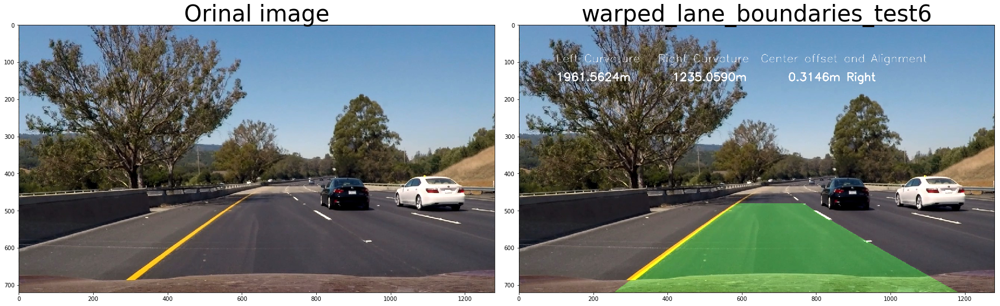

In [39]:
warped_lane_boundaries_class = detect_lane_pipe_class(mpimg.imread('test_images/test6.jpg'))
side_by_side_plot(test_pipeline, warped_lane_boundaries_class, 'Orinal image', 'warped_lane_boundaries_test6')

### 7.3 Testing the quality's lane

In [40]:
# Filtering & testing whether a new lane is appropriate compared to previously found lanes
def lane_quality(lane):
    
    global previous_lanes  # list of previous detected lanes
    
    good_line_difference = True # boolean variable : the result of the comparison  
    good_lane_area = True
    
    # Measure the total x-pixel difference between the new and the old line
    # If we don't have any previous lanes yet, just assume True
    if len(previous_lanes) > 0:
        previous_left_fitx = previous_lanes[0].left_fitx
        previous_right_fitx = previous_lanes[0].right_fitx
        if len(lane.left_fitx)==0 | len(lane.right_fitx)==0 :
            current_left_fitx = previous_lanes[-1].left_fitx
            current_right_fitx = previous_lanes[-1].right_fitx
        else :
            current_left_fitx = lane.left_fitx
            current_right_fitx = lane.right_fitx
        
        left_difference = np.sum(np.absolute(previous_left_fitx - current_left_fitx))
        right_difference = np.sum(np.absolute(previous_right_fitx - current_right_fitx))
        margin = 45  # How much different the new lane's X_values can be from the last lane
        threshold_pixel = margin*len(previous_left_fitx)
        
        if left_difference > threshold_pixel or right_difference > threshold_pixel:
            good_line_difference = False
        
        # Make sure the area between the lane lines is appropriate (not too small or large)
        lane_area = np.sum(np.absolute(np.subtract(lane.right_fitx, lane.left_fitx)))
        area_min, area_max = 450000, 750000  # Area thesholds
        if lane_area < area_min or lane_area > area_max:
            good_lane_area = False # Bad lane area
        
    return (good_line_difference and good_lane_area)

### 7.4 Averaging and smoothing

In [41]:
# Smoothing - Averages : we take an average over n past measurements to obtain a smoothing lane detection.

def average_lane():
    
    global previous_lanes
    
    if len(previous_lanes) == 0: return None
    elif len(previous_lanes) == 1: return previous_lanes[0]
    else:  # More than 1 previous result to average together
        num_lanes = len(previous_lanes) # num of lanes to average over
        new_lane = previous_lanes[0]
        
        average_lane = Lane()  # The averaged lane we will return (with some defaults)
        average_lane.ploty = new_lane.ploty
        average_lane.binary_warped = new_lane.binary_warped

        # Average the left and right lanes' x-values
        left_average = new_lane.left_fitx
        right_average = new_lane.right_fitx
        for i in range(1, num_lanes):
            left_average = np.add(left_average, previous_lanes[i].left_fitx)
            right_average = np.add(right_average, previous_lanes[i].right_fitx)

        average_lane.left_fitx = left_average / num_lanes
        average_lane.right_fitx = right_average / num_lanes
        
        # Average the curvatures and distance to center
        average_lane.left_curvature = sum([lane.left_curvature for lane in previous_lanes])/num_lanes
        average_lane.right_curvature = sum([lane.right_curvature for lane in previous_lanes])/num_lanes
        average_lane.center_distance = sum([lane.center_distance for lane in previous_lanes])/num_lanes

        return average_lane

### 7.5 Averaging and smoothing Pipeline

In [42]:
def detect_lane_pipe_class_avg_smoothing(image):
    
    global previous_lanes
    global number_bad_lanes
    
        
    number_lanes_to_avg = 5  # Number of lanes to average over
        
    undist = cal_undistort(image)
    threshed = get_optimal_treshold(undist)
    warped, M, inv_perspective_M = PerspectiveTransform(threshed)
    lane = blind_search_class(warped)
    
    if len(lane.left_fit)==0 | len(lane.right_fit)==0: return image    
    if lane_quality(lane):  # If the lane is good (compared to previous lanes), add it to the list
        number_bad_lanes = 0
        previous_lanes.insert(0, lane)
        if len(previous_lanes) > number_lanes_to_avg: previous_lanes.pop() # clear the list
    else:
        number_bad_lanes += 1
        
    # RESET If too many bad lanes detected.
    if number_bad_lanes >= 10:
        number_bad_lanes = 0
        previous_lanes = []
        
    # If we start with some bad lanes, this will just skip the drawing
    if len(previous_lanes) == 0: return image
            
    return draw_lane_class(image, average_lane())


### 7.6 Test example

Left Curvature   Right Curvature  Center offset and Alignment
1961.5624m       1235.0590m       0.3146m Right    


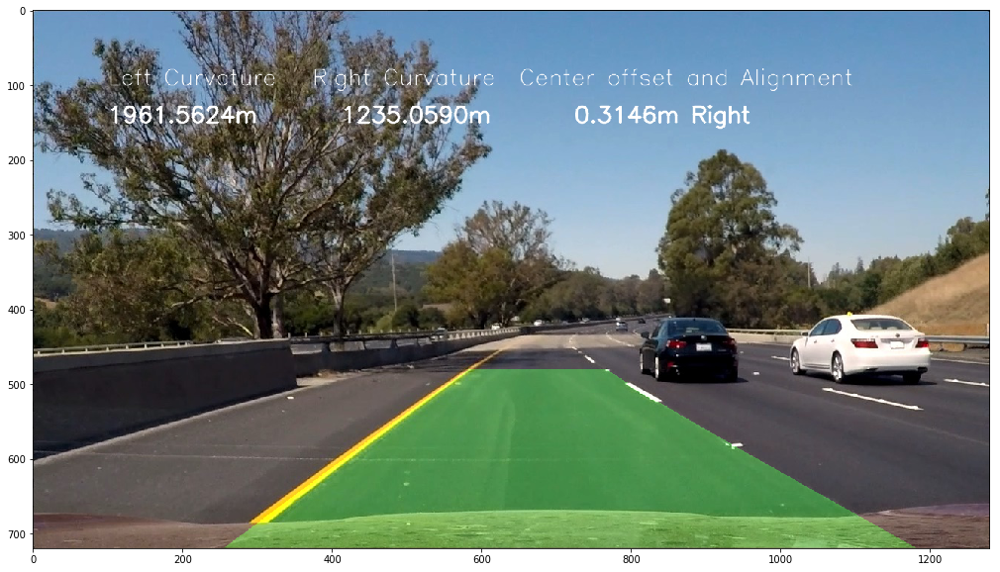

In [43]:
number_bad_lanes = 0
previous_lanes = []
test_avg_smoothing = detect_lane_pipe_class_avg_smoothing(mpimg.imread('test_images/test6.jpg'))
big_plot(test_avg_smoothing)

# 8. Test on Video

In [44]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip

### 8.1 Project video

In [44]:
number_bad_lanes = 0
previous_lanes = []

project_video_path = "project_video.mp4"
project_video_output_path = 'output_videos/lanes_detection_project_video.mp4'

clip1 = VideoFileClip(project_video_path)

project_video_clip = clip1.fl_image(detect_lane_pipe_class_avg_smoothing) 

%time project_video_clip.write_videofile(project_video_output_path, audio=False)


Left Curvature   Right Curvature  Center offset and Alignment
1882.6441m       2404.9424m       0.4153m Right    
[MoviePy] >>>> Building video ../output_videos/lanes_detection_project_video.mp4
[MoviePy] Writing video ../output_videos/lanes_detection_project_video.mp4



  0%|          | 1/1261 [00:00<05:07,  4.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1882.6441m       2404.9424m       0.4153m Right    



  0%|          | 2/1261 [00:00<05:13,  4.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1801.2843m       2002.8835m       0.4121m Right    



  0%|          | 3/1261 [00:00<05:08,  4.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1706.3115m       1932.2916m       0.4119m Right    



  0%|          | 4/1261 [00:00<05:06,  4.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1610.7521m       2004.7579m       0.4122m Right    



  0%|          | 5/1261 [00:01<05:04,  4.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1458.7351m       2063.7046m       0.4120m Right    



  0%|          | 6/1261 [00:01<05:01,  4.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1314.9767m       2464.8308m       0.4130m Right    



  1%|          | 7/1261 [00:01<04:59,  4.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1236.4592m       2957.0899m       0.4169m Right    



  1%|          | 8/1261 [00:01<04:59,  4.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1203.7892m       3040.4900m       0.4290m Right    



  1%|          | 9/1261 [00:02<04:56,  4.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1227.2178m       3133.2468m       0.4346m Right    



  1%|          | 10/1261 [00:02<04:51,  4.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1259.9969m       3201.9960m       0.4431m Right    



  1%|          | 11/1261 [00:02<04:50,  4.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1273.9572m       3198.9451m       0.4473m Right    



  1%|          | 12/1261 [00:02<04:47,  4.34it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1282.8635m       3270.0953m       0.4494m Right    



  1%|          | 13/1261 [00:03<04:48,  4.33it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1283.0624m       2964.2215m       0.4355m Right    



  1%|          | 14/1261 [00:03<04:46,  4.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1262.2225m       2611.1262m       0.4307m Right    



  1%|          | 15/1261 [00:03<04:47,  4.34it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1244.2267m       2401.6203m       0.4253m Right    



  1%|▏         | 16/1261 [00:03<04:46,  4.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1231.0040m       1794.5549m       0.4208m Right    



  1%|▏         | 17/1261 [00:04<04:49,  4.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1203.7304m       1402.4412m       0.4168m Right    



  1%|▏         | 18/1261 [00:04<04:49,  4.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1190.1827m       1799.8287m       0.4194m Right    



  2%|▏         | 19/1261 [00:04<04:49,  4.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1201.9218m       2941.0285m       0.4188m Right    



  2%|▏         | 20/1261 [00:04<04:48,  4.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1277.0119m       3605.3225m       0.4163m Right    



  2%|▏         | 21/1261 [00:04<04:49,  4.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1437.1213m       3532.2382m       0.4223m Right    



  2%|▏         | 22/1261 [00:05<04:50,  4.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1753.6357m       3321.2214m       0.4273m Right    



  2%|▏         | 23/1261 [00:05<04:53,  4.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2610.8344m       3681.0898m       0.4247m Right    



  2%|▏         | 24/1261 [00:05<04:54,  4.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3170.7205m       3763.7222m       0.4200m Right    



  2%|▏         | 25/1261 [00:05<04:51,  4.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3899.6238m       4033.6481m       0.4138m Right    



  2%|▏         | 26/1261 [00:06<04:50,  4.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4793.1057m       4267.8828m       0.3974m Right    



  2%|▏         | 27/1261 [00:06<04:48,  4.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5341.2711m       4262.0319m       0.3811m Right    



  2%|▏         | 28/1261 [00:06<04:52,  4.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5175.9155m       3587.5960m       0.3723m Right    



  2%|▏         | 29/1261 [00:06<04:51,  4.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5088.2079m       2494.6814m       0.3664m Right    



  2%|▏         | 30/1261 [00:07<04:52,  4.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4484.8950m       1538.6545m       0.3596m Right    



  2%|▏         | 31/1261 [00:07<04:51,  4.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3544.4476m       1848.3796m       0.3567m Right    



  3%|▎         | 32/1261 [00:07<04:52,  4.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2731.4323m       2280.0900m       0.3544m Right    



  3%|▎         | 33/1261 [00:07<04:51,  4.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2102.4215m       2627.4456m       0.3527m Right    



  3%|▎         | 34/1261 [00:08<04:47,  4.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1630.9768m       3069.8745m       0.3560m Right    



  3%|▎         | 35/1261 [00:08<04:48,  4.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1478.3797m       4495.6111m       0.3602m Right    



  3%|▎         | 36/1261 [00:08<04:46,  4.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1399.3866m       4178.0104m       0.3627m Right    



  3%|▎         | 37/1261 [00:08<04:45,  4.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1397.4805m       4263.6072m       0.3672m Right    



  3%|▎         | 38/1261 [00:08<04:43,  4.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1357.9542m       4074.9064m       0.3698m Right    



  3%|▎         | 39/1261 [00:09<04:43,  4.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1357.3193m       3629.1167m       0.3664m Right    



  3%|▎         | 40/1261 [00:09<04:41,  4.33it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1318.6648m       2249.3212m       0.3654m Right    



  3%|▎         | 41/1261 [00:09<04:40,  4.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1299.9220m       2072.2300m       0.3656m Right    



  3%|▎         | 42/1261 [00:09<04:41,  4.34it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1257.8982m       1631.3257m       0.3663m Right    



  3%|▎         | 43/1261 [00:10<06:25,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1205.2500m       1760.3444m       0.3695m Right    



  3%|▎         | 44/1261 [00:10<06:23,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1151.6525m       2058.1816m       0.3729m Right    



  4%|▎         | 45/1261 [00:11<06:26,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1110.8391m       2299.3131m       0.3758m Right    



  4%|▎         | 46/1261 [00:11<06:28,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1070.1458m       2312.6321m       0.3906m Right    



  4%|▎         | 47/1261 [00:11<06:29,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1040.1631m       2388.5077m       0.4009m Right    



  4%|▍         | 48/1261 [00:11<06:15,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1037.7278m       2754.5271m       0.4059m Right    



  4%|▍         | 49/1261 [00:12<06:26,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1043.3210m       2876.8133m       0.4081m Right    



  4%|▍         | 50/1261 [00:12<06:16,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1037.8061m       2777.3460m       0.4092m Right    



  4%|▍         | 51/1261 [00:12<06:23,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1039.6392m       3921.0687m       0.3992m Right    



  4%|▍         | 52/1261 [00:13<06:12,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1037.2070m       3848.6595m       0.3910m Right    



  4%|▍         | 53/1261 [00:13<06:32,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1046.2470m       3330.2089m       0.3873m Right    



  4%|▍         | 54/1261 [00:13<06:27,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1062.7382m       2802.2330m       0.3855m Right    



  4%|▍         | 55/1261 [00:14<06:38,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1080.3653m       2456.9192m       0.3836m Right    



  4%|▍         | 56/1261 [00:14<06:25,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1105.3117m       1468.6435m       0.3823m Right    



  5%|▍         | 57/1261 [00:14<06:38,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1179.1738m       1636.2198m       0.3829m Right    



  5%|▍         | 58/1261 [00:15<06:25,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1282.9071m       1740.4238m       0.3829m Right    



  5%|▍         | 59/1261 [00:15<06:35,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1422.0893m       1845.7147m       0.3922m Right    



  5%|▍         | 60/1261 [00:15<06:24,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1707.6665m       3288.5473m       0.3959m Right    



  5%|▍         | 61/1261 [00:16<06:34,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2108.1350m       3374.6480m       0.3945m Right    



  5%|▍         | 62/1261 [00:16<06:22,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2673.4205m       3539.2724m       0.3913m Right    



  5%|▍         | 63/1261 [00:16<06:38,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3462.5440m       3221.4434m       0.3810m Right    



  5%|▌         | 64/1261 [00:17<06:24,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4094.6607m       3573.3616m       0.3662m Right    



  5%|▌         | 65/1261 [00:17<06:56,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4587.9240m       2338.3825m       0.3549m Right    



  5%|▌         | 66/1261 [00:18<07:53,  2.52it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4557.3743m       2290.1150m       0.3454m Right    



  5%|▌         | 67/1261 [00:18<08:53,  2.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4239.9569m       1936.9772m       0.3347m Right    



  5%|▌         | 68/1261 [00:19<08:54,  2.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3514.5906m       2407.8986m       0.3299m Right    



  5%|▌         | 69/1261 [00:19<09:12,  2.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2813.1010m       2050.6421m       0.3187m Right    



  6%|▌         | 70/1261 [00:19<08:12,  2.42it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2071.7889m       2617.6651m       0.3088m Right    



  6%|▌         | 71/1261 [00:20<07:45,  2.55it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1689.5330m       2361.0054m       0.3095m Right    



  6%|▌         | 72/1261 [00:20<07:11,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1369.3901m       2370.2208m       0.3088m Right    



  6%|▌         | 73/1261 [00:20<07:07,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1199.9031m       2489.3317m       0.3068m Right    



  6%|▌         | 74/1261 [00:21<06:45,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1117.8363m       11821.2573m      0.3051m Right    



  6%|▌         | 75/1261 [00:21<06:43,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1084.9847m       14398.6022m      0.3033m Right    



  6%|▌         | 76/1261 [00:21<06:25,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1113.5379m       14733.2602m      0.2897m Right    



  6%|▌         | 77/1261 [00:22<06:32,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1226.2318m       14696.6196m      0.2794m Right    



  6%|▌         | 78/1261 [00:22<06:23,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1441.8637m       14280.9055m      0.2738m Right    



  6%|▋         | 79/1261 [00:22<06:33,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1880.6949m       4997.7474m       0.2706m Right    



  6%|▋         | 80/1261 [00:23<06:19,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2554.1959m       1852.8340m       0.2674m Right    



  6%|▋         | 81/1261 [00:23<06:27,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3351.9806m       4603.5472m       0.2670m Right    



  7%|▋         | 82/1261 [00:23<06:15,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4934.5544m       5305.1107m       0.2654m Right    



  7%|▋         | 83/1261 [00:24<06:24,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7064.1846m       5803.6502m       0.2610m Right    



  7%|▋         | 84/1261 [00:24<06:14,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10464.4714m      6539.0795m       0.2607m Right    



  7%|▋         | 85/1261 [00:24<06:22,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12112.7043m      7079.7854m       0.2595m Right    



  7%|▋         | 86/1261 [00:24<06:11,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12929.4152m      4945.6628m       0.2548m Right    



  7%|▋         | 87/1261 [00:25<06:18,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11977.8209m      4978.6960m       0.2507m Right    



  7%|▋         | 88/1261 [00:25<06:22,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10191.3367m      4323.3336m       0.2393m Right    



  7%|▋         | 89/1261 [00:25<06:13,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6726.1961m       3402.6836m       0.2259m Right    



  7%|▋         | 90/1261 [00:26<06:23,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4647.1566m       2740.9867m       0.2173m Right    



  7%|▋         | 91/1261 [00:26<06:11,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3262.3198m       1844.6513m       0.2132m Right    



  7%|▋         | 92/1261 [00:26<06:20,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2775.2605m       1317.5181m       0.2124m Right    



  7%|▋         | 93/1261 [00:27<06:10,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2360.5280m       2061.3910m       0.2194m Right    



  7%|▋         | 94/1261 [00:27<06:13,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2069.4997m       3724.6184m       0.2245m Right    



  8%|▊         | 95/1261 [00:27<06:20,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1867.0621m       4773.4587m       0.2254m Right    



  8%|▊         | 96/1261 [00:28<06:08,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1633.9959m       4667.4934m       0.2395m Right    



  8%|▊         | 97/1261 [00:28<06:13,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1411.5914m       4428.2749m       0.2464m Right    



  8%|▊         | 98/1261 [00:28<06:15,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1317.9502m       6446.4651m       0.2473m Right    



  8%|▊         | 99/1261 [00:29<06:04,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1267.3223m       37092.3425m      0.2481m Right    



  8%|▊         | 100/1261 [00:29<06:18,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1267.6145m       36524.8949m      0.2493m Right    



  8%|▊         | 101/1261 [00:29<06:06,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1292.6087m       36764.7776m      0.2347m Right    



  8%|▊         | 102/1261 [00:30<06:18,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1355.6752m       36750.3132m      0.2253m Right    



  8%|▊         | 103/1261 [00:30<06:07,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1421.1779m       34085.6783m      0.2258m Right    



  8%|▊         | 104/1261 [00:30<06:15,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1524.4389m       1822.3981m       0.2276m Right    



  8%|▊         | 105/1261 [00:31<06:06,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1695.0025m       1398.6166m       0.2336m Right    



  8%|▊         | 106/1261 [00:31<06:18,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1778.4993m       1428.7331m       0.2423m Right    



  8%|▊         | 107/1261 [00:31<06:07,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1843.5928m       1770.3921m       0.2527m Right    



  9%|▊         | 108/1261 [00:32<06:14,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1843.3460m       1944.4003m       0.2607m Right    



  9%|▊         | 109/1261 [00:32<06:04,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1854.9610m       2778.0350m       0.2761m Right    



  9%|▊         | 110/1261 [00:32<06:09,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1769.4645m       5807.8861m       0.2855m Right    



  9%|▉         | 111/1261 [00:32<05:56,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1725.7464m       5845.8091m       0.2916m Right    



  9%|▉         | 112/1261 [00:33<06:04,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1664.4817m       6152.6082m       0.2978m Right    



  9%|▉         | 113/1261 [00:33<05:57,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1624.7422m       7477.2839m       0.3039m Right    



  9%|▉         | 114/1261 [00:33<06:09,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1584.1616m       7042.6634m       0.3014m Right    



  9%|▉         | 115/1261 [00:34<06:00,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1558.2831m       3936.7823m       0.3011m Right    



  9%|▉         | 116/1261 [00:34<06:10,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1545.6638m       3937.0139m       0.3046m Right    



  9%|▉         | 117/1261 [00:34<06:01,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1527.5548m       3526.6562m       0.3065m Right    



  9%|▉         | 118/1261 [00:35<06:12,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1506.8338m       2591.3733m       0.3082m Right    



  9%|▉         | 119/1261 [00:35<06:01,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1451.5576m       2572.9945m       0.3098m Right    



 10%|▉         | 120/1261 [00:35<06:09,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1382.6841m       3395.7762m       0.3134m Right    



 10%|▉         | 121/1261 [00:36<06:54,  2.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1345.2011m       3530.6701m       0.3174m Right    



 10%|▉         | 122/1261 [00:36<06:32,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1310.7335m       3568.7981m       0.3299m Right    



 10%|▉         | 123/1261 [00:37<06:34,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1293.0720m       5214.0905m       0.3391m Right    



 10%|▉         | 124/1261 [00:37<06:14,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1271.4712m       8508.8234m       0.3473m Right    



 10%|▉         | 125/1261 [00:37<06:14,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1263.9358m       8238.9920m       0.3538m Right    



 10%|▉         | 126/1261 [00:37<06:00,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1251.1235m       8096.5653m       0.3584m Right    



 10%|█         | 127/1261 [00:38<06:07,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1249.4466m       7854.4733m       0.3549m Right    



 10%|█         | 128/1261 [00:38<05:57,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1263.4026m       5641.3156m       0.3553m Right    



 10%|█         | 129/1261 [00:38<06:06,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1265.0404m       1931.2427m       0.3571m Right    



 10%|█         | 130/1261 [00:39<05:57,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1244.6959m       1389.5297m       0.3601m Right    



 10%|█         | 131/1261 [00:39<06:06,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1210.2909m       1358.2057m       0.3643m Right    



 10%|█         | 132/1261 [00:39<05:56,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1171.7914m       1573.1217m       0.3692m Right    



 11%|█         | 133/1261 [00:40<06:04,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1128.6432m       2068.8853m       0.3744m Right    



 11%|█         | 134/1261 [00:40<06:15,  3.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1106.4472m       3637.5177m       0.3828m Right    



 11%|█         | 135/1261 [00:40<06:14,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1125.1108m       4311.3707m       0.3916m Right    



 11%|█         | 136/1261 [00:41<06:01,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1189.6802m       4689.0687m       0.3998m Right    



 11%|█         | 137/1261 [00:41<06:07,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1266.4237m       4791.4788m       0.4069m Right    



 11%|█         | 138/1261 [00:41<05:51,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1349.8861m       4484.2483m       0.4124m Right    



 11%|█         | 139/1261 [00:42<05:57,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1486.2317m       3128.4853m       0.4170m Right    



 11%|█         | 140/1261 [00:42<05:46,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1628.7938m       2415.6259m       0.4159m Right    



 11%|█         | 141/1261 [00:42<05:58,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1771.5863m       2055.3391m       0.4155m Right    



 11%|█▏        | 142/1261 [00:43<05:49,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1966.0630m       1877.5620m       0.4144m Right    



 11%|█▏        | 143/1261 [00:43<06:00,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2066.4023m       1742.7727m       0.4114m Right    



 11%|█▏        | 144/1261 [00:43<05:52,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2071.1974m       1935.3498m       0.4040m Right    



 11%|█▏        | 145/1261 [00:44<06:01,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2017.7297m       2332.8898m       0.4005m Right    



 12%|█▏        | 146/1261 [00:44<05:53,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1895.8179m       2698.3578m       0.3953m Right    



 12%|█▏        | 147/1261 [00:44<06:03,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1699.5969m       3004.1358m       0.3973m Right    



 12%|█▏        | 148/1261 [00:44<05:54,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1562.5718m       4231.3491m       0.3996m Right    



 12%|█▏        | 149/1261 [00:45<06:05,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1467.1379m       5129.2651m       0.4019m Right    



 12%|█▏        | 150/1261 [00:45<05:58,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1432.2293m       4887.5657m       0.4039m Right    



 12%|█▏        | 151/1261 [00:45<06:07,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1501.6260m       4267.8061m       0.4028m Right    



 12%|█▏        | 152/1261 [00:46<05:54,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1602.9458m       3899.7323m       0.3960m Right    



 12%|█▏        | 153/1261 [00:46<05:58,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1772.9227m       3692.0845m       0.3930m Right    



 12%|█▏        | 154/1261 [00:46<05:47,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2059.6407m       2892.5054m       0.3904m Right    



 12%|█▏        | 155/1261 [00:47<05:57,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2391.7843m       2995.7099m       0.3873m Right    



 12%|█▏        | 156/1261 [00:47<05:47,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2794.7001m       3983.2426m       0.3872m Right    



 12%|█▏        | 157/1261 [00:47<05:57,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2965.5260m       4630.3663m       0.3844m Right    



 13%|█▎        | 158/1261 [00:48<05:48,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3069.9302m       3971.9095m       0.3767m Right    



 13%|█▎        | 159/1261 [00:48<05:58,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2958.3326m       3941.6670m       0.3691m Right    



 13%|█▎        | 160/1261 [00:48<05:49,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2719.1638m       3655.0837m       0.3586m Right    



 13%|█▎        | 161/1261 [00:49<05:55,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2305.4849m       2811.1864m       0.3499m Right    



 13%|█▎        | 162/1261 [00:49<05:42,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2078.1167m       2205.3114m       0.3428m Right    



 13%|█▎        | 163/1261 [00:49<05:53,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1845.7764m       1838.1669m       0.3372m Right    



 13%|█▎        | 164/1261 [00:50<05:43,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1729.9315m       1434.5385m       0.3330m Right    



 13%|█▎        | 165/1261 [00:50<05:50,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1648.0509m       1709.7700m       0.3339m Right    



 13%|█▎        | 166/1261 [00:50<05:39,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1629.5615m       2200.6188m       0.3342m Right    



 13%|█▎        | 167/1261 [00:51<05:48,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1589.7269m       2219.6446m       0.3327m Right    



 13%|█▎        | 168/1261 [00:51<05:37,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1591.1125m       2476.8480m       0.3327m Right    



 13%|█▎        | 169/1261 [00:51<05:47,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1581.5525m       3439.4205m       0.3329m Right    



 13%|█▎        | 170/1261 [00:51<05:36,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1557.8955m       3614.3596m       0.3299m Right    



 14%|█▎        | 171/1261 [00:52<05:44,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1512.8331m       4260.5803m       0.3252m Right    



 14%|█▎        | 172/1261 [00:52<05:35,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1485.8067m       4158.9245m       0.3269m Right    



 14%|█▎        | 173/1261 [00:52<05:41,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1435.7418m       5845.1378m       0.3205m Right    



 14%|█▍        | 174/1261 [00:53<05:32,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1392.3586m       5124.8046m       0.3147m Right    



 14%|█▍        | 175/1261 [00:53<05:41,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1383.5566m       5462.1300m       0.3079m Right    



 14%|█▍        | 176/1261 [00:53<05:33,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1379.1570m       4254.5267m       0.2986m Right    



 14%|█▍        | 177/1261 [00:54<05:45,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1459.9425m       4246.2749m       0.2855m Right    



 14%|█▍        | 178/1261 [00:54<05:38,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1653.2442m       2307.0664m       0.2827m Right    



 14%|█▍        | 179/1261 [00:54<05:59,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2172.5970m       2036.1192m       0.2800m Right    



 14%|█▍        | 180/1261 [00:55<05:48,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3232.8361m       1244.8452m       0.2812m Right    



 14%|█▍        | 181/1261 [00:55<05:56,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4800.0806m       1237.9512m       0.2866m Right    



 14%|█▍        | 182/1261 [00:55<05:45,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6587.6883m       1271.4793m       0.2910m Right    



 15%|█▍        | 183/1261 [00:56<05:51,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7188.0662m       1206.1187m       0.2918m Right    



 15%|█▍        | 184/1261 [00:56<05:39,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7073.2214m       3524.1761m       0.2984m Right    



 15%|█▍        | 185/1261 [00:56<05:50,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6160.2631m       3454.2747m       0.2946m Right    



 15%|█▍        | 186/1261 [00:57<05:39,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4584.2618m       3455.0809m       0.2928m Right    



 15%|█▍        | 187/1261 [00:57<05:47,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2673.4179m       3419.8601m       0.2905m Right    



 15%|█▍        | 188/1261 [00:57<05:36,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1814.1543m       3345.4689m       0.2878m Right    



 15%|█▍        | 189/1261 [00:58<05:45,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1312.8874m       1004.6855m       0.2807m Right    



 15%|█▌        | 190/1261 [00:58<05:36,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1060.4393m       1123.3072m       0.2859m Right    



 15%|█▌        | 191/1261 [00:58<05:43,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
961.5147m        1138.6125m       0.2904m Right    



 15%|█▌        | 192/1261 [00:58<05:35,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
922.5065m        1148.9730m       0.2984m Right    



 15%|█▌        | 193/1261 [00:59<05:47,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
933.9449m        1181.4197m       0.3099m Right    



 15%|█▌        | 194/1261 [00:59<06:26,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
986.6164m        1269.5974m       0.3214m Right    



 15%|█▌        | 195/1261 [01:00<06:17,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1056.2397m       1217.7809m       0.3307m Right    



 16%|█▌        | 196/1261 [01:00<05:59,  2.96it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1128.3341m       3394.1779m       0.3421m Right    



 16%|█▌        | 197/1261 [01:00<06:05,  2.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1221.6463m       3854.3452m       0.3477m Right    



 16%|█▌        | 198/1261 [01:01<05:52,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1321.7647m       6360.2298m       0.3507m Right    



 16%|█▌        | 199/1261 [01:01<05:56,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1393.0478m       7423.2566m       0.3513m Right    



 16%|█▌        | 200/1261 [01:01<05:44,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1432.3887m       7587.2740m       0.3480m Right    



 16%|█▌        | 201/1261 [01:02<05:50,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1454.8682m       5502.0045m       0.3390m Right    



 16%|█▌        | 202/1261 [01:02<05:39,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1470.1067m       5117.4601m       0.3326m Right    



 16%|█▌        | 203/1261 [01:02<05:46,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1426.0799m       2892.7939m       0.3253m Right    



 16%|█▌        | 204/1261 [01:02<05:34,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1381.8334m       1892.2522m       0.3163m Right    



 16%|█▋        | 205/1261 [01:03<05:44,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1367.9431m       1755.8285m       0.3098m Right    



 16%|█▋        | 206/1261 [01:03<05:34,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1378.2786m       1915.4016m       0.3070m Right    



 16%|█▋        | 207/1261 [01:03<05:43,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1408.4087m       1958.5228m       0.3052m Right    



 16%|█▋        | 208/1261 [01:04<05:34,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1519.1412m       1883.8799m       0.3156m Right    



 17%|█▋        | 209/1261 [01:04<05:43,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1652.9561m       2749.1649m       0.3235m Right    



 17%|█▋        | 210/1261 [01:04<05:35,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1885.4149m       2758.1808m       0.3275m Right    



 17%|█▋        | 211/1261 [01:05<05:42,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2071.6126m       3137.3646m       0.3317m Right    



 17%|█▋        | 212/1261 [01:05<05:32,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2206.1501m       3030.5390m       0.3332m Right    



 17%|█▋        | 213/1261 [01:05<05:38,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2187.0197m       2805.5843m       0.3196m Right    



 17%|█▋        | 214/1261 [01:06<05:28,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2092.4711m       1887.7517m       0.3118m Right    



 17%|█▋        | 215/1261 [01:06<05:37,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1862.4282m       2261.0521m       0.3077m Right    



 17%|█▋        | 216/1261 [01:06<05:28,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1615.5046m       1619.3325m       0.2981m Right    



 17%|█▋        | 217/1261 [01:07<05:37,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1361.8194m       1601.8143m       0.2889m Right    



 17%|█▋        | 218/1261 [01:07<05:28,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1212.1781m       1709.6700m       0.2832m Right    



 17%|█▋        | 219/1261 [01:07<05:36,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1125.6306m       1631.9038m       0.2755m Right    



 17%|█▋        | 220/1261 [01:08<05:25,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1081.8261m       1311.0007m       0.2691m Right    



 18%|█▊        | 221/1261 [01:08<05:29,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1103.7314m       1669.2874m       0.2705m Right    



 18%|█▊        | 222/1261 [01:08<05:20,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1173.6492m       1637.9734m       0.2697m Right    



 18%|█▊        | 223/1261 [01:09<05:32,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1240.9437m       1633.1057m       0.2714m Right    



 18%|█▊        | 224/1261 [01:09<05:24,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1297.1862m       1585.9754m       0.2724m Right    



 18%|█▊        | 225/1261 [01:09<05:36,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1347.3916m       1465.4039m       0.2815m Right    



 18%|█▊        | 226/1261 [01:10<05:27,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1373.5700m       7131.9165m       0.2804m Right    



 18%|█▊        | 227/1261 [01:10<05:31,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1376.4495m       10129.5392m      0.2812m Right    



 18%|█▊        | 228/1261 [01:10<05:20,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1396.1826m       10424.2538m      0.2765m Right    



 18%|█▊        | 229/1261 [01:10<05:27,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1401.0499m       10968.4028m      0.2706m Right    



 18%|█▊        | 230/1261 [01:11<05:20,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1427.8382m       13261.4383m      0.2556m Right    



 18%|█▊        | 231/1261 [01:11<05:28,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1477.3277m       7997.4650m       0.2445m Right    



 18%|█▊        | 232/1261 [01:11<05:17,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1554.6114m       5760.8227m       0.2334m Right    



 18%|█▊        | 233/1261 [01:12<05:26,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1615.4406m       11804.2122m      0.2283m Right    



 19%|█▊        | 234/1261 [01:12<05:17,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1707.8558m       11554.9315m      0.2202m Right    



 19%|█▊        | 235/1261 [01:12<05:25,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1814.8128m       10913.8476m      0.2127m Right    



 19%|█▊        | 236/1261 [01:13<05:15,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1862.3721m       10507.7569m      0.2051m Right    



 19%|█▉        | 237/1261 [01:13<05:27,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1871.3824m       9961.7610m       0.1971m Right    



 19%|█▉        | 238/1261 [01:13<05:18,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1917.2211m       3613.8891m       0.1853m Right    



 19%|█▉        | 239/1261 [01:14<05:27,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1982.8448m       3497.5523m       0.1787m Right    



 19%|█▉        | 240/1261 [01:14<05:20,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2117.0537m       1877.6842m       0.1713m Right    



 19%|█▉        | 241/1261 [01:14<05:29,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2272.4398m       1561.0129m       0.1659m Right    



 19%|█▉        | 242/1261 [01:15<05:20,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2506.9098m       1578.3064m       0.1634m Right    



 19%|█▉        | 243/1261 [01:15<05:28,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2598.3937m       1833.4855m       0.1615m Right    



 19%|█▉        | 244/1261 [01:15<05:16,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2635.5238m       1851.7124m       0.1575m Right    



 19%|█▉        | 245/1261 [01:15<05:22,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2483.9933m       2048.2928m       0.1546m Right    



 20%|█▉        | 246/1261 [01:16<05:13,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2324.2455m       3762.4611m       0.1544m Right    



 20%|█▉        | 247/1261 [01:16<05:22,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2072.0052m       6262.6329m       0.1516m Right    



 20%|█▉        | 248/1261 [01:16<05:16,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1928.4664m       6284.0377m       0.1481m Right    



 20%|█▉        | 249/1261 [01:17<05:23,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1799.4112m       6049.0415m       0.1412m Right    



 20%|█▉        | 250/1261 [01:17<05:13,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1739.7705m       5910.4469m       0.1371m Right    



 20%|█▉        | 251/1261 [01:18<05:57,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1698.7591m       4241.4452m       0.1313m Right    



 20%|█▉        | 252/1261 [01:18<06:40,  2.52it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1702.6293m       1542.6603m       0.1274m Right    



 20%|██        | 253/1261 [01:19<07:29,  2.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1672.3393m       1255.0543m       0.1242m Right    



 20%|██        | 254/1261 [01:19<07:16,  2.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1653.5282m       1610.8584m       0.1282m Right    



 20%|██        | 255/1261 [01:20<07:46,  2.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1629.1709m       1713.0059m       0.1290m Right    



 20%|██        | 256/1261 [01:20<07:51,  2.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1601.3919m       2016.6958m       0.1288m Right    



 20%|██        | 257/1261 [01:20<07:10,  2.33it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1541.3258m       12737.4999m      0.1345m Right    



 20%|██        | 258/1261 [01:21<06:27,  2.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1522.6842m       12902.8317m      0.1375m Right    



 21%|██        | 259/1261 [01:21<06:12,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1511.3774m       22375.3082m      0.1414m Right    



 21%|██        | 260/1261 [01:21<05:47,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1523.4409m       23285.1149m      0.1446m Right    



 21%|██        | 261/1261 [01:22<05:46,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1627.0917m       25068.1229m      0.1507m Right    



 21%|██        | 262/1261 [01:22<05:29,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1767.2514m       14303.8231m      0.1477m Right    



 21%|██        | 263/1261 [01:22<05:30,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1971.1902m       14203.9034m      0.1510m Right    



 21%|██        | 264/1261 [01:22<05:16,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2226.4443m       4601.0974m       0.1523m Right    



 21%|██        | 265/1261 [01:23<05:23,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2423.1674m       3625.2970m       0.1531m Right    



 21%|██        | 266/1261 [01:23<05:14,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2476.7551m       1612.1323m       0.1518m Right    



 21%|██        | 267/1261 [01:23<05:21,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2458.0856m       1824.1971m       0.1544m Right    



 21%|██▏       | 268/1261 [01:24<05:11,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2322.8294m       1846.0834m       0.1532m Right    



 21%|██▏       | 269/1261 [01:24<05:19,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2132.4718m       1790.0949m       0.1514m Right    



 21%|██▏       | 270/1261 [01:24<05:12,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1988.4890m       1673.2121m       0.1473m Right    



 21%|██▏       | 271/1261 [01:25<05:19,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1904.4962m       1628.4657m       0.1488m Right    



 22%|██▏       | 272/1261 [01:25<05:09,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1853.7256m       1469.9869m       0.1502m Right    



 22%|██▏       | 273/1261 [01:25<05:16,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1862.8183m       1328.1291m       0.1527m Right    



 22%|██▏       | 274/1261 [01:26<05:07,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1850.9695m       1323.1754m       0.1590m Right    



 22%|██▏       | 275/1261 [01:26<05:15,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1875.5618m       1645.0569m       0.1707m Right    



 22%|██▏       | 276/1261 [01:26<05:05,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1913.8710m       1725.0391m       0.1772m Right    



 22%|██▏       | 277/1261 [01:27<05:13,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1931.4621m       2243.0629m       0.1836m Right    



 22%|██▏       | 278/1261 [01:27<05:06,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1913.2440m       4678.6924m       0.1903m Right    



 22%|██▏       | 279/1261 [01:27<05:11,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1892.9331m       5756.9978m       0.1933m Right    



 22%|██▏       | 280/1261 [01:28<05:01,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1842.8677m       6469.0474m       0.1942m Right    



 22%|██▏       | 281/1261 [01:28<05:07,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1774.1732m       6388.0054m       0.2037m Right    



 22%|██▏       | 282/1261 [01:28<04:57,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1751.5152m       6451.6223m       0.2064m Right    



 22%|██▏       | 283/1261 [01:28<05:08,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1789.4832m       7662.5964m       0.2116m Right    



 23%|██▎       | 284/1261 [01:29<05:01,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1861.3425m       7746.8361m       0.2178m Right    



 23%|██▎       | 285/1261 [01:29<05:08,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1941.9779m       19650.6731m      0.2254m Right    



 23%|██▎       | 286/1261 [01:29<04:58,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2052.6413m       19554.3299m      0.2231m Right    



 23%|██▎       | 287/1261 [01:30<05:05,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2167.4920m       19051.0692m      0.2296m Right    



 23%|██▎       | 288/1261 [01:30<04:57,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2259.2211m       15642.3977m      0.2347m Right    



 23%|██▎       | 289/1261 [01:30<05:05,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2304.7819m       14776.7238m      0.2402m Right    



 23%|██▎       | 290/1261 [01:31<04:57,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2357.3509m       3985.0237m       0.2455m Right    



 23%|██▎       | 291/1261 [01:31<05:06,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2375.3708m       6777.9975m       0.2525m Right    



 23%|██▎       | 292/1261 [01:31<04:57,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2415.2063m       7854.0111m       0.2580m Right    



 23%|██▎       | 293/1261 [01:32<05:20,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2463.8320m       7902.4490m       0.2664m Right    



 23%|██▎       | 294/1261 [01:32<05:07,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2555.6243m       8757.2996m       0.2732m Right    



 23%|██▎       | 295/1261 [01:32<04:53,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2688.1022m       7790.1864m       0.2786m Right    



 23%|██▎       | 296/1261 [01:33<04:59,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2853.5994m       7031.5755m       0.2833m Right    



 24%|██▎       | 297/1261 [01:33<04:52,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3032.7043m       6774.6646m       0.2858m Right    



 24%|██▎       | 298/1261 [01:33<05:00,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3292.2792m       6531.6250m       0.2815m Right    



 24%|██▎       | 299/1261 [01:33<04:53,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3690.4263m       5445.4155m       0.2796m Right    



 24%|██▍       | 300/1261 [01:34<05:04,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4155.1905m       4535.2377m       0.2788m Right    



 24%|██▍       | 301/1261 [01:34<04:56,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4282.9410m       2800.9053m       0.2771m Right    



 24%|██▍       | 302/1261 [01:34<05:07,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4286.7566m       2420.2130m       0.2768m Right    



 24%|██▍       | 303/1261 [01:35<05:00,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4161.3222m       3909.5684m       0.2788m Right    



 24%|██▍       | 304/1261 [01:35<05:07,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3775.2007m       5112.8844m       0.2777m Right    



 24%|██▍       | 305/1261 [01:35<04:57,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3257.0042m       6982.3263m       0.2796m Right    



 24%|██▍       | 306/1261 [01:36<05:04,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3025.3768m       6691.3284m       0.2755m Right    



 24%|██▍       | 307/1261 [01:36<04:55,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2853.9500m       6317.7922m       0.2762m Right    



 24%|██▍       | 308/1261 [01:36<05:02,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2785.7320m       5178.0495m       0.2787m Right    



 25%|██▍       | 309/1261 [01:37<04:54,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2894.6375m       8808.2705m       0.2837m Right    



 25%|██▍       | 310/1261 [01:37<05:05,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3369.0931m       6721.2927m       0.2832m Right    



 25%|██▍       | 311/1261 [01:37<04:56,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4503.3915m       7160.2881m       0.2923m Right    



 25%|██▍       | 312/1261 [01:38<05:06,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6891.4920m       8505.9131m       0.2979m Right    



 25%|██▍       | 313/1261 [01:38<04:56,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7722.0865m       9929.8275m       0.3017m Right    



 25%|██▍       | 314/1261 [01:38<05:04,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8668.8266m       5418.2052m       0.3041m Right    



 25%|██▍       | 315/1261 [01:39<04:56,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8910.8922m       5744.6936m       0.3078m Right    



 25%|██▌       | 316/1261 [01:39<05:00,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8510.2719m       5442.9398m       0.3082m Right    



 25%|██▌       | 317/1261 [01:39<04:51,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6769.5030m       3864.6678m       0.3152m Right    



 25%|██▌       | 318/1261 [01:39<04:57,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6470.6707m       2030.9438m       0.3210m Right    



 25%|██▌       | 319/1261 [01:40<04:49,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5753.2247m       1564.9545m       0.3243m Right    



 25%|██▌       | 320/1261 [01:40<04:57,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5612.4277m       1195.7373m       0.3274m Right    



 25%|██▌       | 321/1261 [01:40<04:47,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5858.9986m       23442.8164m      0.3274m Right    



 26%|██▌       | 322/1261 [01:41<04:57,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9029.1336m       23628.8568m      0.3174m Right    



 26%|██▌       | 323/1261 [01:41<04:52,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
16611.5664m      24375.2016m      0.3109m Right    



 26%|██▌       | 324/1261 [01:41<04:45,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
18428.3382m      26230.1959m      0.3080m Right    



 26%|██▌       | 325/1261 [01:42<04:56,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
18785.4179m      28112.5725m      0.3063m Right    



 26%|██▌       | 326/1261 [01:42<04:48,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
19103.3921m      6705.4617m       0.3072m Right    



 26%|██▌       | 327/1261 [01:42<04:55,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
16613.5894m      13215.7441m      0.3092m Right    



 26%|██▌       | 328/1261 [01:43<04:46,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11979.9060m      13190.6516m      0.3080m Right    



 26%|██▌       | 329/1261 [01:43<04:51,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
14525.1347m      11539.3964m      0.3102m Right    



 26%|██▌       | 330/1261 [01:43<04:44,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
16961.3495m      9809.6126m       0.3121m Right    



 26%|██▌       | 331/1261 [01:44<04:53,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
17503.8500m      8906.6719m       0.3145m Right    



 26%|██▋       | 332/1261 [01:44<04:46,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
18331.5348m      2583.5954m       0.3159m Right    



 26%|██▋       | 333/1261 [01:44<04:55,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
16354.1820m      2097.3084m       0.3144m Right    



 26%|██▋       | 334/1261 [01:44<04:46,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12835.0646m      2008.9112m       0.3081m Right    



 27%|██▋       | 335/1261 [01:45<04:53,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10634.7340m      2276.8181m       0.3043m Right    



 27%|██▋       | 336/1261 [01:45<04:46,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9811.1298m       2751.4363m       0.3021m Right    



 27%|██▋       | 337/1261 [01:45<04:54,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9116.4061m       3480.0601m       0.3023m Right    



 27%|██▋       | 338/1261 [01:46<04:47,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10313.5527m      3941.8829m       0.3070m Right    



 27%|██▋       | 339/1261 [01:46<04:57,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12576.5953m      4949.8510m       0.3116m Right    



 27%|██▋       | 340/1261 [01:46<04:47,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
21561.4665m      5147.9538m       0.3132m Right    



 27%|██▋       | 341/1261 [01:47<04:52,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
22762.9088m      4815.5085m       0.3147m Right    



 27%|██▋       | 342/1261 [01:47<04:44,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
22241.5281m      3827.1662m       0.3191m Right    



 27%|██▋       | 343/1261 [01:47<04:55,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
20372.1016m      3179.7566m       0.3230m Right    



 27%|██▋       | 344/1261 [01:48<04:47,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
18019.4618m      2012.2135m       0.3273m Right    



 27%|██▋       | 345/1261 [01:48<04:51,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9687.4658m       2457.5221m       0.3285m Right    



 27%|██▋       | 346/1261 [01:48<04:40,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10403.3967m      2366.0696m       0.3241m Right    



 28%|██▊       | 347/1261 [01:49<04:46,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13177.4659m      3135.1694m       0.3211m Right    



 28%|██▊       | 348/1261 [01:49<04:38,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13312.9205m      3789.7250m       0.3185m Right    



 28%|██▊       | 349/1261 [01:49<04:49,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12703.1594m      47688.0189m      0.3172m Right    



 28%|██▊       | 350/1261 [01:49<04:45,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11104.4627m      47641.9967m      0.3193m Right    



 28%|██▊       | 351/1261 [01:50<04:42,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8388.4452m       47909.1095m      0.3254m Right    



 28%|██▊       | 352/1261 [01:50<04:54,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5016.1098m       47192.2691m      0.3262m Right    



 28%|██▊       | 353/1261 [01:50<04:47,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4280.9341m       46797.2105m      0.3253m Right    



 28%|██▊       | 354/1261 [01:51<04:41,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4057.9355m       2866.4065m       0.3307m Right    



 28%|██▊       | 355/1261 [01:51<04:50,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4482.1193m       1922.1375m       0.3313m Right    



 28%|██▊       | 356/1261 [01:51<04:45,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6601.1124m       1444.6220m       0.3318m Right    



 28%|██▊       | 357/1261 [01:52<04:41,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9875.0504m       1358.1378m       0.3292m Right    



 28%|██▊       | 358/1261 [01:52<04:50,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10466.9449m      1356.8076m       0.3261m Right    



 28%|██▊       | 359/1261 [01:52<04:41,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10510.5297m      2297.1704m       0.3152m Right    



 29%|██▊       | 360/1261 [01:53<04:51,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9982.0057m       3139.6068m       0.3092m Right    



 29%|██▊       | 361/1261 [01:53<04:43,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7789.8423m       13696.0658m      0.3053m Right    



 29%|██▊       | 362/1261 [01:53<04:53,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4211.7829m       16481.7065m      0.3053m Right    



 29%|██▉       | 363/1261 [01:54<04:46,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3288.3098m       16921.9217m      0.3086m Right    



 29%|██▉       | 364/1261 [01:54<04:49,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2923.4899m       16930.5714m      0.3131m Right    



 29%|██▉       | 365/1261 [01:54<04:38,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2766.9501m       15966.8357m      0.3276m Right    



 29%|██▉       | 366/1261 [01:55<04:45,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2982.2172m       5511.4327m       0.3377m Right    



 29%|██▉       | 367/1261 [01:55<04:38,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6017.8623m       2708.4522m       0.3487m Right    



 29%|██▉       | 368/1261 [01:55<04:44,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7121.5903m       2222.6988m       0.3562m Right    



 29%|██▉       | 369/1261 [01:55<04:37,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7253.5130m       3235.1860m       0.3604m Right    



 29%|██▉       | 370/1261 [01:56<04:44,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7213.4142m       3431.7560m       0.3518m Right    



 29%|██▉       | 371/1261 [01:56<04:37,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6690.2582m       3774.5767m       0.3474m Right    



 30%|██▉       | 372/1261 [01:56<04:48,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3425.7411m       5401.2179m       0.3418m Right    



 30%|██▉       | 373/1261 [01:57<04:41,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2109.0175m       7303.8036m       0.3375m Right    



 30%|██▉       | 374/1261 [01:57<04:45,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1765.2844m       6024.7573m       0.3334m Right    



 30%|██▉       | 375/1261 [01:57<04:48,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1575.0159m       6098.4771m       0.3301m Right    



 30%|██▉       | 376/1261 [01:58<04:38,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1552.9664m       5852.2300m       0.3228m Right    



 30%|██▉       | 377/1261 [01:58<04:45,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1630.6002m       4143.8830m       0.3231m Right    



 30%|██▉       | 378/1261 [01:58<04:36,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1872.6186m       2007.2369m       0.3187m Right    



 30%|███       | 379/1261 [01:59<04:43,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2231.6534m       1446.5030m       0.3142m Right    



 30%|███       | 380/1261 [01:59<04:34,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2692.5174m       1262.8666m       0.3115m Right    



 30%|███       | 381/1261 [01:59<04:40,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3328.2107m       3253.6436m       0.3075m Right    



 30%|███       | 382/1261 [02:00<04:31,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4533.1738m       3455.1045m       0.2925m Right    



 30%|███       | 383/1261 [02:00<04:39,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6692.6408m       4069.0381m       0.2849m Right    



 30%|███       | 384/1261 [02:00<04:32,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12037.6985m      15319.6645m      0.2812m Right    



 31%|███       | 385/1261 [02:01<04:42,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12610.3699m      17487.1633m      0.2777m Right    



 31%|███       | 386/1261 [02:01<04:37,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12373.3950m      15835.8374m      0.2775m Right    



 31%|███       | 387/1261 [02:01<04:46,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11344.4054m      15948.1330m      0.2814m Right    



 31%|███       | 388/1261 [02:02<04:37,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9252.5018m       15475.4116m      0.2836m Right    



 31%|███       | 389/1261 [02:02<04:45,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3863.7716m       4321.0459m       0.2841m Right    



 31%|███       | 390/1261 [02:02<04:39,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3246.7201m       2101.3452m       0.2903m Right    



 31%|███       | 391/1261 [02:03<04:45,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3483.0778m       1706.4978m       0.2940m Right    



 31%|███       | 392/1261 [02:03<04:37,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4549.3019m       1558.0105m       0.2975m Right    



 31%|███       | 393/1261 [02:03<04:43,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
19111.3799m      1963.3032m       0.2992m Right    



 31%|███       | 394/1261 [02:03<04:32,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
20933.9085m      1970.3667m       0.2967m Right    



 31%|███▏      | 395/1261 [02:04<04:38,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
21396.2316m      2173.7673m       0.2888m Right    



 31%|███▏      | 396/1261 [02:04<04:31,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
21442.8728m      2807.6956m       0.2853m Right    



 31%|███▏      | 397/1261 [02:04<04:38,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
20900.4256m      4377.1101m       0.2815m Right    



 32%|███▏      | 398/1261 [02:05<04:31,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7514.2733m       4796.1033m       0.2786m Right    



 32%|███▏      | 399/1261 [02:05<04:35,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13178.0332m      4907.9713m       0.2791m Right    



 32%|███▏      | 400/1261 [02:05<04:37,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
18708.7575m      4944.6689m       0.2779m Right    



 32%|███▏      | 401/1261 [02:06<04:30,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
19138.7170m      4499.2151m       0.2744m Right    



 32%|███▏      | 402/1261 [02:06<04:41,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
18936.9784m      2789.5137m       0.2777m Right    



 32%|███▏      | 403/1261 [02:06<04:31,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
17819.3295m      2197.3949m       0.2749m Right    



 32%|███▏      | 404/1261 [02:07<04:37,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10350.0744m      10546.2884m      0.2698m Right    



 32%|███▏      | 405/1261 [02:07<04:29,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4308.3299m       11020.6711m      0.2669m Right    



 32%|███▏      | 406/1261 [02:07<04:32,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3602.4042m       13314.9967m      0.2616m Right    



 32%|███▏      | 407/1261 [02:08<04:26,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3874.8741m       14096.4060m      0.2499m Right    



 32%|███▏      | 408/1261 [02:08<04:33,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8335.2551m       29023.3278m      0.2456m Right    



 32%|███▏      | 409/1261 [02:08<04:24,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
18531.2769m      21363.8936m      0.2447m Right    



 33%|███▎      | 410/1261 [02:09<04:33,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
21094.3961m      21419.4063m      0.2416m Right    



 33%|███▎      | 411/1261 [02:09<04:26,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
21759.1385m      18979.6742m      0.2417m Right    



 33%|███▎      | 412/1261 [02:09<04:28,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
21583.2946m      18463.4028m      0.2405m Right    



 33%|███▎      | 413/1261 [02:10<04:33,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
17337.0899m      3362.4013m       0.2366m Right    



 33%|███▎      | 414/1261 [02:10<04:24,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7548.7928m       2457.1965m       0.2338m Right    



 33%|███▎      | 415/1261 [02:10<04:33,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5492.3607m       2769.0599m       0.2278m Right    



 33%|███▎      | 416/1261 [02:10<04:28,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5925.6339m       2890.6500m       0.2216m Right    



 33%|███▎      | 417/1261 [02:11<04:37,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7393.7526m       23455.3808m      0.2140m Right    



 33%|███▎      | 418/1261 [02:11<04:30,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10690.3112m      24497.0166m      0.2063m Right    



 33%|███▎      | 419/1261 [02:11<04:33,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
22153.0889m      24715.6466m      0.1970m Right    



 33%|███▎      | 420/1261 [02:12<04:26,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
28802.9655m      24987.4857m      0.1928m Right    



 33%|███▎      | 421/1261 [02:12<04:36,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
31914.2949m      27769.7174m      0.1895m Right    



 33%|███▎      | 422/1261 [02:12<04:29,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
31680.6557m      7428.8349m       0.1883m Right    



 34%|███▎      | 423/1261 [02:13<04:31,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
28952.5904m      6348.9983m       0.1879m Right    



 34%|███▎      | 424/1261 [02:13<04:34,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
17529.7583m      6180.1063m       0.1863m Right    



 34%|███▎      | 425/1261 [02:13<04:25,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10701.3181m      4964.5233m       0.1826m Right    



 34%|███▍      | 426/1261 [02:14<04:31,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6624.5963m       1826.8503m       0.1866m Right    



 34%|███▍      | 427/1261 [02:14<04:22,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5238.9913m       1336.7542m       0.1868m Right    



 34%|███▍      | 428/1261 [02:14<04:31,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4809.5873m       1184.0778m       0.1852m Right    



 34%|███▍      | 429/1261 [02:15<04:23,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5066.8225m       1499.1003m       0.1805m Right    



 34%|███▍      | 430/1261 [02:15<04:30,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5543.3936m       1397.4308m       0.1708m Right    



 34%|███▍      | 431/1261 [02:15<04:22,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6142.0201m       1687.4950m       0.1556m Right    



 34%|███▍      | 432/1261 [02:16<04:35,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7934.7799m       4704.8931m       0.1465m Right    



 34%|███▍      | 433/1261 [02:16<04:26,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
20099.8435m      13241.7038m      0.1403m Right    



 34%|███▍      | 434/1261 [02:16<04:33,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
21798.2441m      13517.8040m      0.1383m Right    



 34%|███▍      | 435/1261 [02:17<04:25,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
23045.5706m      13769.0880m      0.1422m Right    



 35%|███▍      | 436/1261 [02:17<05:05,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
26633.6718m      13737.4042m      0.1429m Right    



 35%|███▍      | 437/1261 [02:18<05:39,  2.43it/s]

Left Curvature   Right Curvature  Center offset and Alignment
30224.4889m      10784.0725m      0.1468m Right    



 35%|███▍      | 438/1261 [02:18<06:10,  2.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
28960.9220m      2294.3074m       0.1472m Right    



 35%|███▍      | 439/1261 [02:19<06:20,  2.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
33844.0326m      2689.8911m       0.1444m Right    



 35%|███▍      | 440/1261 [02:19<06:20,  2.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
37726.0278m      2459.8409m       0.1441m Right    



 35%|███▍      | 441/1261 [02:20<06:29,  2.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
42629.8563m      2435.6689m       0.1424m Right    



 35%|███▌      | 442/1261 [02:20<06:48,  2.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
44956.2879m      3051.0915m       0.1331m Right    



 35%|███▌      | 443/1261 [02:20<06:04,  2.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
36505.4972m      3157.6416m       0.1250m Right    



 35%|███▌      | 444/1261 [02:21<05:38,  2.41it/s]

Left Curvature   Right Curvature  Center offset and Alignment
29884.0316m      2673.8997m       0.1223m Right    



 35%|███▌      | 445/1261 [02:21<05:08,  2.65it/s]

Left Curvature   Right Curvature  Center offset and Alignment
24358.0970m      6303.5942m       0.1173m Right    



 35%|███▌      | 446/1261 [02:21<04:57,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
15343.5533m      6909.2005m       0.1142m Right    



 35%|███▌      | 447/1261 [02:22<04:40,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7604.3834m       6761.5479m       0.1129m Right    



 36%|███▌      | 448/1261 [02:22<04:38,  2.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4869.8635m       6916.5255m       0.1132m Right    



 36%|███▌      | 449/1261 [02:22<04:25,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4234.9511m       6287.0283m       0.1207m Right    



 36%|███▌      | 450/1261 [02:23<04:29,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3833.9988m       2934.8356m       0.1214m Right    



 36%|███▌      | 451/1261 [02:23<04:17,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3663.7821m       2239.9810m       0.1226m Right    



 36%|███▌      | 452/1261 [02:23<04:21,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3977.3677m       3312.0381m       0.1184m Right    



 36%|███▌      | 453/1261 [02:24<04:13,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4700.0614m       4298.0999m       0.1153m Right    



 36%|███▌      | 454/1261 [02:24<04:17,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6345.1280m       4468.0899m       0.0998m Right    



 36%|███▌      | 455/1261 [02:24<04:10,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8516.6296m       4569.7834m       0.0936m Right    



 36%|███▌      | 456/1261 [02:25<04:19,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11450.5165m      6274.1921m       0.0890m Right    



 36%|███▌      | 457/1261 [02:25<04:11,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12600.5550m      7703.0513m       0.0920m Right    



 36%|███▋      | 458/1261 [02:25<04:18,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13145.0364m      7105.2977m       0.0956m Right    



 36%|███▋      | 459/1261 [02:26<04:12,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12661.9533m      7140.4006m       0.1034m Right    



 36%|███▋      | 460/1261 [02:26<04:18,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11696.7526m      6946.1766m       0.1082m Right    



 37%|███▋      | 461/1261 [02:26<04:10,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9631.8617m       5305.2690m       0.1132m Right    



 37%|███▋      | 462/1261 [02:27<04:22,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8971.0466m       2363.2045m       0.1191m Right    



 37%|███▋      | 463/1261 [02:27<04:15,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8675.5561m       1800.0120m       0.1231m Right    



 37%|███▋      | 464/1261 [02:27<04:19,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9965.0116m       1759.1086m       0.1252m Right    



 37%|███▋      | 465/1261 [02:27<04:12,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
24731.6170m      1877.0430m       0.1263m Right    



 37%|███▋      | 466/1261 [02:28<04:17,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
44416.8051m      1921.5024m       0.1215m Right    



 37%|███▋      | 467/1261 [02:28<04:09,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
51396.2497m      2555.9058m       0.1163m Right    



 37%|███▋      | 468/1261 [02:28<04:16,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
53622.6574m      4838616.0632m    0.1139m Right    



 37%|███▋      | 469/1261 [02:29<04:08,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
53261.9271m      4840648.5217m    0.1131m Right    



 37%|███▋      | 470/1261 [02:29<04:15,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
37915.9684m      4840688.7502m    0.1139m Right    



 37%|███▋      | 471/1261 [02:29<04:08,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
17500.7989m      4840751.7693m    0.1185m Right    



 37%|███▋      | 472/1261 [02:30<04:14,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9747.1278m       4840193.5825m    0.1206m Right    



 38%|███▊      | 473/1261 [02:30<04:05,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6576.1269m       4006.2124m       0.1261m Right    



 38%|███▊      | 474/1261 [02:30<04:12,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4505.4035m       1866.1539m       0.1300m Right    



 38%|███▊      | 475/1261 [02:31<04:07,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3770.2549m       1525.7209m       0.1334m Right    



 38%|███▊      | 476/1261 [02:31<04:13,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3366.5478m       1444.4990m       0.1351m Right    



 38%|███▊      | 477/1261 [02:31<04:05,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3149.2580m       1356.7389m       0.1387m Right    



 38%|███▊      | 478/1261 [02:32<04:10,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3158.6462m       1641.5135m       0.1360m Right    



 38%|███▊      | 479/1261 [02:32<04:03,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3820.8278m       2523.5336m       0.1338m Right    



 38%|███▊      | 480/1261 [02:32<04:11,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6426.6353m       4693.8810m       0.1344m Right    



 38%|███▊      | 481/1261 [02:33<04:03,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10530.4910m      5333.4182m       0.1376m Right    



 38%|███▊      | 482/1261 [02:33<04:11,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11675.1114m      6636.6316m       0.1385m Right    



 38%|███▊      | 483/1261 [02:33<04:03,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11965.4624m      6794.2756m       0.1407m Right    



 38%|███▊      | 484/1261 [02:34<04:11,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11547.4303m      6175.7655m       0.1432m Right    



 38%|███▊      | 485/1261 [02:34<04:03,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9210.3611m       4241.6697m       0.1449m Right    



 39%|███▊      | 486/1261 [02:34<04:11,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5495.7091m       3945.4471m       0.1450m Right    



 39%|███▊      | 487/1261 [02:34<04:04,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5006.5574m       3372.6118m       0.1459m Right    



 39%|███▊      | 488/1261 [02:35<04:00,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6660.5030m       3241.9596m       0.1437m Right    



 39%|███▉      | 489/1261 [02:35<04:09,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
15000.2744m      2984.4007m       0.1402m Right    



 39%|███▉      | 490/1261 [02:35<04:04,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
32960.5711m      3107.2539m       0.1371m Right    



 39%|███▉      | 491/1261 [02:36<04:03,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
72314.7587m      8332.0158m       0.1372m Right    



 39%|███▉      | 492/1261 [02:36<04:17,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
81232.3956m      9560.9194m       0.1382m Right    



 39%|███▉      | 493/1261 [02:36<04:08,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
231243.3303m     12608.9578m      0.1414m Right    



 39%|███▉      | 494/1261 [02:37<04:11,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
228832.8544m     13597.3414m      0.1466m Right    



 39%|███▉      | 495/1261 [02:37<04:02,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
214003.0681m     13479.3388m      0.1504m Right    



 39%|███▉      | 496/1261 [02:37<04:05,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
177275.5599m     8154.8193m       0.1506m Right    



 39%|███▉      | 497/1261 [02:38<03:57,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
171190.7741m     7475.0411m       0.1476m Right    



 39%|███▉      | 498/1261 [02:38<04:04,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
25792.3118m      6213.0507m       0.1440m Right    



 40%|███▉      | 499/1261 [02:38<03:58,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
123927.7296m     6216.9781m       0.1411m Right    



 40%|███▉      | 500/1261 [02:39<03:56,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
124024.2944m     6388.2071m       0.1376m Right    



 40%|███▉      | 501/1261 [02:39<04:04,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
124506.7703m     8578.0708m       0.1382m Right    



 40%|███▉      | 502/1261 [02:39<03:57,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
147084.7065m     7560.0788m       0.1441m Right    



 40%|███▉      | 503/1261 [02:40<04:04,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
142672.9786m     6018.0494m       0.1497m Right    



 40%|███▉      | 504/1261 [02:40<03:56,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
39979.2189m      6045.6544m       0.1562m Right    



 40%|████      | 505/1261 [02:40<04:04,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
39141.7408m      8552.2249m       0.1632m Right    



 40%|████      | 506/1261 [02:41<03:57,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
41194.1986m      29159.4681m      0.1670m Right    



 40%|████      | 507/1261 [02:41<04:03,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
24868.2315m      29228.6133m      0.1683m Right    



 40%|████      | 508/1261 [02:41<03:56,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
46746.8837m      28883.9600m      0.1702m Right    



 40%|████      | 509/1261 [02:42<04:03,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
68404.6814m      27774.6234m      0.1799m Right    



 40%|████      | 510/1261 [02:42<03:56,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
72430.2806m      24747.8068m      0.1890m Right    



 41%|████      | 511/1261 [02:42<04:02,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
71090.7132m      1505.2874m       0.1938m Right    



 41%|████      | 512/1261 [02:42<03:58,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
62342.1286m      1284.1234m       0.1933m Right    



 41%|████      | 513/1261 [02:43<04:07,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
38749.2738m      1662.2183m       0.1888m Right    



 41%|████      | 514/1261 [02:43<04:00,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
16161.3975m      1767.6547m       0.1772m Right    



 41%|████      | 515/1261 [02:43<04:04,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10893.5414m      2157.4012m       0.1625m Right    



 41%|████      | 516/1261 [02:44<03:57,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8896.0167m       4513.9229m       0.1538m Right    



 41%|████      | 517/1261 [02:44<04:03,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12813.9174m      10569.5943m      0.1503m Right    



 41%|████      | 518/1261 [02:44<03:57,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
25027.3321m      12882.7703m      0.1510m Right    



 41%|████      | 519/1261 [02:45<04:04,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
27290.1832m      13886.2952m      0.1502m Right    



 41%|████      | 520/1261 [02:45<03:55,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
27309.4442m      20923.0559m      0.1527m Right    



 41%|████▏     | 521/1261 [02:45<03:59,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
25800.2490m      19020.1517m      0.1583m Right    



 41%|████▏     | 522/1261 [02:46<03:52,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
21213.6151m      13056.4104m      0.1664m Right    



 41%|████▏     | 523/1261 [02:46<04:00,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8979.0741m       10471.7498m      0.1732m Right    



 42%|████▏     | 524/1261 [02:46<03:54,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7328.0273m       10475.0573m      0.1762m Right    



 42%|████▏     | 525/1261 [02:47<03:59,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9111.9332m       3188.9132m       0.1789m Right    



 42%|████▏     | 526/1261 [02:47<03:51,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11931.0780m      24018.5466m      0.1750m Right    



 42%|████▏     | 527/1261 [02:47<03:56,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13451.7058m      24075.9316m      0.1689m Right    



 42%|████▏     | 528/1261 [02:48<03:49,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
15653.8865m      24366.6014m      0.1624m Right    



 42%|████▏     | 529/1261 [02:48<03:55,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
16324.6312m      28907.1072m      0.1597m Right    



 42%|████▏     | 530/1261 [02:48<03:51,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
17737.7766m      29932.6400m      0.1563m Right    



 42%|████▏     | 531/1261 [02:49<03:56,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
19810.2712m      9209.0808m       0.1560m Right    



 42%|████▏     | 532/1261 [02:49<03:48,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
20634.3873m      9640.3134m       0.1550m Right    



 42%|████▏     | 533/1261 [02:49<03:54,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
19228.9026m      9114.5862m       0.1629m Right    



 42%|████▏     | 534/1261 [02:50<03:49,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
19167.7556m      3539.5074m       0.1711m Right    



 42%|████▏     | 535/1261 [02:50<03:56,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
18523.1191m      2579.6495m       0.1782m Right    



 43%|████▎     | 536/1261 [02:50<03:48,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
16671.5047m      3285.8776m       0.1814m Right    



 43%|████▎     | 537/1261 [02:50<03:53,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
15044.3532m      3874.2743m       0.1871m Right    



 43%|████▎     | 538/1261 [02:51<03:45,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
14084.2524m      4654.6110m       0.1865m Right    



 43%|████▎     | 539/1261 [02:51<03:51,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12736.6258m      5778.2737m       0.1870m Right    



 43%|████▎     | 540/1261 [02:51<03:45,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
14127.6666m      8104.2586m       0.1872m Right    



 43%|████▎     | 541/1261 [02:52<03:49,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11720.9129m      6937.4332m       0.1931m Right    



 43%|████▎     | 542/1261 [02:52<03:46,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12603.8039m      5698.6308m       0.1943m Right    



 43%|████▎     | 543/1261 [02:52<03:40,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13416.0483m      4943.2887m       0.1941m Right    



 43%|████▎     | 544/1261 [02:53<03:40,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13603.0932m      4036.4426m       0.1889m Right    



 43%|████▎     | 545/1261 [02:53<03:36,  3.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8717.0156m       2284.4905m       0.1842m Right    



 43%|████▎     | 546/1261 [02:53<03:38,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
15572.9956m      2764.6225m       0.1738m Right    



 43%|████▎     | 547/1261 [02:54<03:47,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
14348.1714m      2759.1161m       0.1610m Right    



 43%|████▎     | 548/1261 [02:54<03:45,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13187.8141m      11102.6470m      0.1568m Right    



 44%|████▎     | 549/1261 [02:54<03:56,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12445.5508m      10831.1782m      0.1640m Right    



 44%|████▎     | 550/1261 [02:55<03:52,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12228.6289m      10115.5417m      0.1716m Right    



 44%|████▎     | 551/1261 [02:55<04:00,  2.96it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8862.3900m       9535.2822m       0.1826m Right    



 44%|████▍     | 552/1261 [02:55<03:55,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
25560.6650m      9430.2751m       0.1966m Right    



 44%|████▍     | 553/1261 [02:56<04:07,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
33622.8519m      953.6050m        0.2017m Right    



 44%|████▍     | 554/1261 [02:56<04:01,  2.92it/s]

Left Curvature   Right Curvature  Center offset and Alignment
34945.6187m      988.0573m        0.1965m Right    



 44%|████▍     | 555/1261 [02:56<04:10,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
34623.9897m      11200.2395m      0.1919m Right    



 44%|████▍     | 556/1261 [02:57<04:03,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
29660.0171m      11693.5238m      0.1848m Right    



 44%|████▍     | 557/1261 [02:57<04:09,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12132.6879m      12952.4319m      0.1780m Right    



 44%|████▍     | 558/1261 [02:57<04:01,  2.92it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4681.3360m       14021.2876m      0.1740m Right    



 44%|████▍     | 559/1261 [02:58<04:08,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3855.6250m       14115.4615m      0.1744m Right    



 44%|████▍     | 560/1261 [02:58<04:02,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4685.4799m       4758.9413m       0.1777m Right    



 44%|████▍     | 561/1261 [02:58<04:10,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4685.4799m       4758.9413m       0.1777m Right    



 45%|████▍     | 562/1261 [02:59<04:02,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4685.4799m       4758.9413m       0.1777m Right    



 45%|████▍     | 563/1261 [02:59<04:07,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5478.8082m       5927.4962m       0.1771m Right    



 45%|████▍     | 564/1261 [03:00<03:59,  2.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6337.9855m       5527.7167m       0.1786m Right    



 45%|████▍     | 565/1261 [03:00<04:04,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6538.4343m       4430.1700m       0.1872m Right    



 45%|████▍     | 566/1261 [03:00<03:55,  2.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10350.2309m      4592.6132m       0.1875m Right    



 45%|████▍     | 567/1261 [03:01<04:02,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12264.4216m      3799.3381m       0.1860m Right    



 45%|████▌     | 568/1261 [03:01<03:59,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
17184.0792m      2116.8279m       0.1935m Right    



 45%|████▌     | 569/1261 [03:01<04:06,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
18714.6061m      1184.2847m       0.2038m Right    



 45%|████▌     | 570/1261 [03:02<03:58,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
19339.6453m      1105.3930m       0.2093m Right    



 45%|████▌     | 571/1261 [03:02<04:04,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
18562.9784m      1260.8058m       0.2090m Right    



 45%|████▌     | 572/1261 [03:02<03:57,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
21719.4189m      1274.7643m       0.2040m Right    



 45%|████▌     | 573/1261 [03:03<04:03,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
27172.6376m      1596.1314m       0.1982m Right    



 46%|████▌     | 574/1261 [03:03<03:57,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
34176.6776m      4408.0315m       0.1925m Right    



 46%|████▌     | 575/1261 [03:03<04:03,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
33965.9353m      4961.5452m       0.1849m Right    



 46%|████▌     | 576/1261 [03:04<03:56,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
31071.7646m      4604.8159m       0.1895m Right    



 46%|████▌     | 577/1261 [03:04<04:01,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
25505.8238m      4735.2662m       0.1990m Right    



 46%|████▌     | 578/1261 [03:04<03:53,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
15395.2735m      7716.5190m       0.2052m Right    



 46%|████▌     | 579/1261 [03:05<03:59,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6279.3528m       5151.3032m       0.2122m Right    



 46%|████▌     | 580/1261 [03:05<03:51,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7999.1376m       5645.5845m       0.2138m Right    



 46%|████▌     | 581/1261 [03:05<03:57,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8569.5433m       5483.1738m       0.2051m Right    



 46%|████▌     | 582/1261 [03:06<03:51,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
16260.0542m      5238.5221m       0.2002m Right    



 46%|████▌     | 583/1261 [03:06<04:00,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
18848.8766m      2377.6238m       0.2003m Right    



 46%|████▋     | 584/1261 [03:06<03:52,  2.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
23535.3752m      11107.9496m      0.1967m Right    



 46%|████▋     | 585/1261 [03:07<03:55,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
25618.8984m      10410.0236m      0.1964m Right    



 46%|████▋     | 586/1261 [03:07<03:48,  2.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
27138.0592m      10523.0270m      0.2073m Right    



 47%|████▋     | 587/1261 [03:07<03:52,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
25078.4769m      10540.4389m      0.2123m Right    



 47%|████▋     | 588/1261 [03:08<03:43,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
22140.6508m      10142.3517m      0.2137m Right    



 47%|████▋     | 589/1261 [03:08<03:42,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
17597.0622m      1126.2123m       0.2328m Right    



 47%|████▋     | 590/1261 [03:08<03:41,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13109.0403m      950.0626m        0.2355m Right    



 47%|████▋     | 591/1261 [03:09<03:39,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10396.0466m      1247.9772m       0.2296m Right    



 47%|████▋     | 592/1261 [03:09<03:38,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4567.0280m       10035.5591m      0.2205m Right    



 47%|████▋     | 593/1261 [03:09<03:44,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4110.3704m       11253.3421m      0.2061m Right    



 47%|████▋     | 594/1261 [03:10<03:39,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3695.4910m       11728.4935m      0.1722m Right    



 47%|████▋     | 595/1261 [03:10<03:41,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3113.6827m       18284.9680m      0.1574m Right    



 47%|████▋     | 596/1261 [03:10<03:41,  3.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3531.4340m       18198.2280m      0.1516m Right    



 47%|████▋     | 597/1261 [03:11<03:42,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4905.7526m       9856.1594m       0.1492m Right    



 47%|████▋     | 598/1261 [03:11<03:43,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5137.8961m       8703.9620m       0.1510m Right    



 48%|████▊     | 599/1261 [03:11<03:44,  2.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10218.9451m      8365.3120m       0.1530m Right    



 48%|████▊     | 600/1261 [03:12<03:44,  2.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13549.5567m      1758.9517m       0.1520m Right    



 48%|████▊     | 601/1261 [03:12<03:42,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13185.1320m      1470.1737m       0.1553m Right    



 48%|████▊     | 602/1261 [03:12<03:41,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11961.0765m      985.0022m        0.1598m Right    



 48%|████▊     | 603/1261 [03:13<03:40,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12220.7826m      867.9324m        0.1622m Right    



 48%|████▊     | 604/1261 [03:13<03:41,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7436.9800m       2794.7674m       0.1571m Right    



 48%|████▊     | 605/1261 [03:14<03:43,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4407.5804m       2765.8497m       0.1557m Right    



 48%|████▊     | 606/1261 [03:14<03:51,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4586.3829m       8272.5149m       0.1418m Right    



 48%|████▊     | 607/1261 [03:14<03:42,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6429.6997m       8765.8742m       0.1261m Right    



 48%|████▊     | 608/1261 [03:15<03:47,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7637.0592m       9117.5478m       0.1113m Right    



 48%|████▊     | 609/1261 [03:15<03:39,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10325.3324m      10613.2177m      0.1023m Right    



 48%|████▊     | 610/1261 [03:15<03:44,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12605.2408m      10858.3176m      0.0884m Right    



 48%|████▊     | 611/1261 [03:16<03:37,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
15783.6566m      68566.2976m      0.0787m Right    



 49%|████▊     | 612/1261 [03:16<03:48,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
20489.8261m      68197.7506m      0.0727m Right    



 49%|████▊     | 613/1261 [03:16<03:40,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
25047.4965m      67795.8566m      0.0790m Right    



 49%|████▊     | 614/1261 [03:17<03:36,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
21864.7471m      64269.1859m      0.0842m Right    



 49%|████▉     | 615/1261 [03:17<04:09,  2.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
18870.3060m      63948.1849m      0.0862m Right    



 49%|████▉     | 616/1261 [03:18<04:43,  2.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
14930.8386m      685.5279m        0.0847m Right    



 49%|████▉     | 617/1261 [03:18<04:58,  2.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7740.7448m       511.6073m        0.0799m Right    



 49%|████▉     | 618/1261 [03:19<05:21,  2.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
999.8471m        523.2341m        0.0625m Right    



 49%|████▉     | 619/1261 [03:19<05:21,  2.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
852.8794m        524.9945m        0.0449m Right    



 49%|████▉     | 620/1261 [03:20<05:17,  2.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
887.3665m        545.2599m        0.0266m Right    



 49%|████▉     | 621/1261 [03:20<05:19,  2.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1126.4369m       572.1425m        0.0097m Right    



 49%|████▉     | 622/1261 [03:21<05:36,  1.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1751.5891m       1180.4841m       0.0140m Left     



 49%|████▉     | 623/1261 [03:21<05:13,  2.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2699.2848m       6746.4828m       0.0297m Left     



 49%|████▉     | 624/1261 [03:22<04:48,  2.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2948.3762m       7450.0444m       0.0368m Left     



 50%|████▉     | 625/1261 [03:22<04:20,  2.44it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2910.4651m       7528.1806m       0.0285m Left     



 50%|████▉     | 626/1261 [03:22<04:08,  2.56it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2671.2805m       7606.7523m       0.0136m Left     



 50%|████▉     | 627/1261 [03:23<04:01,  2.63it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2028.0260m       7101.8869m       0.0118m Right    



 50%|████▉     | 628/1261 [03:23<03:46,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1068.5346m       1611.5037m       0.0329m Right    



 50%|████▉     | 629/1261 [03:23<03:43,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
819.1267m        997.3230m        0.0538m Right    



 50%|████▉     | 630/1261 [03:24<03:33,  2.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
811.5009m        881.1637m        0.0770m Right    



 50%|█████     | 631/1261 [03:24<03:30,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
895.6064m        799.3291m        0.0870m Right    



 50%|█████     | 632/1261 [03:24<03:33,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1039.4547m       747.8482m        0.0919m Right    



 50%|█████     | 633/1261 [03:25<03:25,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1204.2209m       722.5882m        0.0930m Right    



 50%|█████     | 634/1261 [03:25<03:27,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1364.7429m       634.3719m        0.0921m Right    



 50%|█████     | 635/1261 [03:25<03:29,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1489.7903m       1740.8072m       0.0713m Right    



 50%|█████     | 636/1261 [03:26<03:22,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1538.0997m       1992.6143m       0.0675m Right    



 51%|█████     | 637/1261 [03:26<03:28,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1521.7573m       2096.6062m       0.0706m Right    



 51%|█████     | 638/1261 [03:26<03:21,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1488.8070m       2197.0752m       0.0785m Right    



 51%|█████     | 639/1261 [03:27<03:26,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1468.9965m       2285.6435m       0.0862m Right    



 51%|█████     | 640/1261 [03:27<03:21,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1460.3311m       1292.1736m       0.1042m Right    



 51%|█████     | 641/1261 [03:27<03:25,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1539.0361m       1077.2689m       0.1168m Right    



 51%|█████     | 642/1261 [03:27<03:18,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1669.0581m       952.6586m        0.1297m Right    



 51%|█████     | 643/1261 [03:28<03:26,  3.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1789.3262m       867.6612m        0.1402m Right    



 51%|█████     | 644/1261 [03:28<03:19,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1824.9877m       903.8868m        0.1489m Right    



 51%|█████     | 645/1261 [03:28<03:23,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1881.5772m       995.7505m        0.1543m Right    



 51%|█████     | 646/1261 [03:29<03:17,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1883.2821m       1110.5222m       0.1603m Right    



 51%|█████▏    | 647/1261 [03:29<03:23,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1854.0591m       19722.3277m      0.1602m Right    



 51%|█████▏    | 648/1261 [03:29<03:17,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1914.8366m       20170.6090m      0.1638m Right    



 51%|█████▏    | 649/1261 [03:30<03:21,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2077.6770m       20241.7347m      0.1692m Right    



 52%|█████▏    | 650/1261 [03:30<03:15,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2282.1669m       20194.5234m      0.1767m Right    



 52%|█████▏    | 651/1261 [03:30<03:16,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2611.7954m       20099.8651m      0.1833m Right    



 52%|█████▏    | 652/1261 [03:31<03:17,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3037.2440m       1505.4045m       0.1924m Right    



 52%|█████▏    | 653/1261 [03:31<03:18,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3364.2891m       1041.1116m       0.1986m Right    



 52%|█████▏    | 654/1261 [03:31<03:20,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3850.3756m       850.5125m        0.2089m Right    



 52%|█████▏    | 655/1261 [03:32<03:14,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4010.3987m       738.5567m        0.2177m Right    



 52%|█████▏    | 656/1261 [03:32<03:15,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3947.3367m       674.5386m        0.2276m Right    



 52%|█████▏    | 657/1261 [03:32<03:17,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3683.3709m       655.8450m        0.2367m Right    



 52%|█████▏    | 658/1261 [03:33<03:11,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3341.3239m       629.2491m        0.2459m Right    



 52%|█████▏    | 659/1261 [03:33<03:12,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2726.7487m       1849.8243m       0.2419m Right    



 52%|█████▏    | 660/1261 [03:33<03:12,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2315.7177m       2904.5716m       0.2403m Right    



 52%|█████▏    | 661/1261 [03:34<03:14,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1966.0028m       3147.9982m       0.2393m Right    



 52%|█████▏    | 662/1261 [03:34<03:15,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1710.4473m       3392.3156m       0.2389m Right    



 53%|█████▎    | 663/1261 [03:34<03:15,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1527.9509m       3540.3364m       0.2382m Right    



 53%|█████▎    | 664/1261 [03:35<03:17,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1416.8983m       2439.8865m       0.2442m Right    



 53%|█████▎    | 665/1261 [03:35<03:17,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1343.0912m       1471.5947m       0.2491m Right    



 53%|█████▎    | 666/1261 [03:35<03:20,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1309.9955m       1269.3734m       0.2501m Right    



 53%|█████▎    | 667/1261 [03:36<03:15,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1289.7141m       988.2978m        0.2623m Right    



 53%|█████▎    | 668/1261 [03:36<03:15,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1291.0899m       833.8991m        0.2695m Right    



 53%|█████▎    | 669/1261 [03:36<03:17,  3.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1297.5693m       738.8077m        0.2755m Right    



 53%|█████▎    | 670/1261 [03:37<03:16,  3.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1328.4401m       787.1224m        0.2773m Right    



 53%|█████▎    | 671/1261 [03:37<03:16,  3.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1363.3805m       1107.3050m       0.2751m Right    



 53%|█████▎    | 672/1261 [03:37<03:26,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1404.3569m       2966.4725m       0.2623m Right    



 53%|█████▎    | 673/1261 [03:38<03:18,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1453.1563m       3816.8981m       0.2544m Right    



 53%|█████▎    | 674/1261 [03:38<03:20,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1483.6127m       4222.6137m       0.2494m Right    



 54%|█████▎    | 675/1261 [03:38<03:12,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1520.4643m       4408.8115m       0.2484m Right    



 54%|█████▎    | 676/1261 [03:39<03:20,  2.92it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1567.4344m       4202.0380m       0.2535m Right    



 54%|█████▎    | 677/1261 [03:39<03:13,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1661.0459m       2511.9719m       0.2573m Right    



 54%|█████▍    | 678/1261 [03:39<03:17,  2.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1813.4801m       1786.6001m       0.2606m Right    



 54%|█████▍    | 679/1261 [03:40<03:10,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2014.6470m       1429.3018m       0.2654m Right    



 54%|█████▍    | 680/1261 [03:40<03:15,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2260.6848m       1300.0199m       0.2658m Right    



 54%|█████▍    | 681/1261 [03:40<03:10,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2477.1924m       1388.5413m       0.2670m Right    



 54%|█████▍    | 682/1261 [03:41<03:11,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2677.8094m       1352.4518m       0.2694m Right    



 54%|█████▍    | 683/1261 [03:41<03:17,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2819.6361m       1922.7693m       0.2698m Right    



 54%|█████▍    | 684/1261 [03:41<03:09,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2964.3405m       3320.3554m       0.2665m Right    



 54%|█████▍    | 685/1261 [03:42<03:14,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2935.8073m       3478.4129m       0.2702m Right    



 54%|█████▍    | 686/1261 [03:42<03:06,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2876.7427m       3434.6922m       0.2733m Right    



 54%|█████▍    | 687/1261 [03:42<03:07,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2775.9846m       3449.2693m       0.2756m Right    



 55%|█████▍    | 688/1261 [03:43<03:06,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2645.8405m       2866.9727m       0.2800m Right    



 55%|█████▍    | 689/1261 [03:43<03:04,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2427.2515m       1492.3908m       0.2854m Right    



 55%|█████▍    | 690/1261 [03:43<03:08,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2330.7963m       1217.6249m       0.2874m Right    



 55%|█████▍    | 691/1261 [03:44<03:00,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2351.3831m       1111.4837m       0.2871m Right    



 55%|█████▍    | 692/1261 [03:44<03:02,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2462.5138m       1016.8369m       0.2912m Right    



 55%|█████▍    | 693/1261 [03:44<02:56,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2606.7155m       1026.9664m       0.2911m Right    



 55%|█████▌    | 694/1261 [03:45<03:00,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2762.1576m       1003.7966m       0.2910m Right    



 55%|█████▌    | 695/1261 [03:45<02:54,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2872.2643m       1020.4502m       0.2894m Right    



 55%|█████▌    | 696/1261 [03:45<02:57,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2880.9632m       1755.1208m       0.2856m Right    



 55%|█████▌    | 697/1261 [03:45<02:52,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2692.7811m       2201.3317m       0.2793m Right    



 55%|█████▌    | 698/1261 [03:46<02:57,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2405.0112m       2346.6921m       0.2788m Right    



 55%|█████▌    | 699/1261 [03:46<02:51,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2093.6189m       2550.7199m       0.2786m Right    



 56%|█████▌    | 700/1261 [03:46<02:56,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1785.2722m       2618.4780m       0.2807m Right    



 56%|█████▌    | 701/1261 [03:47<02:51,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1467.6070m       1940.8026m       0.2860m Right    



 56%|█████▌    | 702/1261 [03:47<02:59,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1256.4199m       1600.9182m       0.2882m Right    



 56%|█████▌    | 703/1261 [03:47<02:52,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1135.8878m       1573.3292m       0.2868m Right    



 56%|█████▌    | 704/1261 [03:48<02:55,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1083.7235m       1434.0823m       0.2871m Right    



 56%|█████▌    | 705/1261 [03:48<02:49,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1077.9732m       1373.2284m       0.2853m Right    



 56%|█████▌    | 706/1261 [03:48<02:53,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1140.3889m       1299.6837m       0.2824m Right    



 56%|█████▌    | 707/1261 [03:49<02:48,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1236.2806m       9774.5949m       0.2755m Right    



 56%|█████▌    | 708/1261 [03:49<02:52,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1349.4477m       9826.4039m       0.2712m Right    



 56%|█████▌    | 709/1261 [03:49<02:48,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1488.8105m       9954.4364m       0.2640m Right    



 56%|█████▋    | 710/1261 [03:50<02:55,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1659.7537m       9989.1787m       0.2586m Right    



 56%|█████▋    | 711/1261 [03:50<02:51,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1780.4737m       10039.7822m      0.2545m Right    



 56%|█████▋    | 712/1261 [03:50<02:48,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1846.7525m       1522.8208m       0.2549m Right    



 57%|█████▋    | 713/1261 [03:50<02:55,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1832.2070m       1318.3767m       0.2546m Right    



 57%|█████▋    | 714/1261 [03:51<02:51,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1764.4583m       1138.5651m       0.2548m Right    



 57%|█████▋    | 715/1261 [03:51<02:48,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1666.1372m       1083.5642m       0.2535m Right    



 57%|█████▋    | 716/1261 [03:51<02:53,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1564.4153m       1029.7444m       0.2542m Right    



 57%|█████▋    | 717/1261 [03:52<02:47,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1496.7632m       1045.6379m       0.2557m Right    



 57%|█████▋    | 718/1261 [03:52<02:50,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1498.4639m       1102.3618m       0.2564m Right    



 57%|█████▋    | 719/1261 [03:52<02:44,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1519.6204m       1463.4107m       0.2547m Right    



 57%|█████▋    | 720/1261 [03:53<02:49,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1569.6912m       1750.1548m       0.2552m Right    



 57%|█████▋    | 721/1261 [03:53<02:44,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1649.2660m       2102.2594m       0.2541m Right    



 57%|█████▋    | 722/1261 [03:53<02:50,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1758.4737m       2223.5804m       0.2540m Right    



 57%|█████▋    | 723/1261 [03:54<02:45,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1873.8136m       2279.3145m       0.2559m Right    



 57%|█████▋    | 724/1261 [03:54<02:42,  3.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2000.3864m       2022.8377m       0.2606m Right    



 57%|█████▋    | 725/1261 [03:54<02:50,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2091.9015m       1751.7341m       0.2657m Right    



 58%|█████▊    | 726/1261 [03:54<02:45,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2172.4888m       1411.8027m       0.2714m Right    



 58%|█████▊    | 727/1261 [03:55<02:42,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2182.1086m       1279.6514m       0.2763m Right    



 58%|█████▊    | 728/1261 [03:55<02:47,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2208.7742m       1087.9269m       0.2866m Right    



 58%|█████▊    | 729/1261 [03:55<02:43,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2187.3512m       943.6792m        0.2956m Right    



 58%|█████▊    | 730/1261 [03:56<02:41,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2142.1128m       849.8134m        0.3057m Right    



 58%|█████▊    | 731/1261 [03:56<02:46,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2022.2557m       845.6611m        0.3128m Right    



 58%|█████▊    | 732/1261 [03:56<02:41,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1923.4184m       850.9326m        0.3193m Right    



 58%|█████▊    | 733/1261 [03:57<02:48,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1775.2801m       2370.5174m       0.3167m Right    



 58%|█████▊    | 734/1261 [03:57<02:42,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1654.1694m       2724.4508m       0.3172m Right    



 58%|█████▊    | 735/1261 [03:57<02:47,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1550.2958m       2895.6430m       0.3176m Right    



 58%|█████▊    | 736/1261 [03:58<02:43,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1501.0875m       2948.6695m       0.3213m Right    



 58%|█████▊    | 737/1261 [03:58<02:40,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1450.8697m       2982.3481m       0.3250m Right    



 59%|█████▊    | 738/1261 [03:58<02:46,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1397.2429m       1601.9336m       0.3319m Right    



 59%|█████▊    | 739/1261 [03:59<02:43,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1360.1513m       1370.4229m       0.3371m Right    



 59%|█████▊    | 740/1261 [03:59<02:38,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1347.4909m       1182.7134m       0.3500m Right    



 59%|█████▉    | 741/1261 [03:59<02:43,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1363.2901m       1088.1277m       0.3569m Right    



 59%|█████▉    | 742/1261 [03:59<02:40,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1411.7107m       980.8638m        0.3638m Right    



 59%|█████▉    | 743/1261 [04:00<02:38,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1466.0293m       872.2431m        0.3693m Right    



 59%|█████▉    | 744/1261 [04:00<02:42,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1506.8221m       915.0502m        0.3732m Right    



 59%|█████▉    | 745/1261 [04:00<02:37,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1526.2769m       1411.1383m       0.3660m Right    



 59%|█████▉    | 746/1261 [04:01<02:41,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1539.8017m       1562.2111m       0.3661m Right    



 59%|█████▉    | 747/1261 [04:01<02:37,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1546.2053m       1679.7770m       0.3685m Right    



 59%|█████▉    | 748/1261 [04:01<02:43,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1566.6764m       1737.7539m       0.3730m Right    



 59%|█████▉    | 749/1261 [04:02<02:38,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1589.6628m       1612.4472m       0.3797m Right    



 59%|█████▉    | 750/1261 [04:02<02:44,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1597.6059m       1179.7414m       0.3890m Right    



 60%|█████▉    | 751/1261 [04:02<02:38,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1603.2551m       1033.2208m       0.3962m Right    



 60%|█████▉    | 752/1261 [04:03<02:42,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1649.7215m       850.2545m        0.4131m Right    



 60%|█████▉    | 753/1261 [04:03<02:37,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1715.5242m       766.7416m        0.4217m Right    



 60%|█████▉    | 754/1261 [04:03<02:41,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1782.8766m       697.4038m        0.4314m Right    



 60%|█████▉    | 755/1261 [04:04<02:36,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1870.4006m       731.9258m        0.4379m Right    



 60%|█████▉    | 756/1261 [04:04<02:40,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1941.3838m       781.4116m        0.4453m Right    



 60%|██████    | 757/1261 [04:04<02:34,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1969.5236m       2855.9443m       0.4382m Right    



 60%|██████    | 758/1261 [04:04<02:40,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1956.3412m       19591.4421m      0.4400m Right    



 60%|██████    | 759/1261 [04:05<02:35,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1965.7910m       21248.5167m      0.4426m Right    



 60%|██████    | 760/1261 [04:05<02:37,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1939.4194m       21754.2905m      0.4498m Right    



 60%|██████    | 761/1261 [04:05<02:33,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1936.6373m       22183.8809m      0.4561m Right    



 60%|██████    | 762/1261 [04:06<02:41,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1931.8386m       20529.5989m      0.4666m Right    



 61%|██████    | 763/1261 [04:06<02:34,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2022.6359m       3898.2851m       0.4750m Right    



 61%|██████    | 764/1261 [04:06<02:38,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2128.9776m       2242.8904m       0.4876m Right    



 61%|██████    | 765/1261 [04:07<02:33,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2289.9915m       1620.1391m       0.4986m Right    



 61%|██████    | 766/1261 [04:07<02:36,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2454.8283m       1161.6577m       0.5035m Right    



 61%|██████    | 767/1261 [04:07<02:32,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2563.5697m       741.1378m        0.5103m Right    



 61%|██████    | 768/1261 [04:08<02:37,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2511.0078m       821.1649m        0.5136m Right    



 61%|██████    | 769/1261 [04:08<02:31,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2332.3137m       1086.3577m       0.5050m Right    



 61%|██████    | 770/1261 [04:08<02:36,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2082.6882m       1510.5553m       0.4994m Right    



 61%|██████    | 771/1261 [04:09<02:33,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1798.6891m       1982.1777m       0.5022m Right    



 61%|██████    | 772/1261 [04:09<02:30,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1551.4009m       2830.4520m       0.5037m Right    



 61%|██████▏   | 773/1261 [04:09<02:36,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1379.1554m       3185.9870m       0.5078m Right    



 61%|██████▏   | 774/1261 [04:09<02:31,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1278.1375m       12547.4711m      0.5185m Right    



 61%|██████▏   | 775/1261 [04:10<02:34,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1218.0307m       13186.6688m      0.5251m Right    



 62%|██████▏   | 776/1261 [04:10<02:29,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1188.5311m       12687.9074m      0.5343m Right    



 62%|██████▏   | 777/1261 [04:10<02:31,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1176.5487m       11887.6181m      0.5407m Right    



 62%|██████▏   | 778/1261 [04:11<02:27,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1177.7074m       11603.6292m      0.5423m Right    



 62%|██████▏   | 779/1261 [04:11<02:32,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1204.1212m       2062.4779m       0.5435m Right    



 62%|██████▏   | 780/1261 [04:11<02:29,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1263.9319m       1173.6439m       0.5425m Right    



 62%|██████▏   | 781/1261 [04:12<02:33,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1364.9417m       3345.3045m       0.5332m Right    



 62%|██████▏   | 782/1261 [04:12<02:32,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1485.4401m       5063.3274m       0.5245m Right    



 62%|██████▏   | 783/1261 [04:12<02:29,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1668.5801m       5990.3825m       0.5218m Right    



 62%|██████▏   | 784/1261 [04:13<02:33,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1849.1788m       6718.9413m       0.5183m Right    



 62%|██████▏   | 785/1261 [04:13<02:29,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1997.7206m       6963.5544m       0.5176m Right    



 62%|██████▏   | 786/1261 [04:13<02:31,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2050.6991m       4875.4145m       0.5213m Right    



 62%|██████▏   | 787/1261 [04:14<02:26,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2081.9358m       3218.2101m       0.5248m Right    



 62%|██████▏   | 788/1261 [04:14<02:30,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2034.2706m       2021.9269m       0.5338m Right    



 63%|██████▎   | 789/1261 [04:14<02:25,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1973.5221m       1183.2835m       0.5430m Right    



 63%|██████▎   | 790/1261 [04:15<02:28,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1959.7409m       795.9725m        0.5484m Right    



 63%|██████▎   | 791/1261 [04:15<02:25,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1990.3082m       770.0861m        0.5493m Right    



 63%|██████▎   | 792/1261 [04:15<02:23,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2024.5172m       1142.5553m       0.5466m Right    



 63%|██████▎   | 793/1261 [04:15<02:21,  3.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2068.8011m       2212.9232m       0.5379m Right    



 63%|██████▎   | 794/1261 [04:16<02:19,  3.34it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2156.8719m       2504.4885m       0.5300m Right    



 63%|██████▎   | 795/1261 [04:16<02:16,  3.42it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2129.7019m       2651.2994m       0.5259m Right    



 63%|██████▎   | 796/1261 [04:16<02:20,  3.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2064.0377m       2647.2030m       0.5255m Right    



 63%|██████▎   | 797/1261 [04:17<02:18,  3.36it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1969.7035m       2286.5542m       0.5287m Right    



 63%|██████▎   | 798/1261 [04:17<02:23,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1856.4387m       1276.1492m       0.5319m Right    



 63%|██████▎   | 799/1261 [04:17<02:19,  3.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1746.8793m       1082.9131m       0.5323m Right    



 63%|██████▎   | 800/1261 [04:18<02:22,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1733.0046m       950.3269m        0.5354m Right    



 64%|██████▎   | 801/1261 [04:18<02:33,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1893.8952m       945.6287m        0.5344m Right    



 64%|██████▎   | 802/1261 [04:18<03:02,  2.51it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2371.4710m       937.5767m        0.5315m Right    



 64%|██████▎   | 803/1261 [04:19<03:16,  2.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3967.0733m       996.4152m        0.5262m Right    



 64%|██████▍   | 804/1261 [04:19<03:26,  2.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
71269.8058m      969.8274m        0.5224m Right    



 64%|██████▍   | 805/1261 [04:20<03:38,  2.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
164560.5685m     1703.2571m       0.5124m Right    



 64%|██████▍   | 806/1261 [04:20<03:35,  2.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
169263.3541m     2149.3355m       0.5067m Right    



 64%|██████▍   | 807/1261 [04:21<03:41,  2.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
170004.4995m     2468.7706m       0.5043m Right    



 64%|██████▍   | 808/1261 [04:22<03:42,  2.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
168908.6306m     2526.0387m       0.5062m Right    



 64%|██████▍   | 809/1261 [04:22<03:51,  1.96it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101812.6199m     2686.0943m       0.5086m Right    



 64%|██████▍   | 810/1261 [04:23<03:44,  2.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8590.8575m       2110.0037m       0.5131m Right    



 64%|██████▍   | 811/1261 [04:23<03:16,  2.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3851.8790m       1805.9661m       0.5157m Right    



 64%|██████▍   | 812/1261 [04:23<03:03,  2.44it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2759.6814m       1429.6394m       0.5230m Right    



 64%|██████▍   | 813/1261 [04:23<02:47,  2.67it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2456.6593m       1804.5687m       0.5201m Right    



 65%|██████▍   | 814/1261 [04:24<02:43,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2423.2987m       2503.9227m       0.5139m Right    



 65%|██████▍   | 815/1261 [04:24<02:33,  2.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2523.2724m       2577.7848m       0.5057m Right    



 65%|██████▍   | 816/1261 [04:24<02:31,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2504.8783m       5986.8228m       0.4946m Right    



 65%|██████▍   | 817/1261 [04:25<02:23,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2421.9163m       11309.9601m      0.4776m Right    



 65%|██████▍   | 818/1261 [04:25<02:27,  3.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2238.9854m       11498.2872m      0.4690m Right    



 65%|██████▍   | 819/1261 [04:25<02:21,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1993.6126m       10894.9622m      0.4639m Right    



 65%|██████▌   | 820/1261 [04:26<02:23,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1694.1665m       10788.3501m      0.4602m Right    



 65%|██████▌   | 821/1261 [04:26<02:18,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1471.8474m       7221.1952m       0.4589m Right    



 65%|██████▌   | 822/1261 [04:26<02:24,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1320.8816m       1915.6079m       0.4554m Right    



 65%|██████▌   | 823/1261 [04:27<02:18,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1260.0239m       1205.0976m       0.4484m Right    



 65%|██████▌   | 824/1261 [04:27<02:20,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1281.6472m       888.3018m        0.4419m Right    



 65%|██████▌   | 825/1261 [04:27<02:15,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1358.6381m       870.0473m        0.4269m Right    



 66%|██████▌   | 826/1261 [04:28<02:19,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1521.9092m       879.0629m        0.4108m Right    



 66%|██████▌   | 827/1261 [04:28<02:15,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1857.2736m       910.5478m        0.3938m Right    



 66%|██████▌   | 828/1261 [04:28<02:18,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2291.0076m       1402.2334m       0.3747m Right    



 66%|██████▌   | 829/1261 [04:29<02:14,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2827.2986m       1757.0519m       0.3541m Right    



 66%|██████▌   | 830/1261 [04:29<02:17,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3384.9478m       1859.7977m       0.3426m Right    



 66%|██████▌   | 831/1261 [04:29<02:12,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3731.4759m       1932.9477m       0.3343m Right    



 66%|██████▌   | 832/1261 [04:29<02:15,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3769.6696m       1974.9266m       0.3290m Right    



 66%|██████▌   | 833/1261 [04:30<02:12,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3619.9065m       1582.8995m       0.3275m Right    



 66%|██████▌   | 834/1261 [04:30<02:15,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3230.4802m       1321.8046m       0.3255m Right    



 66%|██████▌   | 835/1261 [04:30<02:12,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2831.6115m       1112.8731m       0.3268m Right    



 66%|██████▋   | 836/1261 [04:31<02:15,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2565.7995m       999.2560m        0.3240m Right    



 66%|██████▋   | 837/1261 [04:31<02:11,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2361.7237m       1087.1668m       0.3171m Right    



 66%|██████▋   | 838/1261 [04:31<02:15,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2161.3559m       1108.8058m       0.3100m Right    



 67%|██████▋   | 839/1261 [04:32<02:12,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2077.0312m       1103.1535m       0.3020m Right    



 67%|██████▋   | 840/1261 [04:32<02:15,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1989.1525m       2423.3285m       0.2848m Right    



 67%|██████▋   | 841/1261 [04:32<02:11,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1902.7166m       2684.6400m       0.2707m Right    



 67%|██████▋   | 842/1261 [04:33<02:16,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1890.2822m       2690.4768m       0.2599m Right    



 67%|██████▋   | 843/1261 [04:33<02:12,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1866.7049m       2675.2205m       0.2492m Right    



 67%|██████▋   | 844/1261 [04:33<02:15,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1775.6977m       2693.1153m       0.2391m Right    



 67%|██████▋   | 845/1261 [04:34<02:10,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1637.2706m       1454.8200m       0.2329m Right    



 67%|██████▋   | 846/1261 [04:34<02:11,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1498.2810m       1240.5260m       0.2251m Right    



 67%|██████▋   | 847/1261 [04:34<02:13,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1378.7469m       1036.2906m       0.2240m Right    



 67%|██████▋   | 848/1261 [04:35<02:09,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1322.5198m       932.1197m        0.2188m Right    



 67%|██████▋   | 849/1261 [04:35<02:13,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1336.7235m       1054.5596m       0.2087m Right    



 67%|██████▋   | 850/1261 [04:35<02:09,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1359.4121m       1118.7995m       0.2012m Right    



 67%|██████▋   | 851/1261 [04:35<02:08,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1418.2624m       1558.5356m       0.1905m Right    



 68%|██████▊   | 852/1261 [04:36<02:14,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1487.2925m       1694.1204m       0.1766m Right    



 68%|██████▊   | 853/1261 [04:36<02:09,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1509.5110m       5807.7523m       0.1651m Right    



 68%|██████▊   | 854/1261 [04:36<02:11,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1507.7818m       6472.4052m       0.1615m Right    



 68%|██████▊   | 855/1261 [04:37<02:07,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1495.0638m       6596.4532m       0.1593m Right    



 68%|██████▊   | 856/1261 [04:37<02:10,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1450.8560m       6269.2821m       0.1627m Right    



 68%|██████▊   | 857/1261 [04:37<02:05,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1404.8897m       6325.2104m       0.1635m Right    



 68%|██████▊   | 858/1261 [04:38<02:08,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1498.7864m       2349.3618m       0.1655m Right    



 68%|██████▊   | 859/1261 [04:38<02:03,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1727.1144m       1516.5217m       0.1720m Right    



 68%|██████▊   | 860/1261 [04:38<02:08,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2148.8362m       1286.8642m       0.1734m Right    



 68%|██████▊   | 861/1261 [04:39<02:05,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3145.1591m       1212.1902m       0.1721m Right    



 68%|██████▊   | 862/1261 [04:39<02:03,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4429.4152m       1115.8394m       0.1719m Right    



 68%|██████▊   | 863/1261 [04:39<02:07,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5255.7870m       1068.9808m       0.1730m Right    



 69%|██████▊   | 864/1261 [04:40<02:03,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5724.9328m       1446.6038m       0.1679m Right    



 69%|██████▊   | 865/1261 [04:40<02:05,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5728.2648m       1957.7327m       0.1672m Right    



 69%|██████▊   | 866/1261 [04:40<02:01,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4907.3249m       2122.5722m       0.1703m Right    



 69%|██████▉   | 867/1261 [04:41<02:04,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3688.0832m       2199.3819m       0.1738m Right    



 69%|██████▉   | 868/1261 [04:41<02:01,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2762.7738m       2149.6171m       0.1786m Right    



 69%|██████▉   | 869/1261 [04:41<02:05,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2055.6408m       1793.2636m       0.1827m Right    



 69%|██████▉   | 870/1261 [04:41<02:01,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1700.5511m       1287.2826m       0.1848m Right    



 69%|██████▉   | 871/1261 [04:42<02:03,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1672.2306m       998.7668m        0.1895m Right    



 69%|██████▉   | 872/1261 [04:42<01:59,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1854.7712m       849.9941m        0.1903m Right    



 69%|██████▉   | 873/1261 [04:42<02:02,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2334.1686m       910.5548m        0.1854m Right    



 69%|██████▉   | 874/1261 [04:43<01:59,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3296.2199m       1041.1924m       0.1800m Right    



 69%|██████▉   | 875/1261 [04:43<02:02,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4150.2100m       1350.2739m       0.1737m Right    



 69%|██████▉   | 876/1261 [04:43<01:58,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4496.6108m       2417.0089m       0.1645m Right    



 70%|██████▉   | 877/1261 [04:44<02:00,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4567.0121m       3316.3313m       0.1599m Right    



 70%|██████▉   | 878/1261 [04:44<01:57,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4230.5069m       3914.7369m       0.1621m Right    



 70%|██████▉   | 879/1261 [04:44<02:00,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3337.0982m       4046.1104m       0.1668m Right    



 70%|██████▉   | 880/1261 [04:45<01:57,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2433.8997m       3858.3462m       0.1752m Right    



 70%|██████▉   | 881/1261 [04:45<02:00,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1954.5257m       2887.1777m       0.1821m Right    



 70%|██████▉   | 882/1261 [04:45<01:57,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1660.8526m       1993.7410m       0.1934m Right    



 70%|███████   | 883/1261 [04:46<02:01,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1573.4974m       1320.1628m       0.1968m Right    



 70%|███████   | 884/1261 [04:46<01:57,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1617.4961m       1060.9587m       0.1975m Right    



 70%|███████   | 885/1261 [04:46<01:59,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1693.0371m       1212.8999m       0.1938m Right    



 70%|███████   | 886/1261 [04:47<02:03,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1696.6357m       1237.4811m       0.1920m Right    



 70%|███████   | 887/1261 [04:47<02:04,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1641.5496m       1374.6615m       0.1834m Right    



 70%|███████   | 888/1261 [04:47<01:59,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1540.0566m       2361.7522m       0.1778m Right    



 70%|███████   | 889/1261 [04:47<01:56,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1414.7249m       3360.6107m       0.1760m Right    



 71%|███████   | 890/1261 [04:48<01:59,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1358.8674m       3631.4555m       0.1774m Right    



 71%|███████   | 891/1261 [04:48<01:56,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1447.2931m       3657.6645m       0.1783m Right    



 71%|███████   | 892/1261 [04:48<01:58,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1652.0364m       3573.4744m       0.1801m Right    



 71%|███████   | 893/1261 [04:49<01:55,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1985.0102m       2615.8663m       0.1846m Right    



 71%|███████   | 894/1261 [04:49<01:56,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2674.5915m       1513.7667m       0.1997m Right    



 71%|███████   | 895/1261 [04:49<01:53,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3322.3979m       870.7983m        0.2134m Right    



 71%|███████   | 896/1261 [04:50<01:55,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4133.8383m       813.8000m        0.2188m Right    



 71%|███████   | 897/1261 [04:50<01:51,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4837.2767m       803.5892m        0.2241m Right    



 71%|███████   | 898/1261 [04:50<01:55,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5200.8099m       970.7975m        0.2250m Right    



 71%|███████▏  | 899/1261 [04:51<01:51,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5017.3818m       3173.2979m       0.2129m Right    



 71%|███████▏  | 900/1261 [04:51<01:55,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5026.8331m       6841.4173m       0.2038m Right    



 71%|███████▏  | 901/1261 [04:51<01:51,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4901.1200m       13797.6080m      0.2040m Right    



 72%|███████▏  | 902/1261 [04:52<01:53,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4875.0234m       15300.1420m      0.2053m Right    



 72%|███████▏  | 903/1261 [04:52<01:50,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4748.9603m       15424.8152m      0.2135m Right    



 72%|███████▏  | 904/1261 [04:52<01:53,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4614.3783m       13363.3297m      0.2238m Right    



 72%|███████▏  | 905/1261 [04:53<01:50,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4117.3775m       9851.1093m       0.2326m Right    



 72%|███████▏  | 906/1261 [04:53<01:52,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3510.3427m       2808.2678m       0.2496m Right    



 72%|███████▏  | 907/1261 [04:53<01:49,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2830.2068m       1241.1841m       0.2627m Right    



 72%|███████▏  | 908/1261 [04:53<01:51,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2522.1132m       1114.9327m       0.2656m Right    



 72%|███████▏  | 909/1261 [04:54<01:48,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2423.4754m       1132.3714m       0.2664m Right    



 72%|███████▏  | 910/1261 [04:54<01:51,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2553.1803m       2297.2989m       0.2583m Right    



 72%|███████▏  | 911/1261 [04:54<01:48,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2777.7365m       2296.5752m       0.2471m Right    



 72%|███████▏  | 912/1261 [04:55<01:51,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3143.8153m       2770.8527m       0.2337m Right    



 72%|███████▏  | 913/1261 [04:55<01:48,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3392.7369m       2694.2869m       0.2295m Right    



 72%|███████▏  | 914/1261 [04:55<01:50,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3506.6541m       2702.3080m       0.2252m Right    



 73%|███████▎  | 915/1261 [04:56<01:47,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3425.1585m       1477.3387m       0.2303m Right    



 73%|███████▎  | 916/1261 [04:56<01:50,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3108.7420m       1524.1639m       0.2288m Right    



 73%|███████▎  | 917/1261 [04:56<01:46,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2605.6891m       1096.1809m       0.2305m Right    



 73%|███████▎  | 918/1261 [04:57<01:48,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2137.9498m       947.0521m        0.2327m Right    



 73%|███████▎  | 919/1261 [04:57<01:45,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1757.6842m       867.4671m        0.2306m Right    



 73%|███████▎  | 920/1261 [04:57<01:47,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1516.5146m       1031.6842m       0.2240m Right    



 73%|███████▎  | 921/1261 [04:58<01:44,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1428.1194m       1143.4947m       0.2157m Right    



 73%|███████▎  | 922/1261 [04:58<01:48,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1405.3582m       1132.9834m       0.2085m Right    



 73%|███████▎  | 923/1261 [04:58<01:46,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1425.9311m       1202.1864m       0.1979m Right    



 73%|███████▎  | 924/1261 [04:58<01:44,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1433.3354m       1545.2062m       0.1904m Right    



 73%|███████▎  | 925/1261 [04:59<01:47,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1414.6410m       1529.7400m       0.1871m Right    



 73%|███████▎  | 926/1261 [04:59<01:43,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1383.6571m       1533.2583m       0.1844m Right    



 74%|███████▎  | 927/1261 [04:59<01:46,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1319.1537m       1639.3746m       0.1820m Right    



 74%|███████▎  | 928/1261 [05:00<01:43,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1238.4066m       1671.4387m       0.1811m Right    



 74%|███████▎  | 929/1261 [05:00<01:46,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1214.4117m       1434.0786m       0.1802m Right    



 74%|███████▍  | 930/1261 [05:00<01:43,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1249.1890m       1369.1195m       0.1800m Right    



 74%|███████▍  | 931/1261 [05:01<01:46,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1350.1606m       2009.6219m       0.1766m Right    



 74%|███████▍  | 932/1261 [05:01<01:43,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1560.9385m       2231.2685m       0.1747m Right    



 74%|███████▍  | 933/1261 [05:01<01:40,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1906.5376m       2232.9680m       0.1742m Right    



 74%|███████▍  | 934/1261 [05:02<01:45,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2257.6165m       2123.0040m       0.1784m Right    



 74%|███████▍  | 935/1261 [05:02<01:42,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2608.4086m       3440.2272m       0.1785m Right    



 74%|███████▍  | 936/1261 [05:02<01:40,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3035.7816m       2931.7859m       0.1852m Right    



 74%|███████▍  | 937/1261 [05:03<01:44,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3342.9058m       2775.0424m       0.1921m Right    



 74%|███████▍  | 938/1261 [05:03<01:41,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3451.1626m       2777.5822m       0.1994m Right    



 74%|███████▍  | 939/1261 [05:03<01:42,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3531.7416m       2813.2415m       0.2033m Right    



 75%|███████▍  | 940/1261 [05:04<01:39,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3501.0346m       1408.9143m       0.2099m Right    



 75%|███████▍  | 941/1261 [05:04<01:42,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3348.6695m       1074.1051m       0.2284m Right    



 75%|███████▍  | 942/1261 [05:04<01:38,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3246.4530m       850.8755m        0.2373m Right    



 75%|███████▍  | 943/1261 [05:04<01:42,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3204.9007m       756.1408m        0.2403m Right    



 75%|███████▍  | 944/1261 [05:05<01:39,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3101.5630m       712.9846m        0.2418m Right    



 75%|███████▍  | 945/1261 [05:05<01:41,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2888.1605m       694.1692m        0.2436m Right    



 75%|███████▌  | 946/1261 [05:05<01:38,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2568.2562m       677.5333m        0.2366m Right    



 75%|███████▌  | 947/1261 [05:06<01:41,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2189.2680m       958.4482m        0.2293m Right    



 75%|███████▌  | 948/1261 [05:06<01:37,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1794.2779m       1118.9150m       0.2274m Right    



 75%|███████▌  | 949/1261 [05:06<01:39,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1447.2671m       1194.0820m       0.2273m Right    



 75%|███████▌  | 950/1261 [05:07<01:36,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1278.7419m       1244.8781m       0.2264m Right    



 75%|███████▌  | 951/1261 [05:07<01:38,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1206.5978m       1386.6329m       0.2183m Right    



 75%|███████▌  | 952/1261 [05:07<01:36,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1195.5727m       1210.1562m       0.2175m Right    



 76%|███████▌  | 953/1261 [05:08<01:34,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1297.1908m       1012.6749m       0.2224m Right    



 76%|███████▌  | 954/1261 [05:08<01:38,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1453.9260m       886.5598m        0.2259m Right    



 76%|███████▌  | 955/1261 [05:08<01:35,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1722.4156m       865.8429m        0.2234m Right    



 76%|███████▌  | 956/1261 [05:09<01:37,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2057.2482m       896.6169m        0.2216m Right    



 76%|███████▌  | 957/1261 [05:09<01:34,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2405.2305m       2026.3428m       0.2171m Right    



 76%|███████▌  | 958/1261 [05:09<01:36,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2596.6135m       2416.3248m       0.2096m Right    



 76%|███████▌  | 959/1261 [05:10<01:34,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2663.4220m       4352.7179m       0.2057m Right    



 76%|███████▌  | 960/1261 [05:10<01:37,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2534.2089m       6887.4580m       0.2110m Right    



 76%|███████▌  | 961/1261 [05:10<01:34,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2329.9302m       7165.1582m       0.2206m Right    



 76%|███████▋  | 962/1261 [05:11<01:36,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2064.9862m       6218.0873m       0.2367m Right    



 76%|███████▋  | 963/1261 [05:11<01:33,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1849.4891m       6059.6425m       0.2511m Right    



 76%|███████▋  | 964/1261 [05:11<01:36,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1725.1524m       4421.7403m       0.2648m Right    



 77%|███████▋  | 965/1261 [05:11<01:33,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1758.9715m       1887.6706m       0.2814m Right    



 77%|███████▋  | 966/1261 [05:12<01:35,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1807.5343m       1637.0827m       0.2924m Right    



 77%|███████▋  | 967/1261 [05:12<01:32,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1913.8327m       1564.2777m       0.3016m Right    



 77%|███████▋  | 968/1261 [05:12<01:34,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2058.0880m       1493.1151m       0.3095m Right    



 77%|███████▋  | 969/1261 [05:13<01:31,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2195.2066m       1665.3254m       0.3156m Right    



 77%|███████▋  | 970/1261 [05:13<01:33,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2270.6181m       3442.0126m       0.3165m Right    



 77%|███████▋  | 971/1261 [05:13<01:31,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2375.8853m       3945.0586m       0.3212m Right    



 77%|███████▋  | 972/1261 [05:14<01:31,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2453.0287m       4040.7350m       0.3262m Right    



 77%|███████▋  | 973/1261 [05:14<01:34,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2541.3262m       4033.9535m       0.3312m Right    



 77%|███████▋  | 974/1261 [05:14<01:31,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2533.1487m       3623.9146m       0.3379m Right    



 77%|███████▋  | 975/1261 [05:15<01:32,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2462.2330m       1861.7580m       0.3438m Right    



 77%|███████▋  | 976/1261 [05:15<01:29,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2369.7077m       1266.9517m       0.3486m Right    



 77%|███████▋  | 977/1261 [05:15<01:31,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2844.0254m       943.8243m        0.3594m Right    



 78%|███████▊  | 978/1261 [05:16<01:28,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4749.8734m       787.3405m        0.3663m Right    



 78%|███████▊  | 979/1261 [05:16<01:29,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7920.3105m       1001.2019m       0.3670m Right    



 78%|███████▊  | 980/1261 [05:16<01:26,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11415.6164m      1222.4462m       0.3686m Right    



 78%|███████▊  | 981/1261 [05:17<01:28,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
14621.8469m      1928.2852m       0.3638m Right    



 78%|███████▊  | 982/1261 [05:17<01:25,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
18297.1687m      2817.2589m       0.3547m Right    



 78%|███████▊  | 983/1261 [05:17<01:28,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
16284.7915m      3234.5204m       0.3529m Right    



 78%|███████▊  | 984/1261 [05:17<01:25,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13016.2312m      3665.5799m       0.3593m Right    



 78%|███████▊  | 985/1261 [05:18<01:27,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9411.4217m       5143.0642m       0.3662m Right    



 78%|███████▊  | 986/1261 [05:18<01:25,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5961.1026m       5876.0693m       0.3812m Right    



 78%|███████▊  | 987/1261 [05:18<01:28,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1510.4384m       6199.3666m       0.3913m Right    



 78%|███████▊  | 988/1261 [05:19<01:26,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1542.9379m       6909.2408m       0.3914m Right    



 78%|███████▊  | 989/1261 [05:19<01:29,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2120.7210m       6923.7735m       0.3848m Right    



 79%|███████▊  | 990/1261 [05:19<01:26,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
87743.0383m      5974.0601m       0.3754m Right    



 79%|███████▊  | 991/1261 [05:20<01:29,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
87935.9400m      4650.5145m       0.3586m Right    



 79%|███████▊  | 992/1261 [05:20<01:27,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
88535.0991m      47040.3703m      0.3484m Right    



 79%|███████▊  | 993/1261 [05:20<01:27,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
89622.9336m      45937.4636m      0.3462m Right    



 79%|███████▉  | 994/1261 [05:21<01:29,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
89405.1827m      45164.4662m      0.3593m Right    



 79%|███████▉  | 995/1261 [05:21<01:27,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3900.1281m       44275.4976m      0.3694m Right    



 79%|███████▉  | 996/1261 [05:21<01:29,  2.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3818.0530m       44045.0959m      0.3802m Right    



 79%|███████▉  | 997/1261 [05:22<01:26,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3239.0262m       489.9029m        0.3791m Right    



 79%|███████▉  | 998/1261 [05:22<01:28,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1857.7223m       700.4584m        0.3702m Right    



 79%|███████▉  | 999/1261 [05:22<01:27,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1318.6408m       103782.6907m     0.3424m Right    



 79%|███████▉  | 1000/1261 [05:23<01:28,  2.96it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1264.9077m       105578.5857m     0.3112m Right    



 79%|███████▉  | 1001/1261 [05:23<01:27,  2.96it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1264.9077m       105578.5857m     0.3112m Right    



 79%|███████▉  | 1002/1261 [05:23<01:31,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1462.0421m       105657.8353m     0.2859m Right    



 80%|███████▉  | 1003/1261 [05:24<01:28,  2.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1930.3277m       105654.8923m     0.2635m Right    



 80%|███████▉  | 1004/1261 [05:24<01:31,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2655.1918m       105452.8791m     0.2446m Right    



 80%|███████▉  | 1005/1261 [05:25<01:28,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2875.8962m       2416.0030m       0.2382m Right    



 80%|███████▉  | 1006/1261 [05:25<01:31,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2995.5220m       1076.3227m       0.2347m Right    



 80%|███████▉  | 1007/1261 [05:25<01:28,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3122.1482m       1822.6257m       0.2204m Right    



 80%|███████▉  | 1008/1261 [05:26<01:30,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3008.7599m       2365.4737m       0.2104m Right    



 80%|████████  | 1009/1261 [05:26<01:27,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3711.6358m       3698.3948m       0.2024m Right    



 80%|████████  | 1010/1261 [05:26<01:30,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4517.6129m       3880.4808m       0.1870m Right    



 80%|████████  | 1011/1261 [05:27<01:28,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4868.8167m       3602.8383m       0.1743m Right    



 80%|████████  | 1012/1261 [05:27<01:30,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5240.5943m       2925.4032m       0.1669m Right    



 80%|████████  | 1013/1261 [05:27<01:27,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5384.2370m       2400.3221m       0.1567m Right    



 80%|████████  | 1014/1261 [05:28<01:31,  2.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4934.9942m       1047.5721m       0.1467m Right    



 80%|████████  | 1015/1261 [05:28<01:28,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5331.8131m       900.8037m        0.1355m Right    



 81%|████████  | 1016/1261 [05:29<01:31,  2.68it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6460.1548m       773.5710m        0.1311m Right    



 81%|████████  | 1017/1261 [05:29<01:28,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6118.8895m       675.4877m        0.1266m Right    



 81%|████████  | 1018/1261 [05:29<01:30,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5953.1810m       744.8951m        0.1189m Right    



 81%|████████  | 1019/1261 [05:30<01:27,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6127.0416m       843.3394m        0.1099m Right    



 81%|████████  | 1020/1261 [05:30<01:29,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
21397.8635m      837.1050m        0.1057m Right    



 81%|████████  | 1021/1261 [05:30<01:26,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
20645.1462m      17103.2510m      0.0925m Right    



 81%|████████  | 1022/1261 [05:31<01:27,  2.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
20641.9048m      18937.1952m      0.0834m Right    



 81%|████████  | 1023/1261 [05:31<01:24,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
27058.3534m      19306.1651m      0.0781m Right    



 81%|████████  | 1024/1261 [05:31<01:26,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
26323.6398m      19409.4870m      0.0751m Right    



 81%|████████▏ | 1025/1261 [05:32<01:24,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9915.6220m       19560.9527m      0.0702m Right    



 81%|████████▏ | 1026/1261 [05:32<01:24,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9268.9120m       3387.1538m       0.0695m Right    



 81%|████████▏ | 1027/1261 [05:32<01:23,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9048.3048m       1554.6020m       0.0783m Right    



 82%|████████▏ | 1028/1261 [05:33<01:20,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2555.2215m       1224.7086m       0.0793m Right    



 82%|████████▏ | 1029/1261 [05:33<01:21,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2361.0439m       1124.1160m       0.0810m Right    



 82%|████████▏ | 1030/1261 [05:34<01:21,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2346.3652m       1078.9287m       0.0805m Right    



 82%|████████▏ | 1031/1261 [05:34<01:18,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2190.1680m       4112.1523m       0.0743m Right    



 82%|████████▏ | 1032/1261 [05:34<01:18,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2072.5607m       6697.2183m       0.0576m Right    



 82%|████████▏ | 1033/1261 [05:35<01:21,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1948.4772m       7151.3312m       0.0519m Right    



 82%|████████▏ | 1034/1261 [05:35<01:18,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1823.8477m       7579.6136m       0.0459m Right    



 82%|████████▏ | 1035/1261 [05:35<01:31,  2.46it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1586.0992m       8072.1224m       0.0437m Right    



 82%|████████▏ | 1036/1261 [05:36<01:40,  2.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1372.6514m       5662.6077m       0.0475m Right    



 82%|████████▏ | 1037/1261 [05:37<01:47,  2.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1256.9178m       3280.6557m       0.0515m Right    



 82%|████████▏ | 1038/1261 [05:37<01:50,  2.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1685.6168m       2810.7445m       0.0548m Right    



 82%|████████▏ | 1039/1261 [05:38<01:53,  1.96it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1663.7818m       2748.6953m       0.0496m Right    



 82%|████████▏ | 1040/1261 [05:38<01:55,  1.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
67364.9441m      8510.7914m       0.0498m Right    



 83%|████████▎ | 1041/1261 [05:39<01:44,  2.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
67585.9290m      7815.7928m       0.0449m Right    



 83%|████████▎ | 1042/1261 [05:39<01:46,  2.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
67828.9964m      10027.6995m      0.0480m Right    



 83%|████████▎ | 1043/1261 [05:40<01:45,  2.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
67693.1640m      9909.5626m       0.0507m Right    



 83%|████████▎ | 1044/1261 [05:40<01:44,  2.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
67800.7478m      9432.6991m       0.0590m Right    



 83%|████████▎ | 1045/1261 [05:41<01:46,  2.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2193.3562m       3086.4825m       0.0607m Right    



 83%|████████▎ | 1046/1261 [05:41<01:47,  1.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1981.3912m       3111.7974m       0.0608m Right    



 83%|████████▎ | 1047/1261 [05:41<01:34,  2.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1669.0055m       721.4491m        0.0668m Right    



 83%|████████▎ | 1048/1261 [05:42<01:27,  2.44it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1155.4937m       691.0581m        0.0605m Right    



 83%|████████▎ | 1049/1261 [05:42<01:23,  2.53it/s]

Left Curvature   Right Curvature  Center offset and Alignment
939.8863m        634.8887m        0.0856m Right    



 83%|████████▎ | 1050/1261 [05:42<01:20,  2.63it/s]

Left Curvature   Right Curvature  Center offset and Alignment
788.4888m        570.7614m        0.0924m Right    



 83%|████████▎ | 1051/1261 [05:43<01:17,  2.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
757.4942m        1952.0317m       0.0775m Right    



 83%|████████▎ | 1052/1261 [05:43<01:14,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
815.8092m        3291.9094m       0.0499m Right    



 84%|████████▎ | 1053/1261 [05:43<01:12,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
850.7245m        3550.6246m       0.0409m Right    



 84%|████████▎ | 1054/1261 [05:44<01:11,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
931.0942m        4004.8736m       0.0024m Right    



 84%|████████▎ | 1055/1261 [05:44<01:11,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1053.8900m       4499.5641m       0.0143m Left     



 84%|████████▎ | 1056/1261 [05:44<01:11,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1260.7838m       3392.2945m       0.0005m Left     



 84%|████████▍ | 1057/1261 [05:45<01:10,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1556.9504m       2190.9545m       0.0146m Right    



 84%|████████▍ | 1058/1261 [05:45<01:10,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2142.3669m       2046.2836m       0.0254m Right    



 84%|████████▍ | 1059/1261 [05:45<01:09,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3006.2896m       1765.6305m       0.0384m Right    



 84%|████████▍ | 1060/1261 [05:46<01:08,  2.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3779.8643m       2275.6047m       0.0470m Right    



 84%|████████▍ | 1061/1261 [05:46<01:08,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4117.9696m       2088.6573m       0.0623m Right    



 84%|████████▍ | 1062/1261 [05:46<01:08,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4173.6869m       2143.3463m       0.0793m Right    



 84%|████████▍ | 1063/1261 [05:47<01:13,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3967.5566m       2199.8549m       0.0991m Right    



 84%|████████▍ | 1064/1261 [05:47<01:11,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3399.5024m       2325.9259m       0.1178m Right    



 84%|████████▍ | 1065/1261 [05:48<01:10,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2839.4236m       1580.9073m       0.1377m Right    



 85%|████████▍ | 1066/1261 [05:48<01:11,  2.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2635.5453m       1598.2901m       0.1504m Right    



 85%|████████▍ | 1067/1261 [05:48<01:08,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2599.1898m       4242.5793m       0.1587m Right    



 85%|████████▍ | 1068/1261 [05:49<01:10,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2473.8319m       4437.9827m       0.1658m Right    



 85%|████████▍ | 1069/1261 [05:49<01:09,  2.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2339.8033m       4356.1666m       0.1730m Right    



 85%|████████▍ | 1070/1261 [05:49<01:11,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2255.4919m       4236.9001m       0.1799m Right    



 85%|████████▍ | 1071/1261 [05:50<01:08,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2185.6275m       4203.3248m       0.1859m Right    



 85%|████████▌ | 1072/1261 [05:50<01:10,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2183.6007m       1388.4348m       0.1968m Right    



 85%|████████▌ | 1073/1261 [05:51<01:08,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2339.6881m       1039.0089m       0.2070m Right    



 85%|████████▌ | 1074/1261 [05:51<01:09,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2698.8887m       909.2602m        0.2127m Right    



 85%|████████▌ | 1075/1261 [05:51<01:07,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3304.1819m       853.7209m        0.2172m Right    



 85%|████████▌ | 1076/1261 [05:52<01:07,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4355.3796m       815.2840m        0.2214m Right    



 85%|████████▌ | 1077/1261 [05:52<01:06,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5285.6935m       774.1734m        0.2245m Right    



 85%|████████▌ | 1078/1261 [05:52<01:07,  2.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5856.6669m       1069.8362m       0.2246m Right    



 86%|████████▌ | 1079/1261 [05:53<01:05,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6017.5263m       1270.2019m       0.2296m Right    



 86%|████████▌ | 1080/1261 [05:53<01:05,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5566.0481m       1376.0756m       0.2381m Right    



 86%|████████▌ | 1081/1261 [05:53<01:05,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4649.6862m       1445.7351m       0.2476m Right    



 86%|████████▌ | 1082/1261 [05:54<01:03,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3674.2511m       1556.0635m       0.2545m Right    



 86%|████████▌ | 1083/1261 [05:54<01:02,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2879.5505m       1437.4356m       0.2637m Right    



 86%|████████▌ | 1084/1261 [05:54<01:02,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2295.8063m       1210.9276m       0.2810m Right    



 86%|████████▌ | 1085/1261 [05:55<01:01,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2056.3014m       1070.2857m       0.2939m Right    



 86%|████████▌ | 1086/1261 [05:55<01:01,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1842.8010m       962.6597m        0.3034m Right    



 86%|████████▌ | 1087/1261 [05:56<01:01,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1816.8509m       982.9870m        0.3086m Right    



 86%|████████▋ | 1088/1261 [05:56<01:00,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1991.8730m       1075.6219m       0.3088m Right    



 86%|████████▋ | 1089/1261 [05:56<00:59,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2310.0766m       19549.2136m      0.2981m Right    



 86%|████████▋ | 1090/1261 [05:57<00:58,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2735.6709m       19963.4691m      0.2906m Right    



 87%|████████▋ | 1091/1261 [05:57<00:57,  2.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2929.5341m       20225.1861m      0.2865m Right    



 87%|████████▋ | 1092/1261 [05:57<00:57,  2.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3011.3031m       20241.5504m      0.2872m Right    



 87%|████████▋ | 1093/1261 [05:58<00:58,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3007.2970m       20043.5843m      0.2922m Right    



 87%|████████▋ | 1094/1261 [05:58<00:57,  2.92it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2815.9460m       1654.5629m       0.2980m Right    



 87%|████████▋ | 1095/1261 [05:58<00:55,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2411.9941m       1228.1800m       0.3103m Right    



 87%|████████▋ | 1096/1261 [05:59<00:55,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2177.9603m       930.8354m        0.3190m Right    



 87%|████████▋ | 1097/1261 [05:59<00:53,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2015.7666m       992.3653m        0.3195m Right    



 87%|████████▋ | 1098/1261 [05:59<00:53,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1856.7895m       994.1649m        0.3203m Right    



 87%|████████▋ | 1099/1261 [06:00<00:52,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1836.1966m       943.0198m        0.3218m Right    



 87%|████████▋ | 1100/1261 [06:00<00:53,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2088.6426m       939.7276m        0.3163m Right    



 87%|████████▋ | 1101/1261 [06:00<00:51,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2704.8339m       1477.6200m       0.3096m Right    



 87%|████████▋ | 1102/1261 [06:01<00:52,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3831.8389m       1660.0655m       0.3119m Right    



 87%|████████▋ | 1103/1261 [06:01<00:50,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6634.5800m       1822.0784m       0.3150m Right    



 88%|████████▊ | 1104/1261 [06:01<00:51,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9218.9031m       2465.7962m       0.3173m Right    



 88%|████████▊ | 1105/1261 [06:01<00:49,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13298.0726m      2837.4625m       0.3208m Right    



 88%|████████▊ | 1106/1261 [06:02<00:51,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
17802.6980m      2577.2017m       0.3301m Right    



 88%|████████▊ | 1107/1261 [06:02<00:49,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
18207.8360m      2347.2180m       0.3422m Right    



 88%|████████▊ | 1108/1261 [06:02<00:49,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
16214.0218m      2387.6628m       0.3530m Right    



 88%|████████▊ | 1109/1261 [06:03<00:47,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
14086.2096m      2875.4595m       0.3632m Right    



 88%|████████▊ | 1110/1261 [06:03<00:48,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10109.2848m      2996.1994m       0.3723m Right    



 88%|████████▊ | 1111/1261 [06:03<00:46,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5209.8558m       3216.5345m       0.3782m Right    



 88%|████████▊ | 1112/1261 [06:04<00:47,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3822.6605m       26368.9816m      0.3779m Right    



 88%|████████▊ | 1113/1261 [06:04<00:46,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3026.4122m       26524.8140m      0.3775m Right    



 88%|████████▊ | 1114/1261 [06:04<00:47,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2452.5550m       25553.6424m      0.3778m Right    



 88%|████████▊ | 1115/1261 [06:05<00:46,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2036.8936m       25152.3043m      0.3764m Right    



 89%|████████▊ | 1116/1261 [06:05<00:47,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1788.7907m       24687.8482m      0.3746m Right    



 89%|████████▊ | 1117/1261 [06:05<00:45,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1628.6654m       1415.0688m       0.3717m Right    



 89%|████████▊ | 1118/1261 [06:06<00:46,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1590.6849m       993.1902m        0.3688m Right    



 89%|████████▊ | 1119/1261 [06:06<00:44,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1709.9681m       913.7789m        0.3600m Right    



 89%|████████▉ | 1120/1261 [06:06<00:45,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2136.0895m       837.1450m        0.3532m Right    



 89%|████████▉ | 1121/1261 [06:07<00:43,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2996.4885m       826.1643m        0.3446m Right    



 89%|████████▉ | 1122/1261 [06:07<00:43,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5115.4815m       815.5865m        0.3373m Right    



 89%|████████▉ | 1123/1261 [06:07<00:46,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
17750.6973m      826.6920m        0.3287m Right    



 89%|████████▉ | 1124/1261 [06:08<00:45,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
32015.8700m      886.4419m        0.3240m Right    



 89%|████████▉ | 1125/1261 [06:08<00:43,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
39381.3975m      1088.3941m       0.3177m Right    



 89%|████████▉ | 1126/1261 [06:08<00:44,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
40095.6289m      1219.1816m       0.3154m Right    



 89%|████████▉ | 1127/1261 [06:09<00:42,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
39240.9484m      1330.1947m       0.3138m Right    



 89%|████████▉ | 1128/1261 [06:09<00:42,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
27216.1303m      1439.9213m       0.3131m Right    



 90%|████████▉ | 1129/1261 [06:09<00:41,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13214.0812m      1325.4791m       0.3177m Right    



 90%|████████▉ | 1130/1261 [06:09<00:41,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5665.1481m       1126.8983m       0.3256m Right    



 90%|████████▉ | 1131/1261 [06:10<00:40,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4220.2270m       1109.1581m       0.3276m Right    



 90%|████████▉ | 1132/1261 [06:10<00:41,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2968.4547m       1183.7809m       0.3287m Right    



 90%|████████▉ | 1133/1261 [06:10<00:39,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2307.5662m       1142.9933m       0.3293m Right    



 90%|████████▉ | 1134/1261 [06:11<00:39,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1885.2986m       1241.4212m       0.3236m Right    



 90%|█████████ | 1135/1261 [06:11<00:39,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1623.8202m       1744.8380m       0.3128m Right    



 90%|█████████ | 1136/1261 [06:11<00:38,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1468.8188m       1899.6455m       0.3061m Right    



 90%|█████████ | 1137/1261 [06:12<00:39,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1434.3572m       1889.6885m       0.3008m Right    



 90%|█████████ | 1138/1261 [06:12<00:38,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1427.3512m       1956.3978m       0.2951m Right    



 90%|█████████ | 1139/1261 [06:12<00:38,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1539.7011m       1944.2368m       0.2903m Right    



 90%|█████████ | 1140/1261 [06:13<00:37,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1710.9927m       1571.2220m       0.2875m Right    



 90%|█████████ | 1141/1261 [06:13<00:38,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1996.5210m       1331.5844m       0.2905m Right    



 91%|█████████ | 1142/1261 [06:13<00:36,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2280.8014m       1293.9369m       0.2893m Right    



 91%|█████████ | 1143/1261 [06:14<00:36,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3035.0645m       1354.6475m       0.2876m Right    



 91%|█████████ | 1144/1261 [06:14<00:37,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3883.3041m       1334.4974m       0.2883m Right    



 91%|█████████ | 1145/1261 [06:14<00:36,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5396.9827m       1250.2687m       0.2909m Right    



 91%|█████████ | 1146/1261 [06:15<00:36,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6799.9308m       1650.5085m       0.2865m Right    



 91%|█████████ | 1147/1261 [06:15<00:35,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8333.2869m       1855.2381m       0.2871m Right    



 91%|█████████ | 1148/1261 [06:15<00:35,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8721.3283m       1933.6280m       0.2891m Right    



 91%|█████████ | 1149/1261 [06:15<00:34,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8721.1845m       2003.2620m       0.2921m Right    



 91%|█████████ | 1150/1261 [06:16<00:35,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7738.2325m       2054.8036m       0.2927m Right    



 91%|█████████▏| 1151/1261 [06:16<00:34,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6445.7207m       1725.5631m       0.2949m Right    



 91%|█████████▏| 1152/1261 [06:16<00:35,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4882.8074m       1345.9610m       0.3061m Right    



 91%|█████████▏| 1153/1261 [06:17<00:34,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3885.3426m       1043.5761m       0.3141m Right    



 92%|█████████▏| 1154/1261 [06:17<00:34,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3033.1449m       861.5613m        0.3177m Right    



 92%|█████████▏| 1155/1261 [06:17<00:33,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2459.1663m       922.8026m        0.3167m Right    



 92%|█████████▏| 1156/1261 [06:18<00:33,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2210.1711m       913.7410m        0.3136m Right    



 92%|█████████▏| 1157/1261 [06:18<00:32,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2108.9204m       1836.4981m       0.2981m Right    



 92%|█████████▏| 1158/1261 [06:18<00:33,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2193.8505m       2917.3620m       0.2845m Right    



 92%|█████████▏| 1159/1261 [06:19<00:32,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2423.2897m       3164.6635m       0.2757m Right    



 92%|█████████▏| 1160/1261 [06:19<00:32,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2726.5328m       3170.5758m       0.2712m Right    



 92%|█████████▏| 1161/1261 [06:19<00:31,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3277.4991m       3145.7613m       0.2683m Right    



 92%|█████████▏| 1162/1261 [06:20<00:31,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3642.7062m       2294.0708m       0.2676m Right    



 92%|█████████▏| 1163/1261 [06:20<00:30,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3699.4897m       1281.3735m       0.2696m Right    



 92%|█████████▏| 1164/1261 [06:20<00:31,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3492.0986m       1008.7694m       0.2746m Right    



 92%|█████████▏| 1165/1261 [06:21<00:30,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3130.8181m       927.6568m        0.2743m Right    



 92%|█████████▏| 1166/1261 [06:21<00:30,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2406.6261m       906.2953m        0.2757m Right    



 93%|█████████▎| 1167/1261 [06:21<00:29,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1818.4308m       905.0145m        0.2766m Right    



 93%|█████████▎| 1168/1261 [06:21<00:29,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1449.8451m       1046.0926m       0.2713m Right    



 93%|█████████▎| 1169/1261 [06:22<00:28,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1276.8850m       1556.5294m       0.2595m Right    



 93%|█████████▎| 1170/1261 [06:22<00:29,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1199.9330m       1723.8521m       0.2541m Right    



 93%|█████████▎| 1171/1261 [06:22<00:28,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1253.1824m       1874.4678m       0.2470m Right    



 93%|█████████▎| 1172/1261 [06:23<00:28,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1338.5287m       1861.6851m       0.2418m Right    



 93%|█████████▎| 1173/1261 [06:23<00:27,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1559.3459m       1719.1380m       0.2390m Right    



 93%|█████████▎| 1174/1261 [06:23<00:28,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1845.1214m       1252.9951m       0.2388m Right    



 93%|█████████▎| 1175/1261 [06:24<00:27,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2185.9295m       965.0708m        0.2461m Right    



 93%|█████████▎| 1176/1261 [06:24<00:27,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2607.6975m       862.3795m        0.2476m Right    



 93%|█████████▎| 1177/1261 [06:24<00:26,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2912.4975m       860.2012m        0.2517m Right    



 93%|█████████▎| 1178/1261 [06:25<00:26,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3191.5420m       837.4992m        0.2586m Right    



 93%|█████████▎| 1179/1261 [06:25<00:25,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3508.9127m       887.7714m        0.2636m Right    



 94%|█████████▎| 1180/1261 [06:25<00:25,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3919.3595m       3586.5758m       0.2585m Right    



 94%|█████████▎| 1181/1261 [06:26<00:25,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4178.7458m       4563.4674m       0.2641m Right    



 94%|█████████▎| 1182/1261 [06:26<00:26,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4387.5468m       4988.7495m       0.2703m Right    



 94%|█████████▍| 1183/1261 [06:26<00:25,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4390.4518m       5220.3708m       0.2781m Right    



 94%|█████████▍| 1184/1261 [06:27<00:25,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4536.3906m       5372.8990m       0.2886m Right    



 94%|█████████▍| 1185/1261 [06:27<00:24,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4385.7243m       2913.9042m       0.3038m Right    



 94%|█████████▍| 1186/1261 [06:27<00:24,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4312.8240m       1811.5473m       0.3296m Right    



 94%|█████████▍| 1187/1261 [06:28<00:23,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4247.0416m       1470.6594m       0.3447m Right    



 94%|█████████▍| 1188/1261 [06:28<00:23,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4303.8761m       1298.8639m       0.3580m Right    



 94%|█████████▍| 1189/1261 [06:28<00:22,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4046.3112m       1181.5949m       0.3696m Right    



 94%|█████████▍| 1190/1261 [06:28<00:22,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4166.9395m       1017.2486m       0.3789m Right    



 94%|█████████▍| 1191/1261 [06:29<00:21,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4095.9836m       1257.4442m       0.3714m Right    



 95%|█████████▍| 1192/1261 [06:29<00:21,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3981.0787m       1287.2175m       0.3715m Right    



 95%|█████████▍| 1193/1261 [06:29<00:21,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3679.3477m       1301.1885m       0.3721m Right    



 95%|█████████▍| 1194/1261 [06:30<00:21,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3345.6278m       1250.8368m       0.3742m Right    



 95%|█████████▍| 1195/1261 [06:30<00:20,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2693.5090m       1266.0651m       0.3749m Right    



 95%|█████████▍| 1196/1261 [06:30<00:20,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2159.9616m       1119.6592m       0.3767m Right    



 95%|█████████▍| 1197/1261 [06:31<00:19,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1806.2686m       978.9436m        0.3826m Right    



 95%|█████████▌| 1198/1261 [06:31<00:19,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1624.5986m       929.8304m        0.3833m Right    



 95%|█████████▌| 1199/1261 [06:31<00:19,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1542.9956m       1192.7637m       0.3810m Right    



 95%|█████████▌| 1200/1261 [06:32<00:19,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1559.0629m       1271.3235m       0.3809m Right    



 95%|█████████▌| 1201/1261 [06:32<00:19,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1612.1752m       1569.2958m       0.3764m Right    



 95%|█████████▌| 1202/1261 [06:32<00:18,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1730.4729m       3779.1265m       0.3708m Right    



 95%|█████████▌| 1203/1261 [06:33<00:18,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1859.3727m       4801.0808m       0.3701m Right    



 95%|█████████▌| 1204/1261 [06:33<00:17,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2005.0831m       5246.8997m       0.3740m Right    



 96%|█████████▌| 1205/1261 [06:33<00:17,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2213.7572m       5633.5284m       0.3777m Right    



 96%|█████████▌| 1206/1261 [06:34<00:17,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2462.2397m       5336.2805m       0.3898m Right    



 96%|█████████▌| 1207/1261 [06:34<00:17,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2651.7076m       3165.0989m       0.3982m Right    



 96%|█████████▌| 1208/1261 [06:34<00:16,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2811.4193m       2065.6674m       0.4140m Right    



 96%|█████████▌| 1209/1261 [06:34<00:16,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2782.2283m       1268.7669m       0.4259m Right    



 96%|█████████▌| 1210/1261 [06:35<00:15,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2596.8799m       804.9901m        0.4312m Right    



 96%|█████████▌| 1211/1261 [06:35<00:15,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2305.6555m       778.2822m        0.4347m Right    



 96%|█████████▌| 1212/1261 [06:35<00:15,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1999.8048m       823.6465m        0.4363m Right    



 96%|█████████▌| 1213/1261 [06:36<00:15,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1697.2371m       934.9466m        0.4311m Right    



 96%|█████████▋| 1214/1261 [06:36<00:14,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1538.7504m       1480.3360m       0.4264m Right    



 96%|█████████▋| 1215/1261 [06:36<00:14,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1438.5980m       1716.6261m       0.4271m Right    



 96%|█████████▋| 1216/1261 [06:37<00:14,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1441.1604m       2074.6108m       0.4258m Right    



 97%|█████████▋| 1217/1261 [06:37<00:14,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1475.6337m       2880.9469m       0.4260m Right    



 97%|█████████▋| 1218/1261 [06:37<00:13,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1638.9948m       7209.3761m       0.4225m Right    



 97%|█████████▋| 1219/1261 [06:38<00:13,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1890.5918m       8741.9828m       0.4207m Right    



 97%|█████████▋| 1220/1261 [06:38<00:12,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2125.3604m       8440.3316m       0.4270m Right    



 97%|█████████▋| 1221/1261 [06:38<00:12,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2310.8244m       8080.5121m       0.4329m Right    



 97%|█████████▋| 1222/1261 [06:39<00:12,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2447.9462m       7225.7406m       0.4396m Right    



 97%|█████████▋| 1223/1261 [06:39<00:12,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2428.4832m       2853.5257m       0.4481m Right    



 97%|█████████▋| 1224/1261 [06:39<00:11,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2335.8996m       1017.4039m       0.4546m Right    



 97%|█████████▋| 1225/1261 [06:40<00:11,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2218.8902m       11631.3780m      0.4541m Right    



 97%|█████████▋| 1226/1261 [06:40<00:10,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2125.6361m       16173.9639m      0.4553m Right    



 97%|█████████▋| 1227/1261 [06:40<00:10,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2040.5420m       18681.7991m      0.4575m Right    



 97%|█████████▋| 1228/1261 [06:40<00:10,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2112.0813m       19099.6530m      0.4589m Right    



 97%|█████████▋| 1229/1261 [06:41<00:10,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2431.2022m       19029.4629m      0.4596m Right    



 98%|█████████▊| 1230/1261 [06:41<00:09,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3189.1179m       9032.5575m       0.4609m Right    



 98%|█████████▊| 1231/1261 [06:41<00:09,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4352.8886m       4584.3749m       0.4664m Right    



 98%|█████████▊| 1232/1261 [06:42<00:09,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5652.8543m       2045.8472m       0.4730m Right    



 98%|█████████▊| 1233/1261 [06:42<00:08,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6241.7481m       1566.7696m       0.4821m Right    



 98%|█████████▊| 1234/1261 [06:42<00:08,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6093.5942m       1425.0414m       0.4921m Right    



 98%|█████████▊| 1235/1261 [06:43<00:08,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5448.6619m       858.9260m        0.4988m Right    



 98%|█████████▊| 1236/1261 [06:43<00:07,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4286.9845m       1001.1738m       0.5004m Right    



 98%|█████████▊| 1237/1261 [06:43<00:07,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2974.7322m       1125.5899m       0.5009m Right    



 98%|█████████▊| 1238/1261 [06:44<00:07,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2247.7420m       1678.7618m       0.4999m Right    



 98%|█████████▊| 1239/1261 [06:44<00:07,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2157.3253m       2345.6260m       0.4978m Right    



 98%|█████████▊| 1240/1261 [06:44<00:06,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3576.0439m       2496.7976m       0.4956m Right    



 98%|█████████▊| 1241/1261 [06:45<00:06,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7996.1391m       2566.4312m       0.4948m Right    



 98%|█████████▊| 1242/1261 [06:45<00:05,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9447.1914m       3291.2190m       0.4966m Right    



 99%|█████████▊| 1243/1261 [06:45<00:05,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10605.3758m      4772.6095m       0.4997m Right    



 99%|█████████▊| 1244/1261 [06:46<00:05,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12428.5666m      4872.4645m       0.5059m Right    



 99%|█████████▊| 1245/1261 [06:46<00:05,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
23905.0869m      5076.2813m       0.5150m Right    



 99%|█████████▉| 1246/1261 [06:46<00:04,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
21860.2308m      5519.9752m       0.5241m Right    



 99%|█████████▉| 1247/1261 [06:47<00:04,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
21205.1503m      5647.8527m       0.5295m Right    



 99%|█████████▉| 1248/1261 [06:47<00:04,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
20663.5811m      10618.1713m      0.5363m Right    



 99%|█████████▉| 1249/1261 [06:47<00:03,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
19104.5633m      11792.4911m      0.5432m Right    



 99%|█████████▉| 1250/1261 [06:47<00:03,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6499.6779m       11650.4506m      0.5488m Right    



 99%|█████████▉| 1251/1261 [06:48<00:03,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5922.7147m       11515.8996m      0.5506m Right    



 99%|█████████▉| 1252/1261 [06:48<00:02,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
21507.6095m      10941.2507m      0.5508m Right    



 99%|█████████▉| 1253/1261 [06:48<00:02,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
24532.9358m      3992.8169m       0.5536m Right    



 99%|█████████▉| 1254/1261 [06:49<00:02,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
30571.1916m      2093.0906m       0.5535m Right    



100%|█████████▉| 1255/1261 [06:49<00:01,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
33322.2865m      2717.4315m       0.5474m Right    



100%|█████████▉| 1256/1261 [06:49<00:01,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
32440.3138m      4493.5349m       0.5426m Right    



100%|█████████▉| 1257/1261 [06:50<00:01,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
16731.6214m      4286.4581m       0.5342m Right    



100%|█████████▉| 1258/1261 [06:50<00:00,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
14259.6197m      4596.2665m       0.5206m Right    



100%|█████████▉| 1259/1261 [06:50<00:00,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9548.2280m       5103.5050m       0.5085m Right    



100%|█████████▉| 1260/1261 [06:51<00:00,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8613.6140m       9840.7393m       0.5021m Right    


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../output_videos/lanes_detection_project_video.mp4 

CPU times: user 4min 24s, sys: 5.52 s, total: 4min 29s
Wall time: 6min 54s


In [145]:
HTML("""
<video width="900" height="600" controls>
  <source src="{0}">
</video>
""".format(project_video_output_path))

### 8.2 Challenge video

In [143]:
number_bad_lanes = 0
previous_lanes = []

project_video_path = 'challenge_video.mp4'
project_video_output_path = 'output_videos/lanes_detection_challenge_video.mp4'

clip1 = VideoFileClip(project_video_path)

project_video_clip = clip1.fl_image(detect_lane_pipe_class_avg_smoothing) 

%time project_video_clip.write_videofile(project_video_output_path, audio=False)


Left Curvature   Right Curvature  Center offset and Alignment
809.1243m        891.0102m        0.3208m Right    
[MoviePy] >>>> Building video ../output_videos/lanes_detection_challenge_video.mp4
[MoviePy] Writing video ../output_videos/lanes_detection_challenge_video.mp4



  0%|          | 1/485 [00:00<01:52,  4.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
809.1243m        891.0102m        0.3208m Right    



  0%|          | 2/485 [00:00<01:54,  4.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
756.8145m        968.0728m        0.3184m Right    



  1%|          | 3/485 [00:00<01:53,  4.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
908.1388m        949.7152m        0.3132m Right    



  1%|          | 4/485 [00:00<01:53,  4.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
853.4781m        950.2827m        0.3105m Right    



  1%|          | 5/485 [00:01<01:51,  4.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
811.6616m        974.1603m        0.3057m Right    



  1%|          | 6/485 [00:01<01:50,  4.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
911.4906m        1011.6113m       0.2968m Right    



  1%|▏         | 7/485 [00:01<01:49,  4.36it/s]

Left Curvature   Right Curvature  Center offset and Alignment
911.4906m        1011.6113m       0.2968m Right    



  2%|▏         | 8/485 [00:01<01:49,  4.37it/s]

Left Curvature   Right Curvature  Center offset and Alignment
915.6415m        1618.3153m       0.2844m Right    



  2%|▏         | 9/485 [00:02<01:48,  4.40it/s]

Left Curvature   Right Curvature  Center offset and Alignment
911.2292m        2124.5437m       0.2769m Right    



  2%|▏         | 10/485 [00:02<01:46,  4.44it/s]

Left Curvature   Right Curvature  Center offset and Alignment
941.0222m        2440.3800m       0.2719m Right    



  2%|▏         | 11/485 [00:02<01:46,  4.45it/s]

Left Curvature   Right Curvature  Center offset and Alignment
908.2436m        2876.9617m       0.2674m Right    



  2%|▏         | 12/485 [00:02<01:49,  4.34it/s]

Left Curvature   Right Curvature  Center offset and Alignment
785.9694m        3130.0360m       0.2675m Right    



  3%|▎         | 13/485 [00:02<01:48,  4.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1337.4801m       2688.0554m       0.2702m Right    



  3%|▎         | 14/485 [00:03<01:47,  4.38it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1436.8581m       2339.0079m       0.2736m Right    



  3%|▎         | 15/485 [00:03<01:46,  4.41it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1411.2557m       2078.8564m       0.2769m Right    



  3%|▎         | 16/485 [00:03<01:45,  4.43it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1431.4821m       1814.2271m       0.2785m Right    



  4%|▎         | 17/485 [00:03<01:46,  4.41it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1371.2763m       2157.4337m       0.2792m Right    



  4%|▎         | 18/485 [00:04<01:45,  4.41it/s]

Left Curvature   Right Curvature  Center offset and Alignment
759.3772m        4008.5613m       0.2814m Right    



  4%|▍         | 19/485 [00:04<01:44,  4.45it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1099.4669m       4863.9011m       0.2770m Right    



  4%|▍         | 20/485 [00:04<01:45,  4.40it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2618.6326m       5192.4424m       0.2695m Right    



  4%|▍         | 21/485 [00:04<01:46,  4.38it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3246.9676m       5332.4248m       0.2632m Right    



  5%|▍         | 22/485 [00:05<01:47,  4.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3522.2642m       4744.9716m       0.2620m Right    



  5%|▍         | 23/485 [00:05<01:46,  4.34it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3975.7416m       2694.2775m       0.2641m Right    



  5%|▍         | 24/485 [00:05<01:46,  4.33it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3524.7126m       1773.8502m       0.2647m Right    



  5%|▌         | 25/485 [00:05<01:46,  4.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2153.8823m       1417.5852m       0.2659m Right    



  5%|▌         | 26/485 [00:05<01:46,  4.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1787.2796m       1015.3205m       0.2735m Right    



  6%|▌         | 27/485 [00:06<01:45,  4.34it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1926.9752m       880.0692m        0.2760m Right    



  6%|▌         | 28/485 [00:06<01:44,  4.38it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1665.6603m       781.4929m        0.2733m Right    



  6%|▌         | 29/485 [00:06<01:44,  4.36it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1619.4201m       799.5829m        0.2670m Right    



  6%|▌         | 30/485 [00:06<01:45,  4.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1486.6316m       1234.4172m       0.2571m Right    


  6%|▋         | 31/485 [00:07<01:44,  4.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1398.6325m       1604.1495m       0.2400m Right    


  7%|▋         | 32/485 [00:07<01:45,  4.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1137.1879m       2006.2333m       0.2227m Right    


  7%|▋         | 33/485 [00:07<01:44,  4.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1103.3642m       2313.7534m       0.2070m Right    


  7%|▋         | 34/485 [00:07<01:44,  4.33it/s]

Left Curvature   Right Curvature  Center offset and Alignment
995.6461m        2316.4797m       0.2013m Right    


  7%|▋         | 35/485 [00:08<01:43,  4.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
995.6461m        2316.4797m       0.2013m Right    


  7%|▋         | 36/485 [00:08<01:43,  4.36it/s]

Left Curvature   Right Curvature  Center offset and Alignment
995.6461m        2316.4797m       0.2013m Right    


  8%|▊         | 37/485 [00:08<01:43,  4.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1006.1709m       1878.2479m       0.1954m Right    


  8%|▊         | 38/485 [00:08<01:42,  4.36it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1006.1709m       1878.2479m       0.1954m Right    


  8%|▊         | 39/485 [00:08<01:42,  4.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1006.1709m       1878.2479m       0.1954m Right    


  8%|▊         | 40/485 [00:09<01:41,  4.39it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1006.1709m       1878.2479m       0.1954m Right    


  8%|▊         | 41/485 [00:09<01:41,  4.39it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1006.1709m       1878.2479m       0.1954m Right    


  9%|▊         | 42/485 [00:09<01:40,  4.39it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1125.4143m       1502.4129m       0.1937m Right    


  9%|▉         | 43/485 [00:10<02:26,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1015.1826m       1092.1615m       0.1918m Right    


  9%|▉         | 44/485 [00:10<02:22,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1074.0605m       794.3120m        0.1818m Right    


  9%|▉         | 45/485 [00:10<02:16,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1074.0605m       794.3120m        0.1818m Right    


  9%|▉         | 46/485 [00:11<02:12,  3.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4706.7701m       613.2341m        0.1609m Right    


 10%|▉         | 47/485 [00:11<02:20,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5143.5234m       508.4005m        0.1406m Right    


 10%|▉         | 48/485 [00:11<02:16,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4911.9401m       504.4790m        0.1141m Right    


 10%|█         | 49/485 [00:12<02:13,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4911.9401m       504.4790m        0.1141m Right    


 10%|█         | 50/485 [00:12<02:19,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4911.9401m       504.4790m        0.1141m Right    


 11%|█         | 51/485 [00:12<02:15,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4911.9401m       504.4790m        0.1141m Right    


 11%|█         | 52/485 [00:12<02:13,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4970.0354m       519.5085m        0.0744m Right    


 11%|█         | 53/485 [00:13<02:19,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5668.6832m       503.7910m        0.0478m Right    


 11%|█         | 54/485 [00:13<02:16,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2071.9153m       460.4016m        0.0393m Right    


 11%|█▏        | 55/485 [00:13<02:14,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2071.9153m       460.4016m        0.0393m Right    


 12%|█▏        | 56/485 [00:14<02:20,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2071.9153m       460.4016m        0.0393m Right    


 12%|█▏        | 57/485 [00:14<02:15,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1663.3558m       432.9684m        0.0166m Right    


 12%|█▏        | 58/485 [00:14<02:13,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1663.3558m       432.9684m        0.0166m Right    


 12%|█▏        | 59/485 [00:15<02:19,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1663.3558m       432.9684m        0.0166m Right    


 12%|█▏        | 60/485 [00:15<02:18,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2698.8059m       449.9105m        0.0107m Left     


 13%|█▎        | 61/485 [00:15<02:15,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3232.1981m       475.4759m        0.0268m Left     


 13%|█▎        | 62/485 [00:16<02:19,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3232.1981m       475.4759m        0.0268m Left     


 13%|█▎        | 63/485 [00:16<02:16,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3232.1981m       475.4759m        0.0268m Left     


 13%|█▎        | 64/485 [00:16<02:15,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12224.3101m      495.2125m        0.0454m Left     


 13%|█▎        | 65/485 [00:17<02:19,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13465.1956m      540.9088m        0.0735m Left     


 14%|█▎        | 66/485 [00:17<02:14,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13465.1956m      540.9088m        0.0735m Left     


 14%|█▍        | 67/485 [00:17<02:12,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13525.1938m      547.8291m        0.0782m Left     


 14%|█▍        | 68/485 [00:18<02:17,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13525.1938m      547.8291m        0.0782m Left     


 14%|█▍        | 69/485 [00:18<02:13,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13525.1938m      547.8291m        0.0782m Left     


 14%|█▍        | 70/485 [00:18<02:09,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12497.8311m      490.4143m        0.0650m Left     


 15%|█▍        | 71/485 [00:19<02:12,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11906.4598m      426.5445m        0.0477m Left     


 15%|█▍        | 72/485 [00:19<02:07,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11906.4598m      426.5445m        0.0477m Left     


 15%|█▌        | 73/485 [00:19<02:12,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11906.4598m      426.5445m        0.0477m Left     


 15%|█▌        | 74/485 [00:20<02:08,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11906.4598m      426.5445m        0.0477m Left     


 15%|█▌        | 75/485 [00:20<02:11,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11906.4598m      426.5445m        0.0477m Left     


 16%|█▌        | 76/485 [00:20<02:07,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11906.4598m      426.5445m        0.0477m Left     


 16%|█▌        | 77/485 [00:20<02:06,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11906.4598m      426.5445m        0.0477m Left     


 16%|█▌        | 78/485 [00:21<02:13,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2151.5648m       738.0579m        0.0649m Left     


 16%|█▋        | 79/485 [00:21<02:09,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1077.1101m       741.7119m        0.0599m Left     


 16%|█▋        | 80/485 [00:21<02:06,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1188.4385m       763.6226m        0.0596m Left     


 17%|█▋        | 81/485 [00:22<02:11,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1348.4177m       820.7431m        0.0668m Left     


 17%|█▋        | 82/485 [00:22<02:07,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1326.8124m       891.0744m        0.0743m Left     


 17%|█▋        | 83/485 [00:22<02:03,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1326.8124m       891.0744m        0.0743m Left     


 17%|█▋        | 84/485 [00:23<02:08,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1326.8124m       891.0744m        0.0743m Left     


 18%|█▊        | 85/485 [00:23<02:05,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1326.8124m       891.0744m        0.0743m Left     


 18%|█▊        | 86/485 [00:23<02:02,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1326.8124m       891.0744m        0.0743m Left     


 18%|█▊        | 87/485 [00:24<02:03,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1326.8124m       891.0744m        0.0743m Left     


 18%|█▊        | 88/485 [00:24<02:05,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1338.6996m       552.5822m        0.0407m Left     


 18%|█▊        | 89/485 [00:24<02:03,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1338.6996m       552.5822m        0.0407m Left     


 19%|█▊        | 90/485 [00:25<02:01,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1338.6996m       552.5822m        0.0407m Left     


 19%|█▉        | 91/485 [00:25<02:02,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1338.6996m       552.5822m        0.0407m Left     


 19%|█▉        | 92/485 [00:25<02:01,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1152.7343m       1182.0073m       0.0391m Left     


 19%|█▉        | 93/485 [00:26<02:03,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1129.6439m       1855.4636m       0.0344m Left     


 19%|█▉        | 94/485 [00:26<02:01,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1075.7978m       1862.7718m       0.0151m Left     


 20%|█▉        | 95/485 [00:26<01:58,  3.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1196.8576m       1851.9569m       0.0039m Right    


 20%|█▉        | 96/485 [00:26<02:01,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6572.1523m       1912.6375m       0.0146m Right    


 20%|██        | 97/485 [00:27<02:03,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6750.1852m       1234.9825m       0.0510m Right    


 20%|██        | 98/485 [00:27<02:01,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6648.3890m       517.1092m        0.0821m Right    


 20%|██        | 99/485 [00:27<01:58,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6849.0260m       455.0973m        0.0989m Right    


 21%|██        | 100/485 [00:28<01:59,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6875.8622m       403.5596m        0.1157m Right    


 21%|██        | 101/485 [00:28<01:58,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1467.9585m       333.8795m        0.1327m Right    


 21%|██        | 102/485 [00:28<02:02,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4020.8421m       326.0295m        0.1355m Right    


 21%|██        | 103/485 [00:29<01:58,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4295.4829m       350.8818m        0.1377m Right    


 21%|██▏       | 104/485 [00:29<02:00,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8749.7498m       336.3581m        0.1408m Right    


 22%|██▏       | 105/485 [00:29<01:56,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8634.5840m       428.3890m        0.1408m Right    


 22%|██▏       | 106/485 [00:30<01:57,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10303.9876m      10057.4853m      0.1170m Right    


 22%|██▏       | 107/485 [00:30<01:58,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8325.3895m       11417.9083m      0.1000m Right    


 22%|██▏       | 108/485 [00:30<01:58,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8609.3597m       14673.4570m      0.0830m Right    


 22%|██▏       | 109/485 [00:31<01:58,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10285.4161m      14776.9756m      0.0775m Right    


 23%|██▎       | 110/485 [00:31<01:58,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12614.4798m      14775.8726m      0.0755m Right    


 23%|██▎       | 111/485 [00:31<01:55,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10928.1817m      5196.2016m       0.1030m Right    


 23%|██▎       | 112/485 [00:31<02:00,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10279.1058m      3910.0822m       0.1221m Right    


 23%|██▎       | 113/485 [00:32<01:57,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9762.6260m       672.8616m        0.1431m Right    


 24%|██▎       | 114/485 [00:32<01:55,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4028.0874m       654.5171m        0.1475m Right    


 24%|██▎       | 115/485 [00:32<01:58,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7120.8108m       612.6456m        0.1516m Right    


 24%|██▍       | 116/485 [00:33<01:56,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9043.6586m       599.8088m        0.1523m Right    


 24%|██▍       | 117/485 [00:33<01:55,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9442.8860m       564.5936m        0.1545m Right    


 24%|██▍       | 118/485 [00:33<01:55,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9929.6778m       533.1475m        0.1579m Right    


 25%|██▍       | 119/485 [00:34<01:54,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9473.8078m       477.3157m        0.1639m Right    


 25%|██▍       | 120/485 [00:34<01:53,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4669.9631m       470.2214m        0.1609m Right    


 25%|██▍       | 121/485 [00:34<01:55,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3799.3124m       472.6980m        0.1555m Right    


 25%|██▌       | 122/485 [00:35<01:51,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3610.1976m       482.4264m        0.1520m Right    


 25%|██▌       | 123/485 [00:35<01:51,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3479.2934m       521.6531m        0.1466m Right    


 26%|██▌       | 124/485 [00:35<01:51,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3389.2397m       533.7063m        0.1426m Right    


 26%|██▌       | 125/485 [00:36<01:53,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2787.6091m       497.4686m        0.1477m Right    


 26%|██▌       | 126/485 [00:36<01:49,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1688.8695m       503.6894m        0.1513m Right    


 26%|██▌       | 127/485 [00:36<01:50,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1398.6568m       2255.8969m       0.1506m Right    


 26%|██▋       | 128/485 [00:36<01:50,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
843.0253m        2424.6878m       0.1510m Right    


 27%|██▋       | 129/485 [00:37<01:52,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
843.0253m        2424.6878m       0.1510m Right    


 27%|██▋       | 130/485 [00:37<01:48,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
843.0253m        2424.6878m       0.1510m Right    


 27%|██▋       | 131/485 [00:37<01:50,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
843.0253m        2424.6878m       0.1510m Right    


 27%|██▋       | 132/485 [00:38<01:46,  3.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
843.0253m        2424.6878m       0.1510m Right    


 27%|██▋       | 133/485 [00:38<01:50,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
843.0253m        2424.6878m       0.1510m Right    


 28%|██▊       | 134/485 [00:38<01:46,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
843.0253m        2424.6878m       0.1510m Right    


 28%|██▊       | 135/485 [00:39<01:49,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
843.0253m        2424.6878m       0.1510m Right    


 28%|██▊       | 136/485 [00:39<01:46,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
843.0253m        2424.6878m       0.1510m Right    


 28%|██▊       | 137/485 [00:39<01:46,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
843.0253m        2424.6878m       0.1510m Right    


 29%|██▊       | 139/485 [00:40<01:42,  3.37it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 29%|██▉       | 140/485 [00:40<01:45,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 29%|██▉       | 141/485 [00:40<01:42,  3.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 29%|██▉       | 142/485 [00:41<01:45,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 29%|██▉       | 143/485 [00:41<01:42,  3.33it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 30%|██▉       | 144/485 [00:41<01:45,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 30%|██▉       | 145/485 [00:42<01:42,  3.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 30%|███       | 146/485 [00:42<01:44,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 30%|███       | 147/485 [00:42<01:42,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 31%|███       | 148/485 [00:43<01:48,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 31%|███       | 150/485 [00:43<01:48,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
194.8230m        236.2491m        0.1568m Right    


 31%|███       | 151/485 [00:44<01:45,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
190.9294m        240.6103m        0.1108m Right    


 31%|███▏      | 152/485 [00:44<01:48,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
209.9107m        248.6891m        0.1255m Right    


 32%|███▏      | 153/485 [00:44<01:44,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
243.7862m        242.9650m        0.1526m Right    


 32%|███▏      | 154/485 [00:45<01:49,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
285.8358m        247.1541m        0.1692m Right    


 32%|███▏      | 155/485 [00:45<01:46,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
327.0655m        256.1081m        0.1784m Right    


 32%|███▏      | 156/485 [00:45<01:50,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
406.8283m        271.8842m        0.2065m Right    


 32%|███▏      | 157/485 [00:46<01:47,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
471.8040m        296.9701m        0.2093m Right    


 33%|███▎      | 158/485 [00:46<01:48,  3.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
603.3015m        328.6407m        0.1976m Right    


 33%|███▎      | 159/485 [00:46<01:53,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
717.0973m        339.2106m        0.1846m Right    


 33%|███▎      | 160/485 [00:47<01:52,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
771.1460m        474.7622m        0.1714m Right    


 33%|███▎      | 161/485 [00:47<01:51,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
763.2166m        1036.4392m       0.1312m Right    


 33%|███▎      | 162/485 [00:47<01:49,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
745.3597m        1297.2084m       0.1129m Right    


 34%|███▎      | 163/485 [00:48<01:51,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
619.7284m        1361.2016m       0.0987m Right    


 34%|███▍      | 164/485 [00:48<01:50,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
490.2418m        1451.2353m       0.0850m Right    


 34%|███▍      | 165/485 [00:48<01:49,  2.92it/s]

Left Curvature   Right Curvature  Center offset and Alignment
428.4007m        1391.5670m       0.0786m Right    


 34%|███▍      | 166/485 [00:49<01:50,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
403.7611m        881.2279m        0.1020m Right    


 34%|███▍      | 167/485 [00:49<01:48,  2.92it/s]

Left Curvature   Right Curvature  Center offset and Alignment
371.0556m        631.6825m        0.1125m Right    


 35%|███▍      | 168/485 [00:49<01:49,  2.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
392.3911m        591.5616m        0.1177m Right    


 35%|███▍      | 169/485 [00:50<01:48,  2.92it/s]

Left Curvature   Right Curvature  Center offset and Alignment
443.6142m        530.4749m        0.1244m Right    


 35%|███▌      | 170/485 [00:50<01:47,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
707.1304m        495.8373m        0.1324m Right    


 35%|███▌      | 171/485 [00:50<01:45,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
817.8535m        542.3879m        0.1360m Right    


 35%|███▌      | 172/485 [00:51<01:45,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
873.5295m        611.7364m        0.1391m Right    


 36%|███▌      | 173/485 [00:51<01:43,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1218.3774m       687.5504m        0.1378m Right    


 36%|███▌      | 174/485 [00:51<01:42,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1179.0923m       784.7667m        0.1376m Right    


 36%|███▌      | 175/485 [00:52<01:42,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
935.8818m        807.4475m        0.1390m Right    


 36%|███▋      | 176/485 [00:52<01:42,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
894.4800m        760.0308m        0.1395m Right    


 36%|███▋      | 177/485 [00:52<01:41,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
956.8777m        697.3595m        0.1411m Right    


 37%|███▋      | 178/485 [00:53<01:42,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1276.5879m       626.2305m        0.1394m Right    


 37%|███▋      | 179/485 [00:53<01:41,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1608.1256m       567.0345m        0.1323m Right    


 37%|███▋      | 180/485 [00:53<01:42,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1824.8018m       532.9074m        0.1301m Right    


 37%|███▋      | 181/485 [00:54<01:41,  3.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2011.7372m       492.8419m        0.1318m Right    


 38%|███▊      | 182/485 [00:54<01:40,  3.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2255.8200m       482.6769m        0.1251m Right    


 38%|███▊      | 183/485 [00:54<01:40,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1877.3675m       477.9573m        0.1226m Right    


 38%|███▊      | 184/485 [00:55<01:40,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1892.7170m       435.5747m        0.1233m Right    


 38%|███▊      | 185/485 [00:55<01:39,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2013.8597m       446.5926m        0.1149m Right    


 38%|███▊      | 186/485 [00:55<01:39,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2095.6477m       654.7114m        0.1015m Right    


 39%|███▊      | 187/485 [00:56<01:37,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1895.3282m       916.5236m        0.0961m Right    


 39%|███▉      | 188/485 [00:56<01:36,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1847.1095m       1067.4793m       0.0938m Right    


 39%|███▉      | 189/485 [00:56<01:35,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1737.0012m       1168.9759m       0.0957m Right    


 39%|███▉      | 190/485 [00:57<01:35,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1548.5516m       1236.3340m       0.1012m Right    


 39%|███▉      | 191/485 [00:57<01:37,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1371.8548m       1108.3031m       0.1100m Right    


 40%|███▉      | 192/485 [00:57<01:34,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1384.9239m       923.1327m        0.1157m Right    


 40%|███▉      | 193/485 [00:58<01:37,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1276.8785m       842.7534m        0.1202m Right    


 40%|████      | 194/485 [00:58<01:35,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1156.3184m       766.8887m        0.1255m Right    


 40%|████      | 195/485 [00:58<01:33,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1083.8374m       716.0988m        0.1263m Right    


 40%|████      | 196/485 [00:59<01:34,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1029.7410m       652.4704m        0.1286m Right    


 41%|████      | 197/485 [00:59<01:33,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1012.0763m       607.8865m        0.1291m Right    


 41%|████      | 198/485 [00:59<01:33,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1057.1390m       596.9828m        0.1286m Right    


 41%|████      | 199/485 [01:00<01:32,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1145.9379m       665.0514m        0.1230m Right    


 41%|████      | 200/485 [01:00<01:31,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1285.1201m       739.1833m        0.1204m Right    


 41%|████▏     | 201/485 [01:00<01:31,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1388.3839m       823.5016m        0.1163m Right    


 42%|████▏     | 202/485 [01:01<01:31,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2919.2521m       852.3503m        0.1139m Right    


 42%|████▏     | 203/485 [01:01<01:30,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4150.3586m       819.1246m        0.1167m Right    


 42%|████▏     | 204/485 [01:01<01:30,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4227.4604m       752.6879m        0.1219m Right    


 42%|████▏     | 205/485 [01:01<01:30,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4213.5320m       687.8148m        0.1222m Right    


 42%|████▏     | 206/485 [01:02<01:31,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4144.6832m       635.2373m        0.1227m Right    


 43%|████▎     | 207/485 [01:02<01:31,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2648.7755m       593.8828m        0.1258m Right    


 43%|████▎     | 208/485 [01:02<01:27,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1365.8561m       547.8050m        0.1292m Right    


 43%|████▎     | 209/485 [01:03<01:31,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1260.5047m       518.8461m        0.1258m Right    


 43%|████▎     | 210/485 [01:03<01:28,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1192.4215m       480.6224m        0.1235m Right    


 44%|████▎     | 211/485 [01:03<01:30,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1219.9512m       519.8797m        0.1132m Right    


 44%|████▎     | 212/485 [01:04<01:26,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1273.7044m       580.1372m        0.0996m Right    


 44%|████▍     | 213/485 [01:04<01:28,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1547.7164m       653.0855m        0.0823m Right    


 44%|████▍     | 214/485 [01:04<01:25,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1571.6940m       731.2549m        0.0701m Right    


 44%|████▍     | 215/485 [01:05<01:28,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1525.4730m       796.7559m        0.0622m Right    


 45%|████▍     | 216/485 [01:05<01:24,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1569.5229m       766.1501m        0.0657m Right    


 45%|████▍     | 217/485 [01:05<01:25,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1508.5460m       724.6192m        0.0720m Right    


 45%|████▍     | 218/485 [01:06<01:21,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1255.2413m       689.8028m        0.0807m Right    


 45%|████▌     | 219/485 [01:06<01:25,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1099.7546m       619.7059m        0.0932m Right    


 45%|████▌     | 220/485 [01:06<01:22,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1058.3887m       580.3649m        0.0995m Right    


 46%|████▌     | 221/485 [01:07<01:24,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
884.7017m        547.2963m        0.1034m Right    


 46%|████▌     | 222/485 [01:07<01:20,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
789.4834m        511.7915m        0.1066m Right    


 46%|████▌     | 223/485 [01:07<01:26,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
762.6995m        463.5080m        0.1090m Right    


 46%|████▌     | 224/485 [01:08<01:23,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1080.1488m       452.0356m        0.1026m Right    


 46%|████▋     | 225/485 [01:08<01:25,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1314.1235m       556.8037m        0.0935m Right    


 47%|████▋     | 226/485 [01:08<01:22,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1570.1813m       654.7619m        0.0829m Right    


 47%|████▋     | 227/485 [01:09<01:24,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1815.3083m       728.8574m        0.0709m Right    


 47%|████▋     | 228/485 [01:09<01:21,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1967.3311m       818.2913m        0.0590m Right    


 47%|████▋     | 229/485 [01:09<01:24,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1709.1185m       881.0571m        0.0522m Right    


 47%|████▋     | 230/485 [01:10<01:20,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1666.5209m       815.2056m        0.0523m Right    


 48%|████▊     | 231/485 [01:10<01:21,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1604.3942m       786.7149m        0.0516m Right    


 48%|████▊     | 232/485 [01:10<01:18,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1447.7900m       755.0892m        0.0569m Right    


 48%|████▊     | 233/485 [01:10<01:22,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1261.1145m       711.1240m        0.0618m Right    


 48%|████▊     | 234/485 [01:11<01:35,  2.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1210.3267m       679.0235m        0.0655m Right    


 48%|████▊     | 235/485 [01:12<01:48,  2.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1034.2785m       616.0768m        0.0724m Right    


 49%|████▊     | 236/485 [01:12<01:52,  2.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
872.3495m        533.0523m        0.0801m Right    


 49%|████▉     | 237/485 [01:13<02:00,  2.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
782.9289m        595.1322m        0.0703m Right    


 49%|████▉     | 238/485 [01:13<02:01,  2.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
853.7146m        676.7992m        0.0585m Right    


 49%|████▉     | 239/485 [01:14<02:06,  1.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1613.5094m       741.5201m        0.0488m Right    


 49%|████▉     | 240/485 [01:14<02:13,  1.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2829.1499m       812.2184m        0.0382m Right    


 50%|████▉     | 241/485 [01:15<01:57,  2.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2852.5582m       882.0395m        0.0299m Right    


 50%|████▉     | 242/485 [01:15<02:00,  2.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2852.5582m       882.0395m        0.0299m Right    


 50%|█████     | 243/485 [01:16<02:02,  1.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2819.9462m       816.8415m        0.0419m Right    


 50%|█████     | 244/485 [01:16<02:06,  1.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2678.0819m       749.7875m        0.0555m Right    


 51%|█████     | 245/485 [01:17<02:04,  1.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1897.7287m       709.2537m        0.0663m Right    


 51%|█████     | 246/485 [01:17<02:07,  1.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
730.4331m        671.6050m        0.0779m Right    


 51%|█████     | 247/485 [01:18<01:55,  2.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
934.3004m        630.1491m        0.0880m Right    


 51%|█████     | 248/485 [01:18<01:41,  2.33it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1091.0533m       616.5724m        0.0907m Right    


 51%|█████▏    | 249/485 [01:18<01:36,  2.46it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2360.1977m       583.0086m        0.0950m Right    


 52%|█████▏    | 250/485 [01:19<01:27,  2.68it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9229.3021m       537.1031m        0.1022m Right    


 52%|█████▏    | 251/485 [01:19<01:21,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9453.1110m       504.4816m        0.1050m Right    


 52%|█████▏    | 252/485 [01:19<01:22,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10816.9669m      501.9459m        0.1067m Right    


 52%|█████▏    | 253/485 [01:20<01:17,  3.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11079.8575m      617.4082m        0.1049m Right    


 52%|█████▏    | 254/485 [01:20<01:17,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10164.4422m      812.4262m        0.1027m Right    


 53%|█████▎    | 255/485 [01:20<01:13,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3419.7667m       1048.8533m       0.1005m Right    


 53%|█████▎    | 256/485 [01:21<01:11,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3148.1426m       1443.8433m       0.0996m Right    


 53%|█████▎    | 257/485 [01:21<01:13,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1546.1909m       1837.3769m       0.0902m Right    


 53%|█████▎    | 258/485 [01:21<01:12,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1126.5138m       1759.8526m       0.0954m Right    


 53%|█████▎    | 259/485 [01:21<01:09,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
777.9707m        1588.3016m       0.1021m Right    


 54%|█████▎    | 260/485 [01:22<01:12,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
618.8675m        1384.8005m       0.1037m Right    


 54%|█████▍    | 261/485 [01:22<01:10,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1110.1054m       1043.7841m       0.1058m Right    


 54%|█████▍    | 262/485 [01:22<01:08,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1110.1054m       1043.7841m       0.1058m Right    


 54%|█████▍    | 263/485 [01:23<01:11,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1110.1054m       1043.7841m       0.1058m Right    


 54%|█████▍    | 264/485 [01:23<01:09,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1110.1054m       1043.7841m       0.1058m Right    


 55%|█████▍    | 265/485 [01:23<01:07,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1110.1054m       1043.7841m       0.1058m Right    


 55%|█████▍    | 266/485 [01:24<01:08,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1110.1054m       1043.7841m       0.1058m Right    


 55%|█████▌    | 267/485 [01:24<01:09,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1110.1054m       1043.7841m       0.1058m Right    


 55%|█████▌    | 268/485 [01:24<01:08,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1110.1054m       1043.7841m       0.1058m Right    


 55%|█████▌    | 269/485 [01:25<01:06,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1110.1054m       1043.7841m       0.1058m Right    


 56%|█████▌    | 270/485 [01:25<01:09,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1154.0162m       693.8274m        0.1178m Right    


 56%|█████▌    | 271/485 [01:25<01:06,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3096.6661m       652.4052m        0.1205m Right    


 56%|█████▌    | 272/485 [01:26<01:08,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3121.9039m       640.1852m        0.1207m Right    


 56%|█████▋    | 273/485 [01:26<01:06,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3166.7944m       608.9229m        0.1260m Right    


 56%|█████▋    | 274/485 [01:26<01:05,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3166.7944m       608.9229m        0.1260m Right    


 57%|█████▋    | 275/485 [01:27<01:07,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3166.7944m       608.9229m        0.1260m Right    


 57%|█████▋    | 276/485 [01:27<01:06,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2676.6276m       543.6092m        0.1286m Right    


 57%|█████▋    | 277/485 [01:27<01:06,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3059.9046m       598.7843m        0.1165m Right    


 57%|█████▋    | 278/485 [01:28<01:09,  3.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3059.9046m       598.7843m        0.1165m Right    


 58%|█████▊    | 279/485 [01:28<01:07,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3059.9046m       598.7843m        0.1165m Right    


 58%|█████▊    | 280/485 [01:28<01:05,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3059.9046m       598.7843m        0.1165m Right    


 58%|█████▊    | 281/485 [01:28<01:05,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3059.9046m       598.7843m        0.1165m Right    


 58%|█████▊    | 282/485 [01:29<01:06,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3059.9046m       598.7843m        0.1165m Right    


 58%|█████▊    | 283/485 [01:29<01:04,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3059.9046m       598.7843m        0.1165m Right    


 59%|█████▊    | 284/485 [01:29<01:05,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1311.1956m       667.6960m        0.1096m Right    


 59%|█████▉    | 285/485 [01:30<01:03,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1412.4426m       687.8593m        0.1100m Right    


 59%|█████▉    | 286/485 [01:30<01:01,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1415.7054m       741.9776m        0.1063m Right    


 59%|█████▉    | 287/485 [01:30<01:03,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1406.5642m       810.0790m        0.1031m Right    


 59%|█████▉    | 288/485 [01:31<01:01,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1005.7160m       718.3297m        0.1160m Right    


 60%|█████▉    | 289/485 [01:31<00:59,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
917.1296m        688.1000m        0.1158m Right    


 60%|█████▉    | 290/485 [01:31<01:00,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
904.3925m        646.3080m        0.1162m Right    


 60%|██████    | 291/485 [01:32<01:00,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1084.6169m       607.5956m        0.1137m Right    


 60%|██████    | 292/485 [01:32<00:59,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1917.0504m       561.7239m        0.1124m Right    


 60%|██████    | 293/485 [01:32<01:00,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1917.0504m       561.7239m        0.1124m Right    


 61%|██████    | 294/485 [01:33<00:58,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2079.1169m       647.9977m        0.1041m Right    


 61%|██████    | 295/485 [01:33<00:56,  3.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2453.3036m       732.1340m        0.1006m Right    


 61%|██████    | 296/485 [01:33<00:55,  3.41it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2562.4235m       857.8616m        0.0913m Right    


 61%|██████    | 297/485 [01:33<00:58,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2322.1739m       977.2081m        0.0925m Right    


 61%|██████▏   | 298/485 [01:34<00:57,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1584.6681m       1093.9018m       0.0883m Right    


 62%|██████▏   | 299/485 [01:34<00:56,  3.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1437.6563m       1131.8449m       0.0867m Right    


 62%|██████▏   | 300/485 [01:34<00:58,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1088.6927m       1048.1053m       0.0906m Right    


 62%|██████▏   | 301/485 [01:35<00:56,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1015.5499m       969.4832m        0.0928m Right    


 62%|██████▏   | 302/485 [01:35<00:55,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1126.2882m       888.0572m        0.0871m Right    


 62%|██████▏   | 303/485 [01:35<00:56,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1682.9754m       808.3963m        0.0865m Right    


 63%|██████▎   | 304/485 [01:36<00:57,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1777.5136m       657.0678m        0.0934m Right    


 63%|██████▎   | 305/485 [01:36<00:55,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1956.8323m       596.3323m        0.0935m Right    


 63%|██████▎   | 306/485 [01:36<00:54,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4986.0198m       563.9909m        0.0879m Right    


 63%|██████▎   | 307/485 [01:37<00:55,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6022.7248m       561.2468m        0.0826m Right    


 64%|██████▎   | 308/485 [01:37<00:55,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6871.8602m       718.5288m        0.0768m Right    


 64%|██████▎   | 309/485 [01:37<00:55,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9913.2509m       970.3004m        0.0669m Right    


 64%|██████▍   | 310/485 [01:37<00:54,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9722.8720m       1231.7804m       0.0624m Right    


 64%|██████▍   | 311/485 [01:38<00:54,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6543.0967m       1529.5475m       0.0649m Right    


 64%|██████▍   | 312/485 [01:38<00:52,  3.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5540.5446m       1809.7204m       0.0669m Right    


 65%|██████▍   | 313/485 [01:38<00:54,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4281.3615m       1722.6363m       0.0754m Right    


 65%|██████▍   | 314/485 [01:39<00:52,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4789.6759m       1575.3157m       0.0808m Right    


 65%|██████▍   | 315/485 [01:39<00:52,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5641.7658m       1349.1930m       0.0904m Right    


 65%|██████▌   | 316/485 [01:39<00:53,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7004.6149m       1098.1607m       0.0929m Right    


 65%|██████▌   | 317/485 [01:40<00:52,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7350.5543m       751.7332m        0.1122m Right    


 66%|██████▌   | 318/485 [01:40<00:50,  3.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7264.9831m       633.8056m        0.1202m Right    


 66%|██████▌   | 319/485 [01:40<00:52,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3761.7159m       532.3697m        0.1272m Right    


 66%|██████▌   | 320/485 [01:41<00:50,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4666.9649m       487.8428m        0.1260m Right    


 66%|██████▌   | 321/485 [01:41<00:49,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3587.5762m       433.4172m        0.1255m Right    


 66%|██████▋   | 322/485 [01:41<00:50,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3365.7753m       824.4379m        0.1039m Right    


 67%|██████▋   | 323/485 [01:42<00:51,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3304.0234m       1540.9817m       0.0879m Right    


 67%|██████▋   | 324/485 [01:42<00:50,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3174.1892m       2525.1421m       0.0746m Right    


 67%|██████▋   | 325/485 [01:42<00:48,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1378.4942m       2857.2610m       0.0632m Right    


 67%|██████▋   | 326/485 [01:42<00:50,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2020.6272m       3048.4614m       0.0566m Right    


 67%|██████▋   | 327/485 [01:43<00:49,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2324.2535m       2818.0317m       0.0613m Right    


 68%|██████▊   | 328/485 [01:43<00:48,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2542.1704m       2220.7793m       0.0684m Right    


 68%|██████▊   | 329/485 [01:43<00:50,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2926.3990m       1304.4393m       0.0785m Right    


 68%|██████▊   | 330/485 [01:44<00:48,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4664.3578m       1082.2713m       0.0855m Right    


 68%|██████▊   | 331/485 [01:44<00:47,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4247.2122m       932.3705m        0.0983m Right    


 68%|██████▊   | 332/485 [01:44<00:48,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4007.9492m       826.8444m        0.1082m Right    


 69%|██████▊   | 333/485 [01:45<00:47,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3931.1324m       760.3615m        0.1151m Right    


 69%|██████▉   | 334/485 [01:45<00:47,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3995.8326m       994.1209m        0.1128m Right    


 69%|██████▉   | 335/485 [01:45<00:48,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3179.6367m       1776.1447m       0.1076m Right    


 69%|██████▉   | 336/485 [01:46<00:45,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3377.5756m       3495.4823m       0.0956m Right    


 69%|██████▉   | 337/485 [01:46<00:46,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3477.6508m       5481.5303m       0.0843m Right    


 70%|██████▉   | 338/485 [01:46<00:44,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3681.3211m       5901.5936m       0.0761m Right    


 70%|██████▉   | 339/485 [01:46<00:45,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3602.1195m       6074.6702m       0.0752m Right    


 70%|███████   | 340/485 [01:47<00:46,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3359.3718m       5265.2605m       0.0923m Right    


 70%|███████   | 341/485 [01:47<00:44,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3500.5326m       3579.7663m       0.1083m Right    


 71%|███████   | 342/485 [01:47<00:46,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3583.1988m       1614.7708m       0.1209m Right    


 71%|███████   | 343/485 [01:48<00:44,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5316.9544m       1215.9205m       0.1291m Right    


 71%|███████   | 344/485 [01:48<00:44,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7768.9204m       797.8978m        0.1353m Right    


 71%|███████   | 345/485 [01:48<00:43,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
9788.8617m       789.1389m        0.1266m Right    


 71%|███████▏  | 346/485 [01:49<00:42,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10745.0044m      793.9753m        0.1165m Right    


 72%|███████▏  | 347/485 [01:49<00:43,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10459.6180m      806.4897m        0.1056m Right    


 72%|███████▏  | 348/485 [01:49<00:42,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
10459.6180m      806.4897m        0.1056m Right    


 72%|███████▏  | 349/485 [01:50<00:41,  3.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8455.6253m       1174.6115m       0.0861m Right    


 72%|███████▏  | 350/485 [01:50<00:42,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
42342.3630m      5422.9834m       0.0699m Right    


 72%|███████▏  | 351/485 [01:50<00:41,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
40122.5108m      7296.3061m       0.0560m Right    


 73%|███████▎  | 352/485 [01:51<00:40,  3.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
45877.5852m      8887.1799m       0.0476m Right    


 73%|███████▎  | 353/485 [01:51<00:42,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
45807.8973m      10111.8048m      0.0463m Right    


 73%|███████▎  | 354/485 [01:51<00:40,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
55976.1134m      10062.0362m      0.0560m Right    


 73%|███████▎  | 355/485 [01:51<00:39,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
19436.3115m      5932.5154m       0.0707m Right    


 73%|███████▎  | 356/485 [01:52<00:40,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
19104.3018m      4132.2029m       0.0845m Right    


 74%|███████▎  | 357/485 [01:52<00:39,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11753.0610m      2564.9492m       0.0967m Right    


 74%|███████▍  | 358/485 [01:52<00:38,  3.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11743.1477m      1342.1087m       0.1043m Right    


 74%|███████▍  | 359/485 [01:53<00:40,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1472.7365m       1046.3334m       0.1091m Right    


 74%|███████▍  | 360/485 [01:53<00:38,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1722.9498m       1968.6559m       0.0975m Right    


 74%|███████▍  | 361/485 [01:53<00:37,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2253.4879m       2779.0127m       0.0821m Right    


 75%|███████▍  | 362/485 [01:54<00:39,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3914.2117m       3011.8322m       0.0647m Right    


 75%|███████▍  | 363/485 [01:54<00:37,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4042.3643m       3248.9982m       0.0470m Right    


 75%|███████▌  | 364/485 [01:54<00:36,  3.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4740.5439m       3923.4726m       0.0326m Right    


 75%|███████▌  | 365/485 [01:55<00:37,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5573.6525m       6714.3323m       0.0289m Right    


 75%|███████▌  | 366/485 [01:55<00:36,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5573.6525m       6714.3323m       0.0289m Right    


 76%|███████▌  | 367/485 [01:55<00:35,  3.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5573.6525m       6714.3323m       0.0289m Right    


 76%|███████▌  | 368/485 [01:56<00:36,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5573.6525m       6714.3323m       0.0289m Right    


 76%|███████▌  | 369/485 [01:56<00:35,  3.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5573.6525m       6714.3323m       0.0289m Right    


 76%|███████▋  | 370/485 [01:56<00:35,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6073.7610m       5963.7893m       0.0361m Right    


 76%|███████▋  | 371/485 [01:56<00:35,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4583.1068m       5861.1248m       0.0423m Right    


 77%|███████▋  | 372/485 [01:57<00:34,  3.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4644.5330m       5684.6409m       0.0497m Right    


 77%|███████▋  | 373/485 [01:57<00:35,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4312.7107m       5046.4454m       0.0549m Right    


 77%|███████▋  | 374/485 [01:57<00:34,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3765.1597m       1208.9872m       0.0611m Right    


 77%|███████▋  | 375/485 [01:58<00:34,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4532.4021m       1056.0482m       0.0597m Right    


 78%|███████▊  | 376/485 [01:58<00:34,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5417.2558m       879.4974m        0.0576m Right    


 78%|███████▊  | 377/485 [01:58<00:33,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6700.2801m       789.5608m        0.0537m Right    


 78%|███████▊  | 378/485 [01:59<00:32,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7584.0363m       5334.5825m       0.0451m Right    


 78%|███████▊  | 379/485 [01:59<00:32,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7898.2967m       668106.1566m     0.0354m Right    


 78%|███████▊  | 380/485 [01:59<00:33,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5939.9840m       673408.3383m     0.0264m Right    


 79%|███████▊  | 381/485 [02:00<00:32,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4788.1798m       674685.8596m     0.0187m Right    


 79%|███████▉  | 382/485 [02:00<00:31,  3.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4800.3437m       674773.9968m     0.0190m Right    


 79%|███████▉  | 383/485 [02:00<00:32,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4021.1009m       670152.7919m     0.0300m Right    


 79%|███████▉  | 384/485 [02:00<00:31,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3325.2410m       7407.1619m       0.0353m Right    


 79%|███████▉  | 385/485 [02:01<00:30,  3.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5560.5544m       2169.5849m       0.0364m Right    


 80%|███████▉  | 386/485 [02:01<00:31,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6113.7993m       936.9120m        0.0369m Right    


 80%|███████▉  | 387/485 [02:01<00:30,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4791.7689m       789.5738m        0.0426m Right    


 80%|████████  | 388/485 [02:02<00:29,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5924.9457m       730.9852m        0.0384m Right    


 80%|████████  | 389/485 [02:02<00:29,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5715.2749m       692.8373m        0.0299m Right    


 80%|████████  | 390/485 [02:02<00:29,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4067.1032m       608.7196m        0.0224m Right    


 81%|████████  | 391/485 [02:03<00:29,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4441.1754m       517.3036m        0.0146m Right    


 81%|████████  | 392/485 [02:03<00:28,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5378.8338m       749.9991m        0.0128m Left     


 81%|████████  | 393/485 [02:03<00:27,  3.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4166.3366m       1037.2616m       0.0344m Left     


 81%|████████  | 394/485 [02:04<00:28,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4246.2866m       1252.7746m       0.0471m Left     


 81%|████████▏ | 395/485 [02:04<00:27,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6267.4681m       1397.5044m       0.0599m Left     


 82%|████████▏ | 396/485 [02:04<00:26,  3.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5466.9410m       1751.5992m       0.0728m Left     


 82%|████████▏ | 397/485 [02:05<00:27,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4391.2713m       1739.4306m       0.0763m Left     


 82%|████████▏ | 398/485 [02:05<00:26,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4064.4015m       1607.5595m       0.0764m Left     


 82%|████████▏ | 399/485 [02:05<00:25,  3.33it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4123.2427m       1476.7643m       0.0767m Left     


 82%|████████▏ | 400/485 [02:05<00:26,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1877.6459m       1425.4644m       0.0748m Left     


 83%|████████▎ | 401/485 [02:06<00:25,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
87906.9049m      1105.4457m       0.0647m Left     


 83%|████████▎ | 402/485 [02:06<00:24,  3.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
88583.0901m      989.5106m        0.0596m Left     


 83%|████████▎ | 403/485 [02:06<00:25,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
92580.5788m      912.4893m        0.0561m Left     


 83%|████████▎ | 404/485 [02:07<00:24,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
92709.1745m      842.1327m        0.0527m Left     


 84%|████████▎ | 405/485 [02:07<00:25,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
92659.8153m      1549.4301m       0.0537m Left     


 84%|████████▎ | 406/485 [02:07<00:24,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6828.9650m       2830.3769m       0.0554m Left     


 84%|████████▍ | 407/485 [02:08<00:23,  3.34it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6547.9321m       3359.3351m       0.0533m Left     


 84%|████████▍ | 408/485 [02:08<00:23,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6140.0324m       3827.8574m       0.0493m Left     


 84%|████████▍ | 409/485 [02:08<00:23,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7562.4970m       4300.0831m       0.0431m Left     


 85%|████████▍ | 410/485 [02:08<00:23,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
8262.0513m       3611.7458m       0.0189m Left     


 85%|████████▍ | 411/485 [02:09<00:22,  3.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
20893.8850m      2505.2642m       0.0006m Left     


 85%|████████▍ | 412/485 [02:09<00:23,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
36517.1217m      2164.0838m       0.0154m Right    


 85%|████████▌ | 413/485 [02:09<00:22,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
33648.9570m      1933.9300m       0.0276m Right    


 85%|████████▌ | 414/485 [02:10<00:21,  3.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
32166.4521m      1771.6427m       0.0371m Right    


 86%|████████▌ | 415/485 [02:10<00:22,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
31271.8802m      1772.4399m       0.0380m Right    


 86%|████████▌ | 416/485 [02:10<00:21,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
19466.0422m      2335.8858m       0.0347m Right    


 86%|████████▌ | 417/485 [02:11<00:20,  3.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3395.4725m       2295.3152m       0.0331m Right    


 86%|████████▌ | 418/485 [02:11<00:21,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2587.9923m       2279.9377m       0.0346m Right    


 86%|████████▋ | 419/485 [02:11<00:20,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2242.3856m       3034.4480m       0.0406m Right    


 87%|████████▋ | 420/485 [02:12<00:19,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2193.5172m       5416.6925m       0.0430m Right    


 87%|████████▋ | 421/485 [02:12<00:20,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
982.4995m        5721.5938m       0.0537m Right    


 87%|████████▋ | 422/485 [02:12<00:19,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
862.7778m        7291.2614m       0.0678m Right    


 87%|████████▋ | 423/485 [02:13<00:19,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2353.8006m       8509.7252m       0.0765m Right    


 87%|████████▋ | 424/485 [02:13<00:19,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
50217.9498m      8114.0735m       0.0886m Right    


 88%|████████▊ | 425/485 [02:13<00:18,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
50346.7619m      5970.4352m       0.1015m Right    


 88%|████████▊ | 426/485 [02:13<00:17,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
50684.1517m      5203.9760m       0.1153m Right    


 88%|████████▊ | 427/485 [02:14<00:18,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
52344.5134m      3803.5856m       0.1250m Right    


 88%|████████▊ | 428/485 [02:14<00:17,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
52336.2276m      2321.2621m       0.1496m Right    


 88%|████████▊ | 429/485 [02:14<00:17,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5225.4267m       1624.7474m       0.1665m Right    


 89%|████████▊ | 430/485 [02:15<00:17,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5031.9813m       1280.7908m       0.1833m Right    


 89%|████████▉ | 431/485 [02:15<00:16,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4712.0052m       989.4508m        0.1946m Right    


 89%|████████▉ | 432/485 [02:15<00:16,  3.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3775.4354m       621.5083m        0.2030m Right    


 89%|████████▉ | 433/485 [02:16<00:16,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2741.6921m       629.0579m        0.1969m Right    


 89%|████████▉ | 434/485 [02:16<00:15,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2063.6643m       78811.3841m      0.1882m Right    


 90%|████████▉ | 435/485 [02:16<00:15,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2283.4396m       79397.1809m      0.1766m Right    


 90%|████████▉ | 436/485 [02:17<00:15,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2404.8397m       80340.8247m      0.1687m Right    


 90%|█████████ | 437/485 [02:17<00:14,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
159303.6663m     82131.0298m      0.1608m Right    


 90%|█████████ | 438/485 [02:17<00:14,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
159088.3670m     87433.1573m      0.1575m Right    


 91%|█████████ | 439/485 [02:18<00:14,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
165581.6344m     11816.7369m      0.1570m Right    


 91%|█████████ | 440/485 [02:18<00:14,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
183642.3797m     12588.2590m      0.1587m Right    


 91%|█████████ | 441/485 [02:18<00:13,  3.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
184559.8723m     19347.9576m      0.1606m Right    


 91%|█████████ | 442/485 [02:18<00:13,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
27121.9669m      18259.3702m      0.1691m Right    


 91%|█████████▏| 443/485 [02:19<00:13,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
34398.6757m      13061.5167m      0.1801m Right    


 92%|█████████▏| 444/485 [02:19<00:12,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
28477.3143m      10901.1340m      0.1867m Right    


 92%|█████████▏| 445/485 [02:19<00:12,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11484.5368m      10552.2009m      0.1927m Right    


 92%|█████████▏| 446/485 [02:20<00:12,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11753.1896m      3011.6730m       0.2010m Right    


 92%|█████████▏| 447/485 [02:20<00:11,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
11707.3381m      2405.9374m       0.2012m Right    


 92%|█████████▏| 448/485 [02:20<00:11,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5061.7412m       2416.1809m       0.2018m Right    


 93%|█████████▎| 449/485 [02:21<00:11,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4411.9878m       2162.5837m       0.2119m Right    


 93%|█████████▎| 450/485 [02:21<00:11,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3011.7423m       1371.5108m       0.2274m Right    


 93%|█████████▎| 451/485 [02:21<00:10,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2452.2189m       1549.8999m       0.2350m Right    


 93%|█████████▎| 452/485 [02:22<00:10,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2822.1999m       1800.8221m       0.2505m Right    


 93%|█████████▎| 453/485 [02:22<00:10,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2112.2297m       3102.9205m       0.2647m Right    


 94%|█████████▎| 454/485 [02:22<00:09,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2257.1543m       4232.2366m       0.2750m Right    


 94%|█████████▍| 455/485 [02:23<00:09,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2493.2006m       5084.9912m       0.2784m Right    


 94%|█████████▍| 456/485 [02:23<00:09,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2949.3525m       6260.7937m       0.2883m Right    


 94%|█████████▍| 457/485 [02:23<00:08,  3.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2749.8053m       6296.2101m       0.2973m Right    


 94%|█████████▍| 458/485 [02:23<00:08,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3468.9868m       7039.0578m       0.3005m Right    


 95%|█████████▍| 459/485 [02:24<00:08,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3500.0436m       7784.5174m       0.3010m Right    


 95%|█████████▍| 460/485 [02:24<00:07,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3555.7392m       7017.5553m       0.3041m Right    


 95%|█████████▌| 461/485 [02:24<00:07,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2712.0461m       6079.0051m       0.3032m Right    


 95%|█████████▌| 462/485 [02:25<00:07,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3201.8564m       5853.1610m       0.2989m Right    


 95%|█████████▌| 463/485 [02:25<00:06,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2741.4853m       3846.2003m       0.2961m Right    


 96%|█████████▌| 464/485 [02:25<00:06,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3067.0549m       2085.6398m       0.2954m Right    


 96%|█████████▌| 465/485 [02:26<00:06,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3333.8004m       1977.9535m       0.2923m Right    


 96%|█████████▌| 466/485 [02:26<00:06,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3345.3179m       2622.8396m       0.2937m Right    


 96%|█████████▋| 467/485 [02:26<00:05,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2730.0857m       2750.6572m       0.3024m Right    


 96%|█████████▋| 468/485 [02:27<00:05,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2366.7227m       3015.4072m       0.3096m Right    


 97%|█████████▋| 469/485 [02:27<00:05,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2223.4348m       3207.0288m       0.3172m Right    


 97%|█████████▋| 470/485 [02:27<00:04,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2272.8702m       3115.1729m       0.3302m Right    


 97%|█████████▋| 471/485 [02:28<00:04,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2460.1867m       2068.8425m       0.3386m Right    


 97%|█████████▋| 472/485 [02:28<00:04,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3730.0141m       1827.6067m       0.3417m Right    


 98%|█████████▊| 473/485 [02:28<00:03,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4425.4251m       1465.9619m       0.3436m Right    


 98%|█████████▊| 474/485 [02:29<00:03,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4268.6651m       1112.5370m       0.3418m Right    


 98%|█████████▊| 475/485 [02:29<00:03,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3883.1434m       1073.5894m       0.3354m Right    


 98%|█████████▊| 476/485 [02:29<00:02,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3501.5615m       979.3839m        0.3261m Right    


 98%|█████████▊| 477/485 [02:29<00:02,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2379.6352m       1044.7814m       0.3173m Right    


 99%|█████████▊| 478/485 [02:30<00:02,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1779.7033m       1328.1641m       0.3113m Right    


 99%|█████████▉| 479/485 [02:30<00:01,  3.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1623.3701m       1601.5110m       0.3083m Right    


 99%|█████████▉| 480/485 [02:30<00:01,  3.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1449.0225m       2443.4904m       0.3061m Right    


 99%|█████████▉| 481/485 [02:31<00:01,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1215.5811m       3402.2038m       0.3123m Right    


 99%|█████████▉| 482/485 [02:31<00:00,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1001.3693m       4241.1727m       0.3177m Right    


100%|█████████▉| 483/485 [02:31<00:00,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
760.7312m        5686.9363m       0.3231m Right    


100%|█████████▉| 484/485 [02:32<00:00,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
697.1015m        9105.9882m       0.3238m Right    


100%|██████████| 485/485 [02:32<00:00,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
720.4271m        11993.8720m      0.3241m Right    


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../output_videos/lanes_detection_challenge_video.mp4 

CPU times: user 1min 38s, sys: 1.25 s, total: 1min 40s
Wall time: 2min 35s


In [144]:
number_bad_lanes = 0
previous_lanes = []

project_video_path = 'harder_challenge_video.mp4'
project_video_output_path = 'output_videos/lanes_detection_harder_challenge_video.mp4'

clip1 = VideoFileClip(project_video_path)

project_video_clip = clip1.fl_image(detect_lane_pipe_class_avg_smoothing) 

%time project_video_clip.write_videofile(project_video_output_path, audio=False)


Left Curvature   Right Curvature  Center offset and Alignment
670.9318m        517.3676m        0.1789m Left     
[MoviePy] >>>> Building video ../output_videos/lanes_detection_harder_challenge_video.mp4
[MoviePy] Writing video ../output_videos/lanes_detection_harder_challenge_video.mp4


  0%|          | 1/1200 [00:00<05:55,  3.37it/s]

Left Curvature   Right Curvature  Center offset and Alignment
670.9318m        517.3676m        0.1789m Left     


  0%|          | 2/1200 [00:00<05:59,  3.33it/s]

Left Curvature   Right Curvature  Center offset and Alignment
698.5145m        511.0834m        0.1789m Left     


  0%|          | 3/1200 [00:00<05:54,  3.37it/s]

Left Curvature   Right Curvature  Center offset and Alignment
721.5380m        509.6996m        0.1773m Left     


  0%|          | 4/1200 [00:01<05:50,  3.42it/s]

Left Curvature   Right Curvature  Center offset and Alignment
736.4836m        510.7914m        0.1757m Left     


  0%|          | 5/1200 [00:01<05:45,  3.46it/s]

Left Curvature   Right Curvature  Center offset and Alignment
765.9498m        505.9427m        0.1735m Left     


  0%|          | 6/1200 [00:01<05:43,  3.48it/s]

Left Curvature   Right Curvature  Center offset and Alignment
805.5890m        502.2329m        0.1699m Left     


  1%|          | 7/1200 [00:02<05:41,  3.50it/s]

Left Curvature   Right Curvature  Center offset and Alignment
819.8035m        496.6985m        0.1661m Left     


  1%|          | 8/1200 [00:02<05:36,  3.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
809.3719m        484.5838m        0.1632m Left     


  1%|          | 9/1200 [00:02<05:37,  3.53it/s]

Left Curvature   Right Curvature  Center offset and Alignment
793.8484m        459.5352m        0.1619m Left     


  1%|          | 10/1200 [00:02<05:33,  3.57it/s]

Left Curvature   Right Curvature  Center offset and Alignment
805.3970m        436.0968m        0.1598m Left     


  1%|          | 11/1200 [00:03<05:30,  3.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
821.7990m        410.1004m        0.1596m Left     


  1%|          | 12/1200 [00:03<05:28,  3.61it/s]

Left Curvature   Right Curvature  Center offset and Alignment
837.4382m        390.8654m        0.1592m Left     


  1%|          | 13/1200 [00:03<05:26,  3.64it/s]

Left Curvature   Right Curvature  Center offset and Alignment
914.1745m        375.4707m        0.1590m Left     


  1%|          | 14/1200 [00:03<05:27,  3.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
985.3004m        367.2059m        0.1589m Left     


  1%|▏         | 15/1200 [00:04<05:27,  3.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1012.1920m       359.1541m        0.1604m Left     


  1%|▏         | 16/1200 [00:04<05:25,  3.64it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1015.7430m       350.0957m        0.1626m Left     


  1%|▏         | 17/1200 [00:04<05:23,  3.65it/s]

Left Curvature   Right Curvature  Center offset and Alignment
998.7709m        337.9256m        0.1662m Left     


  2%|▏         | 18/1200 [00:05<05:23,  3.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
928.3487m        327.8974m        0.1699m Left     


  2%|▏         | 19/1200 [00:05<05:21,  3.68it/s]

Left Curvature   Right Curvature  Center offset and Alignment
857.4797m        321.3159m        0.1726m Left     


  2%|▏         | 20/1200 [00:05<05:23,  3.65it/s]

Left Curvature   Right Curvature  Center offset and Alignment
773.3610m        320.7093m        0.1752m Left     


  2%|▏         | 21/1200 [00:05<05:21,  3.67it/s]

Left Curvature   Right Curvature  Center offset and Alignment
699.8112m        333.5668m        0.1761m Left     


  2%|▏         | 22/1200 [00:06<05:20,  3.67it/s]

Left Curvature   Right Curvature  Center offset and Alignment
673.6501m        364.1928m        0.1740m Left     


  2%|▏         | 23/1200 [00:06<05:20,  3.68it/s]

Left Curvature   Right Curvature  Center offset and Alignment
674.6457m        390.7483m        0.1740m Left     


  2%|▏         | 24/1200 [00:06<05:18,  3.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
712.5201m        400.7013m        0.1773m Left     


  2%|▏         | 25/1200 [00:06<05:18,  3.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
797.1598m        406.0644m        0.1824m Left     


  2%|▏         | 26/1200 [00:07<05:17,  3.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
886.7283m        396.3581m        0.1893m Left     


  2%|▏         | 27/1200 [00:07<05:16,  3.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
995.2144m        373.5264m        0.1978m Left     


  2%|▏         | 28/1200 [00:07<05:12,  3.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1107.8375m       354.0427m        0.2044m Left     


  2%|▏         | 29/1200 [00:08<05:12,  3.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1198.9464m       352.7255m        0.2068m Left     


  2%|▎         | 30/1200 [00:08<05:14,  3.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1313.6136m       355.7625m        0.2059m Left     


  3%|▎         | 31/1200 [00:08<05:12,  3.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1568.1270m       364.0283m        0.2025m Left     


  3%|▎         | 32/1200 [00:08<05:12,  3.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1931.8386m       370.4863m        0.1982m Left     


  3%|▎         | 33/1200 [00:09<05:10,  3.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2553.1960m       380.2505m        0.1921m Left     


  3%|▎         | 34/1200 [00:09<05:10,  3.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2818.3233m       385.4420m        0.1858m Left     


  3%|▎         | 35/1200 [00:09<05:10,  3.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2794.8754m       385.2980m        0.1797m Left     


  3%|▎         | 36/1200 [00:09<05:10,  3.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2470.4361m       381.2486m        0.1741m Left     


  3%|▎         | 37/1200 [00:10<05:12,  3.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1954.2758m       374.6479m        0.1694m Left     


  3%|▎         | 38/1200 [00:10<05:11,  3.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1132.2194m       362.3190m        0.1670m Left     


  3%|▎         | 39/1200 [00:10<05:11,  3.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
645.8691m        359.4158m        0.1639m Left     


  3%|▎         | 40/1200 [00:10<05:12,  3.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
396.1615m        362.2616m        0.1610m Left     


  3%|▎         | 41/1200 [00:11<05:14,  3.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
396.1615m        362.2616m        0.1610m Left     


  4%|▎         | 42/1200 [00:11<05:14,  3.68it/s]

Left Curvature   Right Curvature  Center offset and Alignment
396.1615m        362.2616m        0.1610m Left     


  4%|▎         | 43/1200 [00:12<07:27,  2.58it/s]

Left Curvature   Right Curvature  Center offset and Alignment
396.1615m        362.2616m        0.1610m Left     


  4%|▎         | 44/1200 [00:12<07:27,  2.58it/s]

Left Curvature   Right Curvature  Center offset and Alignment
396.1615m        362.2616m        0.1610m Left     


  4%|▍         | 45/1200 [00:12<07:20,  2.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
396.1615m        362.2616m        0.1610m Left     


  4%|▍         | 46/1200 [00:13<07:32,  2.55it/s]

Left Curvature   Right Curvature  Center offset and Alignment
396.1615m        362.2616m        0.1610m Left     


  4%|▍         | 47/1200 [00:13<07:27,  2.58it/s]

Left Curvature   Right Curvature  Center offset and Alignment
396.1615m        362.2616m        0.1610m Left     


  4%|▍         | 48/1200 [00:14<07:32,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
396.1615m        362.2616m        0.1610m Left     


  4%|▍         | 49/1200 [00:14<07:31,  2.55it/s]

Left Curvature   Right Curvature  Center offset and Alignment
396.1615m        362.2616m        0.1610m Left     


  4%|▍         | 51/1200 [00:15<07:31,  2.55it/s]

Left Curvature   Right Curvature  Center offset and Alignment
146.6575m        543.2918m        0.3160m Right    


  4%|▍         | 52/1200 [00:15<07:34,  2.52it/s]

Left Curvature   Right Curvature  Center offset and Alignment
146.6575m        543.2918m        0.3160m Right    


  4%|▍         | 53/1200 [00:16<07:41,  2.49it/s]

Left Curvature   Right Curvature  Center offset and Alignment
146.6575m        543.2918m        0.3160m Right    


  4%|▍         | 54/1200 [00:16<07:27,  2.56it/s]

Left Curvature   Right Curvature  Center offset and Alignment
146.6575m        543.2918m        0.3160m Right    


  5%|▍         | 55/1200 [00:16<07:33,  2.53it/s]

Left Curvature   Right Curvature  Center offset and Alignment
146.6575m        543.2918m        0.3160m Right    


  5%|▍         | 56/1200 [00:17<07:31,  2.53it/s]

Left Curvature   Right Curvature  Center offset and Alignment
146.6575m        543.2918m        0.3160m Right    


  5%|▍         | 57/1200 [00:17<08:27,  2.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
146.6575m        543.2918m        0.3160m Right    


  5%|▍         | 58/1200 [00:18<09:38,  1.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
146.6575m        543.2918m        0.3160m Right    


  5%|▍         | 59/1200 [00:19<10:27,  1.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
146.6575m        543.2918m        0.3160m Right    


  5%|▌         | 60/1200 [00:19<11:03,  1.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
146.6575m        543.2918m        0.3160m Right    


  5%|▌         | 62/1200 [00:21<11:29,  1.65it/s]

Left Curvature   Right Curvature  Center offset and Alignment
136.9109m        2606.6127m       0.3544m Right    


  5%|▌         | 63/1200 [00:21<11:38,  1.63it/s]

Left Curvature   Right Curvature  Center offset and Alignment
136.9109m        2606.6127m       0.3544m Right    


  5%|▌         | 64/1200 [00:22<11:06,  1.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
136.9109m        2606.6127m       0.3544m Right    


  5%|▌         | 65/1200 [00:22<11:27,  1.65it/s]

Left Curvature   Right Curvature  Center offset and Alignment
136.9109m        2606.6127m       0.3544m Right    


  6%|▌         | 66/1200 [00:23<11:38,  1.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
136.9109m        2606.6127m       0.3544m Right    


  6%|▌         | 67/1200 [00:24<11:47,  1.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
136.9109m        2606.6127m       0.3544m Right    


  6%|▌         | 68/1200 [00:24<11:53,  1.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
136.9109m        2606.6127m       0.3544m Right    


  6%|▌         | 69/1200 [00:25<12:01,  1.57it/s]

Left Curvature   Right Curvature  Center offset and Alignment
136.9109m        2606.6127m       0.3544m Right    


  6%|▌         | 70/1200 [00:25<10:44,  1.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
136.9109m        2606.6127m       0.3544m Right    


  6%|▌         | 71/1200 [00:26<09:39,  1.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
136.9109m        2606.6127m       0.3544m Right    


  6%|▌         | 73/1200 [00:27<08:26,  2.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
148.5695m        444.6722m        0.4805m Right    


  6%|▌         | 74/1200 [00:27<08:12,  2.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
148.5695m        444.6722m        0.4805m Right    


  6%|▋         | 75/1200 [00:27<07:37,  2.46it/s]

Left Curvature   Right Curvature  Center offset and Alignment
148.5695m        444.6722m        0.4805m Right    


  6%|▋         | 76/1200 [00:28<07:34,  2.47it/s]

Left Curvature   Right Curvature  Center offset and Alignment
148.5695m        444.6722m        0.4805m Right    


  6%|▋         | 77/1200 [00:28<07:14,  2.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
148.5695m        444.6722m        0.4805m Right    


  6%|▋         | 78/1200 [00:28<07:07,  2.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
148.5695m        444.6722m        0.4805m Right    


  7%|▋         | 79/1200 [00:29<06:57,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
148.5695m        444.6722m        0.4805m Right    


  7%|▋         | 80/1200 [00:29<06:50,  2.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
148.5695m        444.6722m        0.4805m Right    


  7%|▋         | 81/1200 [00:29<06:45,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
148.5695m        444.6722m        0.4805m Right    


  7%|▋         | 82/1200 [00:30<06:48,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
148.5695m        444.6722m        0.4805m Right    


  7%|▋         | 84/1200 [00:31<06:39,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
169.6518m        475.5039m        0.3663m Right    


  7%|▋         | 85/1200 [00:31<06:42,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
169.6518m        475.5039m        0.3663m Right    


  7%|▋         | 86/1200 [00:31<06:39,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
169.6518m        475.5039m        0.3663m Right    


  7%|▋         | 87/1200 [00:32<06:38,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
169.6518m        475.5039m        0.3663m Right    


  7%|▋         | 88/1200 [00:32<06:35,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
169.6518m        475.5039m        0.3663m Right    


  7%|▋         | 89/1200 [00:32<06:32,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
169.6518m        475.5039m        0.3663m Right    


  8%|▊         | 90/1200 [00:33<06:33,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
169.6518m        475.5039m        0.3663m Right    


  8%|▊         | 91/1200 [00:33<06:32,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
169.6518m        475.5039m        0.3663m Right    


  8%|▊         | 92/1200 [00:33<06:40,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
169.6518m        475.5039m        0.3663m Right    


  8%|▊         | 93/1200 [00:34<06:45,  2.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
169.6518m        475.5039m        0.3663m Right    


  8%|▊         | 95/1200 [00:34<06:31,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
152.9108m        215.2549m        0.2719m Right    


  8%|▊         | 96/1200 [00:35<06:32,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
153.2799m        202.9940m        0.2678m Right    


  8%|▊         | 97/1200 [00:35<06:33,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
153.2799m        202.9940m        0.2678m Right    


  8%|▊         | 98/1200 [00:36<06:33,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
153.2799m        202.9940m        0.2678m Right    


  8%|▊         | 99/1200 [00:36<06:32,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
153.2799m        202.9940m        0.2678m Right    


  8%|▊         | 100/1200 [00:36<06:30,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
153.2799m        202.9940m        0.2678m Right    


  8%|▊         | 101/1200 [00:37<06:30,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
153.2799m        202.9940m        0.2678m Right    


  8%|▊         | 102/1200 [00:37<06:59,  2.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
153.2799m        202.9940m        0.2678m Right    


  9%|▊         | 103/1200 [00:37<06:59,  2.61it/s]

Left Curvature   Right Curvature  Center offset and Alignment
153.2799m        202.9940m        0.2678m Right    


  9%|▊         | 104/1200 [00:38<07:36,  2.40it/s]

Left Curvature   Right Curvature  Center offset and Alignment
153.2799m        202.9940m        0.2678m Right    


  9%|▉         | 105/1200 [00:38<07:04,  2.58it/s]

Left Curvature   Right Curvature  Center offset and Alignment
153.2799m        202.9940m        0.2678m Right    


  9%|▉         | 107/1200 [00:39<06:45,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
434.5175m        262.3220m        0.1427m Right    


  9%|▉         | 108/1200 [00:39<06:50,  2.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
373.0538m        251.8971m        0.1394m Right    


  9%|▉         | 109/1200 [00:40<06:35,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
373.0538m        251.8971m        0.1394m Right    


  9%|▉         | 110/1200 [00:40<06:38,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
373.0538m        251.8971m        0.1394m Right    


  9%|▉         | 111/1200 [00:40<06:36,  2.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
316.5730m        237.0571m        0.1297m Right    


  9%|▉         | 112/1200 [00:41<06:32,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
316.5730m        237.0571m        0.1297m Right    


  9%|▉         | 113/1200 [00:41<06:30,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
316.5730m        237.0571m        0.1297m Right    


 10%|▉         | 114/1200 [00:41<06:40,  2.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
316.5730m        237.0571m        0.1297m Right    


 10%|▉         | 115/1200 [00:42<06:54,  2.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
316.5730m        237.0571m        0.1297m Right    


 10%|▉         | 116/1200 [00:42<06:40,  2.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
316.5730m        237.0571m        0.1297m Right    


 10%|▉         | 117/1200 [00:43<06:49,  2.64it/s]

Left Curvature   Right Curvature  Center offset and Alignment
316.5730m        237.0571m        0.1297m Right    


 10%|▉         | 118/1200 [00:43<06:37,  2.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
316.5730m        237.0571m        0.1297m Right    


 10%|▉         | 119/1200 [00:43<06:39,  2.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
316.1705m        199.8059m        0.1818m Right    


 10%|█         | 120/1200 [00:44<06:43,  2.67it/s]

Left Curvature   Right Curvature  Center offset and Alignment
323.1361m        177.5845m        0.2082m Right    


 10%|█         | 121/1200 [00:44<06:42,  2.68it/s]

Left Curvature   Right Curvature  Center offset and Alignment
299.8348m        143.3927m        0.2352m Right    


 10%|█         | 122/1200 [00:44<06:40,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
296.6589m        113.3318m        0.2615m Right    


 10%|█         | 123/1200 [00:45<06:41,  2.68it/s]

Left Curvature   Right Curvature  Center offset and Alignment
312.0108m        89.8900m         0.2857m Right    


 10%|█         | 124/1200 [00:45<06:42,  2.67it/s]

Left Curvature   Right Curvature  Center offset and Alignment
298.9549m        90.5722m         0.2633m Right    


 10%|█         | 125/1200 [00:46<06:50,  2.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
272.7207m        91.5007m         0.2482m Right    


 10%|█         | 126/1200 [00:46<06:50,  2.61it/s]

Left Curvature   Right Curvature  Center offset and Alignment
248.0324m        92.5463m         0.2484m Right    


 11%|█         | 127/1200 [00:46<06:57,  2.57it/s]

Left Curvature   Right Curvature  Center offset and Alignment
226.5311m        93.0726m         0.2520m Right    


 11%|█         | 128/1200 [00:47<06:42,  2.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
208.3457m        94.3695m         0.2589m Right    


 11%|█         | 129/1200 [00:47<06:46,  2.64it/s]

Left Curvature   Right Curvature  Center offset and Alignment
197.2262m        95.0725m         0.2637m Right    


 11%|█         | 130/1200 [00:48<06:43,  2.65it/s]

Left Curvature   Right Curvature  Center offset and Alignment
191.0228m        94.6434m         0.2663m Right    


 11%|█         | 131/1200 [00:48<06:41,  2.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
189.9721m        92.9368m         0.2569m Right    


 11%|█         | 132/1200 [00:48<06:40,  2.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
189.5025m        91.6793m         0.2442m Right    


 11%|█         | 133/1200 [00:49<07:06,  2.50it/s]

Left Curvature   Right Curvature  Center offset and Alignment
188.3968m        89.3297m         0.2331m Right    


 11%|█         | 134/1200 [00:49<06:50,  2.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
185.0850m        86.5592m         0.2237m Right    


 11%|█▏        | 135/1200 [00:49<06:51,  2.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
182.1217m        84.3965m         0.2144m Right    


 11%|█▏        | 136/1200 [00:50<06:57,  2.55it/s]

Left Curvature   Right Curvature  Center offset and Alignment
177.0225m        82.7960m         0.2099m Right    


 11%|█▏        | 137/1200 [00:50<06:49,  2.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
171.6533m        81.1255m         0.2072m Right    


 12%|█▏        | 138/1200 [00:51<06:48,  2.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
166.7790m        79.7352m         0.2034m Right    


 12%|█▏        | 139/1200 [00:51<06:45,  2.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
163.4519m        78.9471m         0.1986m Right    


 12%|█▏        | 140/1200 [00:51<06:41,  2.64it/s]

Left Curvature   Right Curvature  Center offset and Alignment
161.2298m        78.6418m         0.1905m Right    


 12%|█▏        | 141/1200 [00:52<06:39,  2.65it/s]

Left Curvature   Right Curvature  Center offset and Alignment
160.2418m        78.3182m         0.1803m Right    


 12%|█▏        | 142/1200 [00:52<06:38,  2.65it/s]

Left Curvature   Right Curvature  Center offset and Alignment
159.1867m        79.0873m         0.1687m Right    


 12%|█▏        | 143/1200 [00:52<06:34,  2.68it/s]

Left Curvature   Right Curvature  Center offset and Alignment
159.1867m        79.0873m         0.1687m Right    


 12%|█▏        | 144/1200 [00:53<06:32,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
159.1867m        79.0873m         0.1687m Right    


 12%|█▏        | 145/1200 [00:53<06:29,  2.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
159.1867m        79.0873m         0.1687m Right    


 12%|█▏        | 146/1200 [00:54<06:30,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
159.1867m        79.0873m         0.1687m Right    


 12%|█▏        | 147/1200 [00:54<06:29,  2.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
159.1867m        79.0873m         0.1687m Right    


 12%|█▏        | 148/1200 [00:54<06:38,  2.64it/s]

Left Curvature   Right Curvature  Center offset and Alignment
159.1867m        79.0873m         0.1687m Right    


 12%|█▏        | 149/1200 [00:55<06:30,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
159.1867m        79.0873m         0.1687m Right    


 12%|█▎        | 150/1200 [00:55<06:41,  2.61it/s]

Left Curvature   Right Curvature  Center offset and Alignment
159.1867m        79.0873m         0.1687m Right    


 13%|█▎        | 151/1200 [00:55<06:28,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
159.1867m        79.0873m         0.1687m Right    


 13%|█▎        | 153/1200 [00:56<06:21,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
155.7856m        84.4565m         0.1020m Right    


 13%|█▎        | 154/1200 [00:57<06:23,  2.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
155.7856m        84.4565m         0.1020m Right    


 13%|█▎        | 155/1200 [00:57<06:18,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
155.7856m        84.4565m         0.1020m Right    


 13%|█▎        | 156/1200 [00:57<06:26,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
155.7856m        84.4565m         0.1020m Right    


 13%|█▎        | 157/1200 [00:58<06:24,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
155.7856m        84.4565m         0.1020m Right    


 13%|█▎        | 158/1200 [00:58<06:32,  2.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
155.7856m        84.4565m         0.1020m Right    


 13%|█▎        | 159/1200 [00:58<06:16,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
155.7856m        84.4565m         0.1020m Right    


 13%|█▎        | 160/1200 [00:59<06:24,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
155.7856m        84.4565m         0.1020m Right    


 13%|█▎        | 161/1200 [00:59<06:07,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
155.7856m        84.4565m         0.1020m Right    


 14%|█▎        | 162/1200 [01:00<06:32,  2.64it/s]

Left Curvature   Right Curvature  Center offset and Alignment
155.7856m        84.4565m         0.1020m Right    


 14%|█▎        | 164/1200 [01:00<06:10,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
103.4231m        154.1132m        0.1934m Right    


 14%|█▍        | 165/1200 [01:00<05:56,  2.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
103.4231m        154.1132m        0.1934m Right    


 14%|█▍        | 166/1200 [01:01<06:05,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
103.4231m        154.1132m        0.1934m Right    


 14%|█▍        | 167/1200 [01:01<05:52,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
103.4231m        154.1132m        0.1934m Right    


 14%|█▍        | 168/1200 [01:02<05:53,  2.92it/s]

Left Curvature   Right Curvature  Center offset and Alignment
103.4231m        154.1132m        0.1934m Right    


 14%|█▍        | 169/1200 [01:02<05:58,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
103.4231m        154.1132m        0.1934m Right    


 14%|█▍        | 170/1200 [01:02<05:45,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
103.4231m        154.1132m        0.1934m Right    


 14%|█▍        | 171/1200 [01:03<06:00,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
103.4231m        154.1132m        0.1934m Right    


 14%|█▍        | 172/1200 [01:03<05:46,  2.96it/s]

Left Curvature   Right Curvature  Center offset and Alignment
103.4231m        154.1132m        0.1934m Right    


 14%|█▍        | 173/1200 [01:03<06:00,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
103.4231m        154.1132m        0.1934m Right    


 15%|█▍        | 175/1200 [01:04<05:57,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
120.1344m        737.5736m        0.1965m Right    


 15%|█▍        | 176/1200 [01:04<05:46,  2.96it/s]

Left Curvature   Right Curvature  Center offset and Alignment
120.1344m        737.5736m        0.1965m Right    


 15%|█▍        | 177/1200 [01:05<05:48,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
120.1344m        737.5736m        0.1965m Right    


 15%|█▍        | 178/1200 [01:05<05:44,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
120.1344m        737.5736m        0.1965m Right    


 15%|█▍        | 179/1200 [01:05<05:52,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
120.1344m        737.5736m        0.1965m Right    


 15%|█▌        | 180/1200 [01:06<05:40,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
120.1344m        737.5736m        0.1965m Right    


 15%|█▌        | 181/1200 [01:06<05:46,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
120.1344m        737.5736m        0.1965m Right    


 15%|█▌        | 182/1200 [01:06<05:59,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
120.1344m        737.5736m        0.1965m Right    


 15%|█▌        | 183/1200 [01:07<05:52,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
120.1344m        737.5736m        0.1965m Right    


 15%|█▌        | 184/1200 [01:07<05:51,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
120.1344m        737.5736m        0.1965m Right    


 16%|█▌        | 186/1200 [01:08<05:43,  2.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
26.3073m         34.2326m         0.2183m Right    


 16%|█▌        | 187/1200 [01:08<05:41,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
26.3073m         34.2326m         0.2183m Right    


 16%|█▌        | 188/1200 [01:08<05:38,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
26.3073m         34.2326m         0.2183m Right    


 16%|█▌        | 189/1200 [01:09<05:33,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
26.3073m         34.2326m         0.2183m Right    


 16%|█▌        | 190/1200 [01:09<05:31,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
26.3073m         34.2326m         0.2183m Right    


 16%|█▌        | 191/1200 [01:09<05:28,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
26.3073m         34.2326m         0.2183m Right    


 16%|█▌        | 192/1200 [01:10<05:53,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
26.3073m         34.2326m         0.2183m Right    


 16%|█▌        | 193/1200 [01:10<06:05,  2.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
26.3073m         34.2326m         0.2183m Right    


 16%|█▌        | 194/1200 [01:10<05:49,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
26.3073m         34.2326m         0.2183m Right    


 16%|█▋        | 195/1200 [01:11<05:51,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
26.3073m         34.2326m         0.2183m Right    


 16%|█▋        | 197/1200 [01:11<05:35,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
54.5453m         8.4542m          0.5090m Left     


 16%|█▋        | 198/1200 [01:12<05:37,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
54.5453m         8.4542m          0.5090m Left     


 17%|█▋        | 199/1200 [01:12<05:35,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
54.5453m         8.4542m          0.5090m Left     


 17%|█▋        | 200/1200 [01:12<05:32,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
54.5453m         8.4542m          0.5090m Left     


 17%|█▋        | 201/1200 [01:13<05:30,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
54.5453m         8.4542m          0.5090m Left     


 17%|█▋        | 202/1200 [01:13<05:31,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
54.5453m         8.4542m          0.5090m Left     


 17%|█▋        | 203/1200 [01:13<05:32,  3.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
54.5453m         8.4542m          0.5090m Left     


 17%|█▋        | 204/1200 [01:14<05:35,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
54.5453m         8.4542m          0.5090m Left     


 17%|█▋        | 205/1200 [01:14<05:45,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
54.5453m         8.4542m          0.5090m Left     


 17%|█▋        | 206/1200 [01:14<05:46,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
54.5453m         8.4542m          0.5090m Left     


 17%|█▋        | 208/1200 [01:15<05:58,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
105.4820m        451.7117m        0.1828m Right    


 17%|█▋        | 209/1200 [01:16<06:10,  2.67it/s]

Left Curvature   Right Curvature  Center offset and Alignment
110.2539m        648.8709m        0.2006m Right    


 18%|█▊        | 210/1200 [01:16<06:22,  2.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
107.4114m        4101.7335m       0.2039m Right    


 18%|█▊        | 211/1200 [01:16<06:26,  2.56it/s]

Left Curvature   Right Curvature  Center offset and Alignment
106.6082m        4924.7741m       0.2028m Right    


 18%|█▊        | 212/1200 [01:17<06:30,  2.53it/s]

Left Curvature   Right Curvature  Center offset and Alignment
104.7341m        10202.4027m      0.1969m Right    


 18%|█▊        | 213/1200 [01:17<06:28,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101.8698m        10761.0254m      0.1899m Right    


 18%|█▊        | 214/1200 [01:18<06:31,  2.52it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101.8698m        10761.0254m      0.1899m Right    


 18%|█▊        | 215/1200 [01:18<06:36,  2.48it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101.8698m        10761.0254m      0.1899m Right    


 18%|█▊        | 216/1200 [01:18<06:47,  2.42it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101.8698m        10761.0254m      0.1899m Right    


 18%|█▊        | 217/1200 [01:19<06:50,  2.39it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101.8698m        10761.0254m      0.1899m Right    


 18%|█▊        | 218/1200 [01:19<07:02,  2.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101.8698m        10761.0254m      0.1899m Right    


 18%|█▊        | 219/1200 [01:20<06:59,  2.34it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101.8698m        10761.0254m      0.1899m Right    


 18%|█▊        | 220/1200 [01:20<06:55,  2.36it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101.8698m        10761.0254m      0.1899m Right    


 18%|█▊        | 221/1200 [01:21<06:52,  2.37it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101.8698m        10761.0254m      0.1899m Right    


 18%|█▊        | 222/1200 [01:21<07:10,  2.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101.8698m        10761.0254m      0.1899m Right    


 19%|█▊        | 224/1200 [01:22<06:59,  2.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
592.3114m        292.1187m        0.3543m Right    


 19%|█▉        | 225/1200 [01:22<06:46,  2.40it/s]

Left Curvature   Right Curvature  Center offset and Alignment
592.3114m        292.1187m        0.3543m Right    


 19%|█▉        | 226/1200 [01:23<06:51,  2.37it/s]

Left Curvature   Right Curvature  Center offset and Alignment
592.3114m        292.1187m        0.3543m Right    


 19%|█▉        | 227/1200 [01:23<06:56,  2.33it/s]

Left Curvature   Right Curvature  Center offset and Alignment
592.3114m        292.1187m        0.3543m Right    


 19%|█▉        | 228/1200 [01:24<06:52,  2.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
592.3114m        292.1187m        0.3543m Right    


 19%|█▉        | 229/1200 [01:24<07:06,  2.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
592.3114m        292.1187m        0.3543m Right    


 19%|█▉        | 230/1200 [01:24<06:51,  2.36it/s]

Left Curvature   Right Curvature  Center offset and Alignment
592.3114m        292.1187m        0.3543m Right    


 19%|█▉        | 231/1200 [01:25<07:06,  2.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
592.3114m        292.1187m        0.3543m Right    


 19%|█▉        | 232/1200 [01:25<06:52,  2.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
592.3114m        292.1187m        0.3543m Right    


 19%|█▉        | 233/1200 [01:26<06:47,  2.37it/s]

Left Curvature   Right Curvature  Center offset and Alignment
592.3114m        292.1187m        0.3543m Right    


 20%|█▉        | 235/1200 [01:27<06:35,  2.44it/s]

Left Curvature   Right Curvature  Center offset and Alignment
133.9657m        437.2805m        0.3053m Right    


 20%|█▉        | 236/1200 [01:27<06:34,  2.44it/s]

Left Curvature   Right Curvature  Center offset and Alignment
133.9657m        437.2805m        0.3053m Right    


 20%|█▉        | 237/1200 [01:27<06:33,  2.45it/s]

Left Curvature   Right Curvature  Center offset and Alignment
133.9657m        437.2805m        0.3053m Right    


 20%|█▉        | 238/1200 [01:28<06:35,  2.43it/s]

Left Curvature   Right Curvature  Center offset and Alignment
133.9657m        437.2805m        0.3053m Right    


 20%|█▉        | 239/1200 [01:28<06:37,  2.42it/s]

Left Curvature   Right Curvature  Center offset and Alignment
133.9657m        437.2805m        0.3053m Right    


 20%|██        | 240/1200 [01:29<07:02,  2.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
133.9657m        437.2805m        0.3053m Right    


 20%|██        | 241/1200 [01:29<06:54,  2.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
133.9657m        437.2805m        0.3053m Right    


 20%|██        | 242/1200 [01:30<06:55,  2.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
133.9657m        437.2805m        0.3053m Right    


 20%|██        | 243/1200 [01:30<06:52,  2.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
133.9657m        437.2805m        0.3053m Right    


 20%|██        | 244/1200 [01:30<06:49,  2.33it/s]

Left Curvature   Right Curvature  Center offset and Alignment
133.9657m        437.2805m        0.3053m Right    


 20%|██        | 246/1200 [01:31<06:44,  2.36it/s]

Left Curvature   Right Curvature  Center offset and Alignment
179.5975m        1404.7848m       0.1545m Right    


 21%|██        | 247/1200 [01:32<06:45,  2.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
179.5975m        1404.7848m       0.1545m Right    


 21%|██        | 248/1200 [01:32<06:46,  2.34it/s]

Left Curvature   Right Curvature  Center offset and Alignment
179.5975m        1404.7848m       0.1545m Right    


 21%|██        | 249/1200 [01:33<06:46,  2.34it/s]

Left Curvature   Right Curvature  Center offset and Alignment
179.5975m        1404.7848m       0.1545m Right    


 21%|██        | 250/1200 [01:33<06:48,  2.33it/s]

Left Curvature   Right Curvature  Center offset and Alignment
179.5975m        1404.7848m       0.1545m Right    


 21%|██        | 251/1200 [01:33<06:49,  2.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
179.5975m        1404.7848m       0.1545m Right    


 21%|██        | 252/1200 [01:34<06:49,  2.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
179.5975m        1404.7848m       0.1545m Right    


 21%|██        | 253/1200 [01:34<07:08,  2.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
179.5975m        1404.7848m       0.1545m Right    


 21%|██        | 254/1200 [01:35<07:00,  2.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
179.5975m        1404.7848m       0.1545m Right    


 21%|██▏       | 255/1200 [01:35<06:57,  2.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
179.5975m        1404.7848m       0.1545m Right    


 21%|██▏       | 257/1200 [01:36<06:47,  2.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
266.4666m        23911.6530m      0.2158m Right    


 22%|██▏       | 258/1200 [01:36<06:48,  2.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
266.4666m        23911.6530m      0.2158m Right    


 22%|██▏       | 259/1200 [01:37<06:48,  2.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
266.4666m        23911.6530m      0.2158m Right    


 22%|██▏       | 260/1200 [01:37<06:43,  2.33it/s]

Left Curvature   Right Curvature  Center offset and Alignment
266.4666m        23911.6530m      0.2158m Right    


 22%|██▏       | 261/1200 [01:38<06:39,  2.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
266.4666m        23911.6530m      0.2158m Right    


 22%|██▏       | 262/1200 [01:38<06:38,  2.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
266.4666m        23911.6530m      0.2158m Right    


 22%|██▏       | 263/1200 [01:39<06:21,  2.45it/s]

Left Curvature   Right Curvature  Center offset and Alignment
266.4666m        23911.6530m      0.2158m Right    


 22%|██▏       | 264/1200 [01:39<06:08,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
266.4666m        23911.6530m      0.2158m Right    


 22%|██▏       | 265/1200 [01:39<06:07,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
266.4666m        23911.6530m      0.2158m Right    


 22%|██▏       | 266/1200 [01:40<06:10,  2.52it/s]

Left Curvature   Right Curvature  Center offset and Alignment
266.4666m        23911.6530m      0.2158m Right    


 22%|██▏       | 268/1200 [01:40<06:04,  2.56it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.9531m        1128.7636m       0.1413m Right    


 22%|██▏       | 269/1200 [01:41<06:02,  2.56it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.9531m        1128.7636m       0.1413m Right    


 22%|██▎       | 270/1200 [01:41<06:05,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.9531m        1128.7636m       0.1413m Right    


 23%|██▎       | 271/1200 [01:42<06:22,  2.43it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.9531m        1128.7636m       0.1413m Right    


 23%|██▎       | 272/1200 [01:42<06:29,  2.39it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.9531m        1128.7636m       0.1413m Right    


 23%|██▎       | 273/1200 [01:43<06:23,  2.42it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.9531m        1128.7636m       0.1413m Right    


 23%|██▎       | 274/1200 [01:43<06:32,  2.36it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.9531m        1128.7636m       0.1413m Right    


 23%|██▎       | 275/1200 [01:43<06:27,  2.39it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.9531m        1128.7636m       0.1413m Right    


 23%|██▎       | 276/1200 [01:44<06:19,  2.43it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.9531m        1128.7636m       0.1413m Right    


 23%|██▎       | 277/1200 [01:44<06:14,  2.47it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.9531m        1128.7636m       0.1413m Right    


 23%|██▎       | 279/1200 [01:45<06:03,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
128.5607m        20088.7505m      0.1128m Left     


 23%|██▎       | 280/1200 [01:45<06:03,  2.53it/s]

Left Curvature   Right Curvature  Center offset and Alignment
128.5607m        20088.7505m      0.1128m Left     


 23%|██▎       | 281/1200 [01:46<06:01,  2.55it/s]

Left Curvature   Right Curvature  Center offset and Alignment
165.1842m        10628.1476m      0.1499m Left     


 24%|██▎       | 282/1200 [01:46<05:53,  2.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
165.1842m        10628.1476m      0.1499m Left     


 24%|██▎       | 283/1200 [01:47<06:15,  2.45it/s]

Left Curvature   Right Curvature  Center offset and Alignment
165.1842m        10628.1476m      0.1499m Left     


 24%|██▎       | 284/1200 [01:47<06:01,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
165.1842m        10628.1476m      0.1499m Left     


 24%|██▍       | 285/1200 [01:47<05:53,  2.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
165.1842m        10628.1476m      0.1499m Left     


 24%|██▍       | 286/1200 [01:48<06:07,  2.48it/s]

Left Curvature   Right Curvature  Center offset and Alignment
165.1842m        10628.1476m      0.1499m Left     


 24%|██▍       | 287/1200 [01:48<06:01,  2.53it/s]

Left Curvature   Right Curvature  Center offset and Alignment
165.1842m        10628.1476m      0.1499m Left     


 24%|██▍       | 288/1200 [01:49<05:53,  2.58it/s]

Left Curvature   Right Curvature  Center offset and Alignment
165.1842m        10628.1476m      0.1499m Left     


 24%|██▍       | 289/1200 [01:49<06:06,  2.49it/s]

Left Curvature   Right Curvature  Center offset and Alignment
165.1842m        10628.1476m      0.1499m Left     


 24%|██▍       | 290/1200 [01:49<05:59,  2.53it/s]

Left Curvature   Right Curvature  Center offset and Alignment
165.1842m        10628.1476m      0.1499m Left     


 24%|██▍       | 292/1200 [01:50<05:37,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
105.9143m        82.0547m         0.3915m Right    


 24%|██▍       | 293/1200 [01:50<05:34,  2.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
105.9143m        82.0547m         0.3915m Right    


 24%|██▍       | 294/1200 [01:51<05:33,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
105.9143m        82.0547m         0.3915m Right    


 25%|██▍       | 295/1200 [01:51<05:31,  2.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
105.9143m        82.0547m         0.3915m Right    


 25%|██▍       | 296/1200 [01:51<05:28,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
105.9143m        82.0547m         0.3915m Right    


 25%|██▍       | 297/1200 [01:52<05:27,  2.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
105.9143m        82.0547m         0.3915m Right    


 25%|██▍       | 298/1200 [01:52<05:29,  2.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
105.9143m        82.0547m         0.3915m Right    


 25%|██▍       | 299/1200 [01:53<05:29,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
105.9143m        82.0547m         0.3915m Right    


 25%|██▌       | 300/1200 [01:53<05:27,  2.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
105.9143m        82.0547m         0.3915m Right    


 25%|██▌       | 301/1200 [01:53<05:24,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
105.9143m        82.0547m         0.3915m Right    


 25%|██▌       | 303/1200 [01:54<05:19,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2420.5717m       134.9524m        0.3582m Right    


 25%|██▌       | 304/1200 [01:54<05:14,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2420.5717m       134.9524m        0.3582m Right    


 25%|██▌       | 305/1200 [01:55<05:12,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2420.5717m       134.9524m        0.3582m Right    


 26%|██▌       | 306/1200 [01:55<05:11,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2420.5717m       134.9524m        0.3582m Right    


 26%|██▌       | 307/1200 [01:55<05:10,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2420.5717m       134.9524m        0.3582m Right    


 26%|██▌       | 308/1200 [01:56<05:07,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2420.5717m       134.9524m        0.3582m Right    


 26%|██▌       | 309/1200 [01:56<05:09,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2420.5717m       134.9524m        0.3582m Right    


 26%|██▌       | 310/1200 [01:56<05:10,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2420.5717m       134.9524m        0.3582m Right    


 26%|██▌       | 311/1200 [01:57<05:22,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2420.5717m       134.9524m        0.3582m Right    


 26%|██▌       | 312/1200 [01:57<05:09,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2420.5717m       134.9524m        0.3582m Right    


 26%|██▌       | 314/1200 [01:58<05:14,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1111.1531m       445.5918m        0.1269m Right    


 26%|██▋       | 315/1200 [01:58<05:07,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
949.9985m        412.5218m        0.1357m Right    


 26%|██▋       | 316/1200 [01:59<05:04,  2.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
703.3164m        378.3150m        0.1463m Right    


 26%|██▋       | 317/1200 [01:59<05:01,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
555.5260m        345.8460m        0.1766m Right    


 26%|██▋       | 318/1200 [01:59<05:02,  2.92it/s]

Left Curvature   Right Curvature  Center offset and Alignment
467.5736m        325.8504m        0.1830m Right    


 27%|██▋       | 319/1200 [02:00<05:00,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
314.4989m        273.8408m        0.1660m Right    


 27%|██▋       | 320/1200 [02:00<05:03,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
221.7823m        220.2379m        0.1598m Right    


 27%|██▋       | 321/1200 [02:00<05:01,  2.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
221.7823m        220.2379m        0.1598m Right    


 27%|██▋       | 322/1200 [02:01<05:04,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
221.7823m        220.2379m        0.1598m Right    


 27%|██▋       | 323/1200 [02:01<05:00,  2.92it/s]

Left Curvature   Right Curvature  Center offset and Alignment
221.7823m        220.2379m        0.1598m Right    


 27%|██▋       | 324/1200 [02:01<04:58,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
221.7823m        220.2379m        0.1598m Right    


 27%|██▋       | 325/1200 [02:02<04:56,  2.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
221.7823m        220.2379m        0.1598m Right    


 27%|██▋       | 326/1200 [02:02<04:54,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
221.7823m        220.2379m        0.1598m Right    


 27%|██▋       | 327/1200 [02:02<04:50,  3.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
221.7823m        220.2379m        0.1598m Right    


 27%|██▋       | 328/1200 [02:03<04:53,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
221.7823m        220.2379m        0.1598m Right    


 27%|██▋       | 329/1200 [02:03<04:56,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
221.7823m        220.2379m        0.1598m Right    


 28%|██▊       | 331/1200 [02:04<05:19,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
210.9081m        478.9981m        0.2168m Right    


 28%|██▊       | 332/1200 [02:04<05:22,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
184.7825m        337.0199m        0.1687m Right    


 28%|██▊       | 333/1200 [02:04<05:22,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
169.1147m        288.2590m        0.1850m Right    


 28%|██▊       | 334/1200 [02:05<05:19,  2.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
157.3258m        262.3980m        0.1641m Right    


 28%|██▊       | 335/1200 [02:05<05:12,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
157.3258m        262.3980m        0.1641m Right    


 28%|██▊       | 336/1200 [02:06<05:09,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
181.2838m        249.8282m        0.1972m Right    


 28%|██▊       | 337/1200 [02:06<05:07,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
313.5824m        193.9806m        0.2205m Right    


 28%|██▊       | 338/1200 [02:06<05:07,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
313.5824m        193.9806m        0.2205m Right    


 28%|██▊       | 339/1200 [02:07<05:09,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
452.4367m        261.2614m        0.3191m Right    


 28%|██▊       | 340/1200 [02:07<05:10,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
487.8209m        271.8391m        0.3459m Right    


 28%|██▊       | 341/1200 [02:07<05:17,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
487.8209m        271.8391m        0.3459m Right    


 28%|██▊       | 342/1200 [02:08<05:19,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
487.8209m        271.8391m        0.3459m Right    


 29%|██▊       | 343/1200 [02:08<05:37,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
487.8209m        271.8391m        0.3459m Right    


 29%|██▊       | 344/1200 [02:09<05:33,  2.57it/s]

Left Curvature   Right Curvature  Center offset and Alignment
487.8209m        271.8391m        0.3459m Right    


 29%|██▉       | 345/1200 [02:09<05:44,  2.48it/s]

Left Curvature   Right Curvature  Center offset and Alignment
487.8209m        271.8391m        0.3459m Right    


 29%|██▉       | 346/1200 [02:09<05:58,  2.38it/s]

Left Curvature   Right Curvature  Center offset and Alignment
487.8209m        271.8391m        0.3459m Right    


 29%|██▉       | 347/1200 [02:10<06:03,  2.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
487.8209m        271.8391m        0.3459m Right    


 29%|██▉       | 348/1200 [02:10<05:50,  2.43it/s]

Left Curvature   Right Curvature  Center offset and Alignment
487.8209m        271.8391m        0.3459m Right    


 29%|██▉       | 349/1200 [02:11<05:43,  2.47it/s]

Left Curvature   Right Curvature  Center offset and Alignment
487.8209m        271.8391m        0.3459m Right    


 29%|██▉       | 351/1200 [02:11<05:15,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.2203m        121.9456m        0.3311m Left     


 29%|██▉       | 352/1200 [02:12<05:11,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.2203m        121.9456m        0.3311m Left     


 29%|██▉       | 353/1200 [02:12<05:07,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.2203m        121.9456m        0.3311m Left     


 30%|██▉       | 354/1200 [02:12<05:14,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.2203m        121.9456m        0.3311m Left     


 30%|██▉       | 355/1200 [02:13<05:13,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.2203m        121.9456m        0.3311m Left     


 30%|██▉       | 356/1200 [02:13<05:21,  2.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.2203m        121.9456m        0.3311m Left     


 30%|██▉       | 357/1200 [02:13<04:59,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.2203m        121.9456m        0.3311m Left     


 30%|██▉       | 358/1200 [02:14<04:55,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.2203m        121.9456m        0.3311m Left     


 30%|██▉       | 359/1200 [02:14<05:09,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.2203m        121.9456m        0.3311m Left     


 30%|███       | 360/1200 [02:15<05:19,  2.63it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.2203m        121.9456m        0.3311m Left     


 30%|███       | 362/1200 [02:15<05:11,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
303.6391m        2072.6056m       0.4318m Right    


 30%|███       | 363/1200 [02:16<05:07,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
249.6033m        1277.4531m       0.4350m Right    


 30%|███       | 364/1200 [02:16<05:07,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
249.6033m        1277.4531m       0.4350m Right    


 30%|███       | 365/1200 [02:16<05:08,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
249.6033m        1277.4531m       0.4350m Right    


 30%|███       | 366/1200 [02:17<05:21,  2.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
249.6033m        1277.4531m       0.4350m Right    


 31%|███       | 367/1200 [02:17<05:38,  2.46it/s]

Left Curvature   Right Curvature  Center offset and Alignment
249.6033m        1277.4531m       0.4350m Right    


 31%|███       | 368/1200 [02:18<06:08,  2.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
249.6033m        1277.4531m       0.4350m Right    


 31%|███       | 369/1200 [02:19<07:05,  1.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
249.6033m        1277.4531m       0.4350m Right    


 31%|███       | 370/1200 [02:19<07:43,  1.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
249.6033m        1277.4531m       0.4350m Right    


 31%|███       | 371/1200 [02:20<08:11,  1.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
249.6033m        1277.4531m       0.4350m Right    


 31%|███       | 372/1200 [02:21<08:34,  1.61it/s]

Left Curvature   Right Curvature  Center offset and Alignment
249.6033m        1277.4531m       0.4350m Right    


 31%|███       | 374/1200 [02:22<08:47,  1.57it/s]

Left Curvature   Right Curvature  Center offset and Alignment
345.7044m        156.8876m        0.3121m Right    


 31%|███▏      | 375/1200 [02:23<08:39,  1.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
311.4937m        134.0388m        0.3180m Right    


 31%|███▏      | 376/1200 [02:23<08:22,  1.64it/s]

Left Curvature   Right Curvature  Center offset and Alignment
311.4937m        134.0388m        0.3180m Right    


 31%|███▏      | 377/1200 [02:24<08:24,  1.63it/s]

Left Curvature   Right Curvature  Center offset and Alignment
311.4937m        134.0388m        0.3180m Right    


 32%|███▏      | 378/1200 [02:24<08:35,  1.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
311.4937m        134.0388m        0.3180m Right    


 32%|███▏      | 379/1200 [02:25<08:42,  1.57it/s]

Left Curvature   Right Curvature  Center offset and Alignment
311.4937m        134.0388m        0.3180m Right    


 32%|███▏      | 380/1200 [02:26<08:47,  1.55it/s]

Left Curvature   Right Curvature  Center offset and Alignment
311.4937m        134.0388m        0.3180m Right    


 32%|███▏      | 381/1200 [02:26<08:46,  1.55it/s]

Left Curvature   Right Curvature  Center offset and Alignment
311.4937m        134.0388m        0.3180m Right    


 32%|███▏      | 382/1200 [02:27<08:24,  1.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
311.4937m        134.0388m        0.3180m Right    


 32%|███▏      | 383/1200 [02:27<07:27,  1.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
311.4937m        134.0388m        0.3180m Right    


 32%|███▏      | 384/1200 [02:28<06:48,  2.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
311.4937m        134.0388m        0.3180m Right    


 32%|███▏      | 386/1200 [02:28<06:04,  2.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
225.9040m        349.9121m        0.0850m Right    


 32%|███▏      | 387/1200 [02:29<05:56,  2.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
258.6467m        378.1388m        0.1021m Right    


 32%|███▏      | 388/1200 [02:29<05:45,  2.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
272.7273m        434.4707m        0.1171m Right    


 32%|███▏      | 389/1200 [02:30<06:00,  2.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
309.4552m        621.0981m        0.1396m Right    


 32%|███▎      | 390/1200 [02:30<05:59,  2.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
333.7882m        651.8739m        0.1612m Right    


 33%|███▎      | 391/1200 [02:31<05:54,  2.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
330.5841m        964.5018m        0.1814m Right    


 33%|███▎      | 392/1200 [02:31<05:51,  2.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
310.5536m        1050.8916m       0.1827m Right    


 33%|███▎      | 393/1200 [02:31<05:50,  2.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
288.2445m        1090.6179m       0.1761m Right    


 33%|███▎      | 394/1200 [02:32<05:50,  2.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
288.2445m        1090.6179m       0.1761m Right    


 33%|███▎      | 395/1200 [02:32<05:50,  2.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
288.2445m        1090.6179m       0.1761m Right    


 33%|███▎      | 396/1200 [02:33<06:03,  2.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
288.2445m        1090.6179m       0.1761m Right    


 33%|███▎      | 397/1200 [02:33<06:04,  2.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
288.2445m        1090.6179m       0.1761m Right    


 33%|███▎      | 398/1200 [02:34<06:03,  2.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
288.2445m        1090.6179m       0.1761m Right    


 33%|███▎      | 399/1200 [02:34<05:56,  2.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
288.2445m        1090.6179m       0.1761m Right    


 33%|███▎      | 400/1200 [02:35<05:53,  2.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
288.2445m        1090.6179m       0.1761m Right    


 33%|███▎      | 401/1200 [02:35<05:47,  2.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
288.2445m        1090.6179m       0.1761m Right    


 34%|███▎      | 402/1200 [02:36<06:04,  2.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
288.2445m        1090.6179m       0.1761m Right    


 34%|███▎      | 404/1200 [02:36<06:01,  2.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
248.1619m        2073.3623m       0.2146m Right    


 34%|███▍      | 405/1200 [02:37<06:03,  2.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
248.1619m        2073.3623m       0.2146m Right    


 34%|███▍      | 406/1200 [02:37<06:15,  2.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
248.1619m        2073.3623m       0.2146m Right    


 34%|███▍      | 407/1200 [02:38<06:07,  2.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
248.1619m        2073.3623m       0.2146m Right    


 34%|███▍      | 408/1200 [02:38<06:03,  2.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
248.1619m        2073.3623m       0.2146m Right    


 34%|███▍      | 409/1200 [02:39<06:13,  2.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
248.1619m        2073.3623m       0.2146m Right    


 34%|███▍      | 410/1200 [02:39<05:58,  2.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
248.1619m        2073.3623m       0.2146m Right    


 34%|███▍      | 411/1200 [02:40<05:48,  2.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
248.1619m        2073.3623m       0.2146m Right    


 34%|███▍      | 412/1200 [02:40<05:45,  2.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
248.1619m        2073.3623m       0.2146m Right    


 34%|███▍      | 413/1200 [02:41<05:49,  2.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
248.1619m        2073.3623m       0.2146m Right    


 35%|███▍      | 415/1200 [02:41<05:47,  2.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
203.5558m        1646.1434m       0.2326m Right    


 35%|███▍      | 416/1200 [02:42<05:45,  2.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
203.5558m        1646.1434m       0.2326m Right    


 35%|███▍      | 417/1200 [02:42<05:44,  2.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
203.5558m        1646.1434m       0.2326m Right    


 35%|███▍      | 418/1200 [02:43<05:40,  2.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
203.5558m        1646.1434m       0.2326m Right    


 35%|███▍      | 419/1200 [02:43<05:46,  2.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
203.5558m        1646.1434m       0.2326m Right    


 35%|███▌      | 420/1200 [02:44<05:43,  2.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
203.5558m        1646.1434m       0.2326m Right    


 35%|███▌      | 421/1200 [02:44<05:39,  2.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
203.5558m        1646.1434m       0.2326m Right    


 35%|███▌      | 422/1200 [02:44<05:37,  2.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
203.5558m        1646.1434m       0.2326m Right    


 35%|███▌      | 423/1200 [02:45<05:35,  2.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
203.5558m        1646.1434m       0.2326m Right    


 35%|███▌      | 424/1200 [02:45<05:36,  2.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
203.5558m        1646.1434m       0.2326m Right    


 36%|███▌      | 426/1200 [02:46<05:41,  2.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
96.9967m         1150.9924m       0.0917m Right    


 36%|███▌      | 427/1200 [02:47<05:44,  2.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
96.9967m         1150.9924m       0.0917m Right    


 36%|███▌      | 428/1200 [02:47<05:41,  2.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
96.9967m         1150.9924m       0.0917m Right    


 36%|███▌      | 429/1200 [02:48<05:34,  2.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
96.9967m         1150.9924m       0.0917m Right    


 36%|███▌      | 430/1200 [02:48<05:30,  2.33it/s]

Left Curvature   Right Curvature  Center offset and Alignment
96.9967m         1150.9924m       0.0917m Right    


 36%|███▌      | 431/1200 [02:48<05:43,  2.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
96.9967m         1150.9924m       0.0917m Right    


 36%|███▌      | 432/1200 [02:49<05:36,  2.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
96.9967m         1150.9924m       0.0917m Right    


 36%|███▌      | 433/1200 [02:49<05:57,  2.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
96.9967m         1150.9924m       0.0917m Right    


 36%|███▌      | 434/1200 [02:50<05:51,  2.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
96.9967m         1150.9924m       0.0917m Right    


 36%|███▋      | 435/1200 [02:50<05:43,  2.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
96.9967m         1150.9924m       0.0917m Right    


 36%|███▋      | 437/1200 [02:51<05:36,  2.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
172.0779m        1292.7241m       0.2691m Right    


 36%|███▋      | 438/1200 [02:52<05:35,  2.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
172.0779m        1292.7241m       0.2691m Right    


 37%|███▋      | 439/1200 [02:52<05:31,  2.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
172.0779m        1292.7241m       0.2691m Right    


 37%|███▋      | 440/1200 [02:52<05:44,  2.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
172.0779m        1292.7241m       0.2691m Right    


 37%|███▋      | 441/1200 [02:53<05:34,  2.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
172.0779m        1292.7241m       0.2691m Right    


 37%|███▋      | 442/1200 [02:53<05:30,  2.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
172.0779m        1292.7241m       0.2691m Right    


 37%|███▋      | 443/1200 [02:54<05:28,  2.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
172.0779m        1292.7241m       0.2691m Right    


 37%|███▋      | 444/1200 [02:54<05:24,  2.33it/s]

Left Curvature   Right Curvature  Center offset and Alignment
172.0779m        1292.7241m       0.2691m Right    


 37%|███▋      | 445/1200 [02:55<05:24,  2.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
172.0779m        1292.7241m       0.2691m Right    


 37%|███▋      | 446/1200 [02:55<05:18,  2.37it/s]

Left Curvature   Right Curvature  Center offset and Alignment
172.0779m        1292.7241m       0.2691m Right    


 37%|███▋      | 448/1200 [02:56<05:12,  2.40it/s]

Left Curvature   Right Curvature  Center offset and Alignment
214.1124m        492.7697m        0.2582m Right    


 37%|███▋      | 449/1200 [02:56<05:03,  2.47it/s]

Left Curvature   Right Curvature  Center offset and Alignment
214.1124m        492.7697m        0.2582m Right    


 38%|███▊      | 450/1200 [02:57<04:54,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
214.1124m        492.7697m        0.2582m Right    


 38%|███▊      | 451/1200 [02:57<04:47,  2.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
214.1124m        492.7697m        0.2582m Right    


 38%|███▊      | 452/1200 [02:57<04:42,  2.64it/s]

Left Curvature   Right Curvature  Center offset and Alignment
214.1124m        492.7697m        0.2582m Right    


 38%|███▊      | 453/1200 [02:58<04:36,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
214.1124m        492.7697m        0.2582m Right    


 38%|███▊      | 454/1200 [02:58<04:32,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
214.1124m        492.7697m        0.2582m Right    


 38%|███▊      | 455/1200 [02:58<04:30,  2.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
214.1124m        492.7697m        0.2582m Right    


 38%|███▊      | 456/1200 [02:59<04:52,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
214.1124m        492.7697m        0.2582m Right    


 38%|███▊      | 457/1200 [02:59<04:45,  2.61it/s]

Left Curvature   Right Curvature  Center offset and Alignment
214.1124m        492.7697m        0.2582m Right    


 38%|███▊      | 459/1200 [03:00<04:50,  2.55it/s]

Left Curvature   Right Curvature  Center offset and Alignment
287.9601m        154.9921m        0.0240m Left     


 38%|███▊      | 460/1200 [03:00<04:38,  2.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
287.9601m        154.9921m        0.0240m Left     


 38%|███▊      | 461/1200 [03:01<04:29,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
287.9601m        154.9921m        0.0240m Left     


 38%|███▊      | 462/1200 [03:01<04:25,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
287.9601m        154.9921m        0.0240m Left     


 39%|███▊      | 463/1200 [03:01<04:44,  2.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
287.9601m        154.9921m        0.0240m Left     


 39%|███▊      | 464/1200 [03:02<04:32,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
287.9601m        154.9921m        0.0240m Left     


 39%|███▉      | 465/1200 [03:02<04:25,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
287.9601m        154.9921m        0.0240m Left     


 39%|███▉      | 466/1200 [03:02<04:21,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
287.9601m        154.9921m        0.0240m Left     


 39%|███▉      | 467/1200 [03:03<04:23,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
287.9601m        154.9921m        0.0240m Left     


 39%|███▉      | 468/1200 [03:03<04:23,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
287.9601m        154.9921m        0.0240m Left     


 39%|███▉      | 470/1200 [03:04<04:17,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
605.1768m        59.1238m         0.9398m Left     


 39%|███▉      | 471/1200 [03:04<04:16,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3686.0211m       59.7575m         0.9797m Left     


 39%|███▉      | 472/1200 [03:05<04:15,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2776.3388m       66.5261m         0.8810m Left     


 39%|███▉      | 473/1200 [03:05<04:15,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2776.3388m       66.5261m         0.8810m Left     


 40%|███▉      | 474/1200 [03:05<04:14,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2776.3388m       66.5261m         0.8810m Left     


 40%|███▉      | 475/1200 [03:06<04:11,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2776.3388m       66.5261m         0.8810m Left     


 40%|███▉      | 476/1200 [03:06<04:10,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2776.3388m       66.5261m         0.8810m Left     


 40%|███▉      | 477/1200 [03:06<04:24,  2.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2776.3388m       66.5261m         0.8810m Left     


 40%|███▉      | 478/1200 [03:07<04:30,  2.67it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2776.3388m       66.5261m         0.8810m Left     


 40%|███▉      | 479/1200 [03:07<04:27,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2776.3388m       66.5261m         0.8810m Left     


 40%|████      | 480/1200 [03:07<04:25,  2.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2776.3388m       66.5261m         0.8810m Left     


 40%|████      | 481/1200 [03:08<04:30,  2.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2776.3388m       66.5261m         0.8810m Left     


 40%|████      | 483/1200 [03:09<04:24,  2.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
58.1576m         184.4647m        0.4991m Left     


 40%|████      | 484/1200 [03:09<04:23,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
58.1576m         184.4647m        0.4991m Left     


 40%|████      | 485/1200 [03:09<04:35,  2.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
58.1576m         184.4647m        0.4991m Left     


 40%|████      | 486/1200 [03:10<04:25,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
58.1576m         184.4647m        0.4991m Left     


 41%|████      | 487/1200 [03:10<04:18,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
58.1576m         184.4647m        0.4991m Left     


 41%|████      | 488/1200 [03:10<04:13,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
58.1576m         184.4647m        0.4991m Left     


 41%|████      | 489/1200 [03:11<04:15,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
58.1576m         184.4647m        0.4991m Left     


 41%|████      | 490/1200 [03:11<04:16,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
58.1576m         184.4647m        0.4991m Left     


 41%|████      | 491/1200 [03:11<04:12,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
58.1576m         184.4647m        0.4991m Left     


 41%|████      | 492/1200 [03:12<04:09,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
58.1576m         184.4647m        0.4991m Left     


 41%|████      | 494/1200 [03:13<04:07,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101.4693m        702.5151m        0.3174m Left     


 41%|████▏     | 495/1200 [03:13<04:08,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101.4693m        702.5151m        0.3174m Left     


 41%|████▏     | 496/1200 [03:13<04:06,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101.4693m        702.5151m        0.3174m Left     


 41%|████▏     | 497/1200 [03:14<04:07,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101.4693m        702.5151m        0.3174m Left     


 42%|████▏     | 498/1200 [03:14<04:05,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101.4693m        702.5151m        0.3174m Left     


 42%|████▏     | 499/1200 [03:14<04:05,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101.4693m        702.5151m        0.3174m Left     


 42%|████▏     | 500/1200 [03:15<04:10,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
101.4693m        702.5151m        0.3174m Left     


 42%|████▏     | 501/1200 [03:15<04:10,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
106.1429m        866.3970m        0.3464m Left     


 42%|████▏     | 502/1200 [03:15<04:08,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
105.1704m        752.8876m        0.3900m Left     


 42%|████▏     | 503/1200 [03:16<04:06,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
105.1704m        752.8876m        0.3900m Left     


 42%|████▏     | 504/1200 [03:16<04:04,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
105.1704m        752.8876m        0.3900m Left     


 42%|████▏     | 505/1200 [03:16<04:02,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
111.2727m        724.5513m        0.4065m Left     


 42%|████▏     | 506/1200 [03:17<04:02,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
111.2727m        724.5513m        0.4065m Left     


 42%|████▏     | 507/1200 [03:17<04:01,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
111.3981m        722.5747m        0.4085m Left     


 42%|████▏     | 508/1200 [03:17<04:01,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
111.3981m        722.5747m        0.4085m Left     


 42%|████▏     | 509/1200 [03:18<04:01,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
121.3562m        704.0792m        0.4308m Left     


 42%|████▎     | 510/1200 [03:18<04:04,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
126.3755m        611.9069m        0.4408m Left     


 43%|████▎     | 511/1200 [03:19<04:06,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
126.3755m        611.9069m        0.4408m Left     


 43%|████▎     | 512/1200 [03:19<04:09,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
142.0553m        607.4829m        0.4373m Left     


 43%|████▎     | 513/1200 [03:19<04:06,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
154.3703m        583.1763m        0.4359m Left     


 43%|████▎     | 514/1200 [03:20<04:07,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
158.3723m        544.7432m        0.4369m Left     


 43%|████▎     | 515/1200 [03:20<04:06,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
158.3723m        544.7432m        0.4369m Left     


 43%|████▎     | 516/1200 [03:20<04:04,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
158.3723m        544.7432m        0.4369m Left     


 43%|████▎     | 517/1200 [03:21<04:04,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
158.3723m        544.7432m        0.4369m Left     


 43%|████▎     | 518/1200 [03:21<04:03,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
172.8744m        524.0000m        0.4344m Left     


 43%|████▎     | 519/1200 [03:21<04:03,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
188.5797m        508.4518m        0.4280m Left     


 43%|████▎     | 520/1200 [03:22<04:04,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
188.5797m        508.4518m        0.4280m Left     


 43%|████▎     | 521/1200 [03:22<04:03,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
324.7564m        501.4764m        0.4157m Left     


 44%|████▎     | 522/1200 [03:23<04:20,  2.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
414.7187m        481.6437m        0.4092m Left     


 44%|████▎     | 523/1200 [03:23<04:08,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
526.7133m        457.6876m        0.4057m Left     


 44%|████▎     | 524/1200 [03:23<04:06,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
691.7484m        423.8352m        0.4050m Left     


 44%|████▍     | 525/1200 [03:24<04:06,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4075.6355m       387.1566m        0.4059m Left     


 44%|████▍     | 526/1200 [03:24<04:04,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4173.7896m       358.2090m        0.3949m Left     


 44%|████▍     | 527/1200 [03:24<04:04,  2.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5222.2236m       335.8347m        0.3788m Left     


 44%|████▍     | 528/1200 [03:25<04:06,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6880.1950m       317.7902m        0.3609m Left     


 44%|████▍     | 529/1200 [03:25<04:06,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7593.1812m       314.1025m        0.3388m Left     


 44%|████▍     | 530/1200 [03:25<04:08,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4959.2262m       316.3096m        0.3179m Left     


 44%|████▍     | 531/1200 [03:26<04:07,  2.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5217.6192m       316.3936m        0.3068m Left     


 44%|████▍     | 532/1200 [03:26<04:11,  2.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4639.3429m       320.6804m        0.2962m Left     


 44%|████▍     | 533/1200 [03:27<04:07,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3778.6948m       329.1838m        0.2871m Left     


 44%|████▍     | 534/1200 [03:27<04:08,  2.68it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4154.7173m       344.6287m        0.2784m Left     


 45%|████▍     | 535/1200 [03:27<04:13,  2.63it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6036.9360m       363.6189m        0.2703m Left     


 45%|████▍     | 536/1200 [03:28<04:09,  2.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6861.3647m       389.7511m        0.2615m Left     


 45%|████▍     | 537/1200 [03:28<04:06,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7180.1156m       420.8906m        0.2523m Left     


 45%|████▍     | 538/1200 [03:28<04:05,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6596.6364m       450.4614m        0.2455m Left     


 45%|████▍     | 539/1200 [03:29<04:07,  2.67it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5590.8998m       475.2319m        0.2403m Left     


 45%|████▌     | 540/1200 [03:29<04:00,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3234.5515m       499.8372m        0.2351m Left     


 45%|████▌     | 541/1200 [03:30<04:07,  2.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2151.8702m       521.7190m        0.2308m Left     


 45%|████▌     | 542/1200 [03:30<03:58,  2.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1539.4102m       544.5944m        0.2263m Left     


 45%|████▌     | 543/1200 [03:30<04:04,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1628.2123m       574.7331m        0.2203m Left     


 45%|████▌     | 544/1200 [03:31<03:56,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1792.7166m       603.1141m        0.2137m Left     


 45%|████▌     | 545/1200 [03:31<03:56,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1932.2967m       637.9231m        0.2066m Left     


 46%|████▌     | 546/1200 [03:31<03:59,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2200.0984m       675.1901m        0.1989m Left     


 46%|████▌     | 547/1200 [03:32<03:49,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2240.1053m       714.5283m        0.1912m Left     


 46%|████▌     | 548/1200 [03:32<03:50,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2419.3114m       763.9691m        0.1831m Left     


 46%|████▌     | 549/1200 [03:32<03:50,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2485.9034m       815.2705m        0.1748m Left     


 46%|████▌     | 550/1200 [03:33<03:48,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2252.5388m       875.9573m        0.1668m Left     


 46%|████▌     | 551/1200 [03:33<03:50,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1919.8994m       957.4329m        0.1578m Left     


 46%|████▌     | 552/1200 [03:33<03:44,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1782.1071m       1061.3204m       0.1486m Left     


 46%|████▌     | 553/1200 [03:34<03:56,  2.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1338.6284m       1138.9135m       0.1404m Left     


 46%|████▌     | 554/1200 [03:34<03:57,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1101.5130m       1218.5973m       0.1311m Left     


 46%|████▋     | 555/1200 [03:35<03:48,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1079.6771m       1289.0037m       0.1216m Left     


 46%|████▋     | 556/1200 [03:35<03:49,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1011.5467m       1366.1309m       0.1130m Left     


 46%|████▋     | 557/1200 [03:35<03:52,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
949.4993m        1428.3551m       0.1041m Left     


 46%|████▋     | 558/1200 [03:36<03:43,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
956.0584m        1501.7679m       0.0950m Left     


 47%|████▋     | 559/1200 [03:36<03:49,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
821.2909m        1587.9284m       0.0859m Left     


 47%|████▋     | 560/1200 [03:36<03:40,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
755.3042m        1673.9853m       0.0761m Left     


 47%|████▋     | 561/1200 [03:37<03:43,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
765.3876m        1751.0192m       0.0649m Left     


 47%|████▋     | 562/1200 [03:37<03:42,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
733.9158m        1852.5756m       0.0542m Left     


 47%|████▋     | 563/1200 [03:37<03:44,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
859.7894m        1894.5129m       0.0426m Left     


 47%|████▋     | 564/1200 [03:38<03:38,  2.92it/s]

Left Curvature   Right Curvature  Center offset and Alignment
877.2180m        2008.1203m       0.0307m Left     


 47%|████▋     | 565/1200 [03:38<03:42,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
877.2180m        2008.1203m       0.0307m Left     


 47%|████▋     | 566/1200 [03:38<03:34,  2.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
877.2180m        2008.1203m       0.0307m Left     


 47%|████▋     | 567/1200 [03:39<03:35,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
908.9217m        2102.1343m       0.0153m Left     


 47%|████▋     | 568/1200 [03:39<03:36,  2.92it/s]

Left Curvature   Right Curvature  Center offset and Alignment
908.9217m        2102.1343m       0.0153m Left     


 47%|████▋     | 569/1200 [03:39<03:41,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
908.9217m        2102.1343m       0.0153m Left     


 48%|████▊     | 570/1200 [03:40<03:34,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
908.9217m        2102.1343m       0.0153m Left     


 48%|████▊     | 571/1200 [03:40<03:34,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
908.9217m        2102.1343m       0.0153m Left     


 48%|████▊     | 572/1200 [03:40<03:39,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
908.9217m        2102.1343m       0.0153m Left     


 48%|████▊     | 573/1200 [03:41<03:31,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
908.9217m        2102.1343m       0.0153m Left     


 48%|████▊     | 574/1200 [03:41<03:32,  2.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
908.9217m        2102.1343m       0.0153m Left     


 48%|████▊     | 575/1200 [03:41<03:32,  2.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
908.9217m        2102.1343m       0.0153m Left     


 48%|████▊     | 576/1200 [03:42<03:35,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
908.9217m        2102.1343m       0.0153m Left     


 48%|████▊     | 578/1200 [03:42<03:30,  2.96it/s]

Left Curvature   Right Curvature  Center offset and Alignment
312.4726m        1170.5338m       1.7059m Right    


 48%|████▊     | 579/1200 [03:43<03:25,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
312.4726m        1170.5338m       1.7059m Right    


 48%|████▊     | 580/1200 [03:43<03:25,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
312.4726m        1170.5338m       1.7059m Right    


 48%|████▊     | 581/1200 [03:43<03:24,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
312.4726m        1170.5338m       1.7059m Right    


 48%|████▊     | 582/1200 [03:44<03:35,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
312.4726m        1170.5338m       1.7059m Right    


 49%|████▊     | 583/1200 [03:44<03:27,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
312.4726m        1170.5338m       1.7059m Right    


 49%|████▊     | 584/1200 [03:44<03:29,  2.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
312.4726m        1170.5338m       1.7059m Right    


 49%|████▉     | 585/1200 [03:45<03:21,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
312.4726m        1170.5338m       1.7059m Right    


 49%|████▉     | 586/1200 [03:45<03:25,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
312.4726m        1170.5338m       1.7059m Right    


 49%|████▉     | 587/1200 [03:45<03:19,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
312.4726m        1170.5338m       1.7059m Right    


 49%|████▉     | 589/1200 [03:46<03:14,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
135.8724m        355.4867m        0.0998m Right    


 49%|████▉     | 590/1200 [03:46<03:21,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
135.8724m        355.4867m        0.0998m Right    


 49%|████▉     | 591/1200 [03:47<03:11,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
135.8724m        355.4867m        0.0998m Right    


 49%|████▉     | 592/1200 [03:47<03:14,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
135.8724m        355.4867m        0.0998m Right    


 49%|████▉     | 593/1200 [03:47<03:07,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
135.8724m        355.4867m        0.0998m Right    


 50%|████▉     | 594/1200 [03:48<03:12,  3.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
135.8724m        355.4867m        0.0998m Right    


 50%|████▉     | 595/1200 [03:48<03:05,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
135.8724m        355.4867m        0.0998m Right    


 50%|████▉     | 596/1200 [03:48<03:10,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
135.8724m        355.4867m        0.0998m Right    


 50%|████▉     | 597/1200 [03:49<03:06,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
135.8724m        355.4867m        0.0998m Right    


 50%|████▉     | 598/1200 [03:49<03:12,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
135.8724m        355.4867m        0.0998m Right    


 50%|█████     | 600/1200 [03:50<03:10,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
137.2657m        2192.0284m       1.7089m Left     


 50%|█████     | 601/1200 [03:50<03:04,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
137.2657m        2192.0284m       1.7089m Left     


 50%|█████     | 602/1200 [03:50<03:08,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
137.2657m        2192.0284m       1.7089m Left     


 50%|█████     | 603/1200 [03:50<03:03,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
137.2657m        2192.0284m       1.7089m Left     


 50%|█████     | 604/1200 [03:51<03:09,  3.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
137.2657m        2192.0284m       1.7089m Left     


 50%|█████     | 605/1200 [03:51<03:03,  3.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
137.2657m        2192.0284m       1.7089m Left     


 50%|█████     | 606/1200 [03:51<03:03,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
137.2657m        2192.0284m       1.7089m Left     


 51%|█████     | 607/1200 [03:52<02:56,  3.36it/s]

Left Curvature   Right Curvature  Center offset and Alignment
137.2657m        2192.0284m       1.7089m Left     


 51%|█████     | 608/1200 [03:52<02:52,  3.43it/s]

Left Curvature   Right Curvature  Center offset and Alignment
137.2657m        2192.0284m       1.7089m Left     


 51%|█████     | 609/1200 [03:52<02:53,  3.40it/s]

Left Curvature   Right Curvature  Center offset and Alignment
137.2657m        2192.0284m       1.7089m Left     


 51%|█████     | 611/1200 [03:53<02:53,  3.40it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 51%|█████     | 612/1200 [03:53<02:54,  3.36it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 51%|█████     | 613/1200 [03:53<03:04,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 51%|█████     | 614/1200 [03:54<02:59,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 51%|█████▏    | 615/1200 [03:54<03:05,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 51%|█████▏    | 616/1200 [03:54<02:59,  3.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 51%|█████▏    | 617/1200 [03:55<03:02,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 52%|█████▏    | 618/1200 [03:55<03:02,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 52%|█████▏    | 619/1200 [03:55<03:11,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 52%|█████▏    | 620/1200 [03:56<03:06,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 52%|█████▏    | 622/1200 [03:56<03:00,  3.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 52%|█████▏    | 623/1200 [03:57<03:02,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 52%|█████▏    | 624/1200 [03:57<03:01,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 52%|█████▏    | 625/1200 [03:57<03:00,  3.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 52%|█████▏    | 626/1200 [03:58<03:01,  3.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 52%|█████▏    | 627/1200 [03:58<03:06,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 52%|█████▏    | 628/1200 [03:58<03:04,  3.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 52%|█████▏    | 629/1200 [03:59<03:05,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 52%|█████▎    | 630/1200 [03:59<03:17,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 53%|█████▎    | 631/1200 [03:59<03:15,  2.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 53%|█████▎    | 633/1200 [04:00<03:23,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
46.4507m         2680.2137m       0.1650m Right    


 53%|█████▎    | 634/1200 [04:00<03:23,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
46.4507m         2680.2137m       0.1650m Right    


 53%|█████▎    | 635/1200 [04:01<03:27,  2.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
46.4507m         2680.2137m       0.1650m Right    


 53%|█████▎    | 636/1200 [04:01<03:30,  2.68it/s]

Left Curvature   Right Curvature  Center offset and Alignment
46.4507m         2680.2137m       0.1650m Right    


 53%|█████▎    | 637/1200 [04:02<03:37,  2.58it/s]

Left Curvature   Right Curvature  Center offset and Alignment
46.4507m         2680.2137m       0.1650m Right    


 53%|█████▎    | 638/1200 [04:02<03:34,  2.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
46.4507m         2680.2137m       0.1650m Right    


 53%|█████▎    | 639/1200 [04:02<03:26,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
46.4507m         2680.2137m       0.1650m Right    


 53%|█████▎    | 640/1200 [04:03<03:30,  2.67it/s]

Left Curvature   Right Curvature  Center offset and Alignment
46.4507m         2680.2137m       0.1650m Right    


 53%|█████▎    | 641/1200 [04:03<03:43,  2.50it/s]

Left Curvature   Right Curvature  Center offset and Alignment
46.4507m         2680.2137m       0.1650m Right    


 54%|█████▎    | 642/1200 [04:04<03:47,  2.45it/s]

Left Curvature   Right Curvature  Center offset and Alignment
46.4507m         2680.2137m       0.1650m Right    


 54%|█████▎    | 644/1200 [04:05<04:10,  2.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
290.8481m        726.2670m        0.1199m Left     


 54%|█████▍    | 645/1200 [04:05<04:17,  2.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
353.3280m        737.0100m        0.0572m Left     


 54%|█████▍    | 646/1200 [04:06<04:23,  2.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
399.0169m        766.5595m        0.0149m Left     


 54%|█████▍    | 647/1200 [04:06<04:23,  2.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2704.0939m       780.8433m        0.0741m Right    


 54%|█████▍    | 648/1200 [04:07<04:23,  2.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2372.0446m       936.6340m        0.1083m Right    


 54%|█████▍    | 649/1200 [04:07<04:27,  2.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4664.3134m       1190.1869m       0.2093m Right    


 54%|█████▍    | 650/1200 [04:07<04:21,  2.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4688.5794m       1338.0033m       0.3296m Right    


 54%|█████▍    | 651/1200 [04:08<04:21,  2.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4732.2698m       1668.6526m       0.4150m Right    


 54%|█████▍    | 652/1200 [04:08<04:29,  2.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2865.4955m       2653.7179m       0.4836m Right    


 54%|█████▍    | 653/1200 [04:09<04:27,  2.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2714.6781m       3142.4119m       0.5513m Right    


 55%|█████▍    | 654/1200 [04:10<04:38,  1.96it/s]

Left Curvature   Right Curvature  Center offset and Alignment
689.5391m        3209.4540m       0.5368m Right    


 55%|█████▍    | 655/1200 [04:10<04:39,  1.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1341.2887m       4005.0027m       0.4690m Right    


 55%|█████▍    | 656/1200 [04:11<04:47,  1.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1564.9385m       12723.0691m      0.4222m Right    


 55%|█████▍    | 657/1200 [04:11<04:42,  1.92it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1861.0246m       30696.9470m      0.3317m Right    


 55%|█████▍    | 658/1200 [04:12<04:41,  1.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2015.6398m       37956.8764m      0.2775m Right    


 55%|█████▍    | 659/1200 [04:12<04:43,  1.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1968.6228m       47599.1429m      0.2716m Right    


 55%|█████▌    | 660/1200 [04:13<04:43,  1.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1968.6228m       47599.1429m      0.2716m Right    


 55%|█████▌    | 661/1200 [04:13<04:43,  1.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1968.6228m       47599.1429m      0.2716m Right    


 55%|█████▌    | 662/1200 [04:14<04:45,  1.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1968.6228m       47599.1429m      0.2716m Right    


 55%|█████▌    | 663/1200 [04:14<04:55,  1.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1968.6228m       47599.1429m      0.2716m Right    


 55%|█████▌    | 664/1200 [04:15<04:52,  1.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1968.6228m       47599.1429m      0.2716m Right    


 55%|█████▌    | 665/1200 [04:15<04:56,  1.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1968.6228m       47599.1429m      0.2716m Right    


 56%|█████▌    | 666/1200 [04:16<04:56,  1.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1968.6228m       47599.1429m      0.2716m Right    


 56%|█████▌    | 667/1200 [04:17<04:54,  1.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1968.6228m       47599.1429m      0.2716m Right    


 56%|█████▌    | 668/1200 [04:17<04:53,  1.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1968.6228m       47599.1429m      0.2716m Right    


 56%|█████▌    | 669/1200 [04:18<04:59,  1.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1281.2559m       47326.5874m      0.2670m Right    


 56%|█████▌    | 670/1200 [04:18<04:57,  1.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1281.2559m       47326.5874m      0.2670m Right    


 56%|█████▌    | 671/1200 [04:19<04:52,  1.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1281.2559m       47326.5874m      0.2670m Right    


 56%|█████▌    | 672/1200 [04:19<04:47,  1.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1281.2559m       47326.5874m      0.2670m Right    


 56%|█████▌    | 673/1200 [04:20<04:51,  1.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1281.2559m       47326.5874m      0.2670m Right    


 56%|█████▌    | 674/1200 [04:20<04:42,  1.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1281.2559m       47326.5874m      0.2670m Right    


 56%|█████▋    | 675/1200 [04:21<04:38,  1.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1281.2559m       47326.5874m      0.2670m Right    


 56%|█████▋    | 676/1200 [04:21<04:30,  1.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1281.2559m       47326.5874m      0.2670m Right    


 56%|█████▋    | 677/1200 [04:22<04:26,  1.96it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1281.2559m       47326.5874m      0.2670m Right    


 56%|█████▋    | 678/1200 [04:22<04:18,  2.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1281.2559m       47326.5874m      0.2670m Right    


 57%|█████▋    | 679/1200 [04:23<04:11,  2.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1043.5993m       38351.0469m      0.2835m Right    


 57%|█████▋    | 680/1200 [04:23<04:03,  2.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1043.5993m       38351.0469m      0.2835m Right    


 57%|█████▋    | 681/1200 [04:24<03:57,  2.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1043.5993m       38351.0469m      0.2835m Right    


 57%|█████▋    | 682/1200 [04:24<03:51,  2.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1043.5993m       38351.0469m      0.2835m Right    


 57%|█████▋    | 683/1200 [04:25<03:55,  2.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1043.5993m       38351.0469m      0.2835m Right    


 57%|█████▋    | 684/1200 [04:25<03:54,  2.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1043.5993m       38351.0469m      0.2835m Right    


 57%|█████▋    | 685/1200 [04:25<03:53,  2.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1043.5993m       38351.0469m      0.2835m Right    


 57%|█████▋    | 686/1200 [04:26<03:52,  2.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1043.5993m       38351.0469m      0.2835m Right    


 57%|█████▋    | 687/1200 [04:26<03:49,  2.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1043.5993m       38351.0469m      0.2835m Right    


 57%|█████▋    | 688/1200 [04:27<03:43,  2.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1043.5993m       38351.0469m      0.2835m Right    


 57%|█████▊    | 690/1200 [04:28<03:29,  2.44it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13485.2318m      1112.0896m       2.4409m Right    


 58%|█████▊    | 691/1200 [04:28<03:26,  2.47it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13485.2318m      1112.0896m       2.4409m Right    


 58%|█████▊    | 692/1200 [04:28<03:24,  2.49it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13485.2318m      1112.0896m       2.4409m Right    


 58%|█████▊    | 693/1200 [04:29<03:20,  2.53it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13485.2318m      1112.0896m       2.4409m Right    


 58%|█████▊    | 694/1200 [04:29<03:19,  2.53it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13485.2318m      1112.0896m       2.4409m Right    


 58%|█████▊    | 695/1200 [04:30<03:52,  2.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13485.2318m      1112.0896m       2.4409m Right    


 58%|█████▊    | 696/1200 [04:30<04:12,  1.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13485.2318m      1112.0896m       2.4409m Right    


 58%|█████▊    | 697/1200 [04:31<04:30,  1.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13485.2318m      1112.0896m       2.4409m Right    


 58%|█████▊    | 698/1200 [04:32<04:41,  1.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13485.2318m      1112.0896m       2.4409m Right    


 58%|█████▊    | 699/1200 [04:32<04:50,  1.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
13485.2318m      1112.0896m       2.4409m Right    


 58%|█████▊    | 701/1200 [04:33<04:55,  1.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
657.3097m        930.3122m        1.2768m Left     


 58%|█████▊    | 702/1200 [04:34<05:00,  1.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
657.3097m        930.3122m        1.2768m Left     


 59%|█████▊    | 703/1200 [04:35<05:08,  1.61it/s]

Left Curvature   Right Curvature  Center offset and Alignment
657.3097m        930.3122m        1.2768m Left     


 59%|█████▊    | 704/1200 [04:35<05:02,  1.64it/s]

Left Curvature   Right Curvature  Center offset and Alignment
657.3097m        930.3122m        1.2768m Left     


 59%|█████▉    | 705/1200 [04:36<04:26,  1.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
657.3097m        930.3122m        1.2768m Left     


 59%|█████▉    | 706/1200 [04:36<04:25,  1.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
657.3097m        930.3122m        1.2768m Left     


 59%|█████▉    | 707/1200 [04:37<04:26,  1.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
657.3097m        930.3122m        1.2768m Left     


 59%|█████▉    | 708/1200 [04:37<04:27,  1.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
657.3097m        930.3122m        1.2768m Left     


 59%|█████▉    | 709/1200 [04:38<04:27,  1.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
657.3097m        930.3122m        1.2768m Left     


 59%|█████▉    | 710/1200 [04:38<04:27,  1.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
657.3097m        930.3122m        1.2768m Left     


 59%|█████▉    | 712/1200 [04:39<04:19,  1.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
51.8569m         51.8569m         infm Right       


 59%|█████▉    | 713/1200 [04:40<04:24,  1.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
51.8569m         51.8569m         infm Right       


 60%|█████▉    | 714/1200 [04:40<04:03,  1.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
51.8569m         51.8569m         infm Right       


 60%|█████▉    | 715/1200 [04:41<03:50,  2.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
51.8569m         51.8569m         infm Right       


 60%|█████▉    | 716/1200 [04:41<03:38,  2.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
51.8569m         51.8569m         infm Right       


 60%|█████▉    | 717/1200 [04:41<03:11,  2.52it/s]

Left Curvature   Right Curvature  Center offset and Alignment
51.8569m         51.8569m         infm Right       


 60%|█████▉    | 718/1200 [04:42<02:57,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
51.8569m         51.8569m         infm Right       


 60%|█████▉    | 719/1200 [04:42<02:56,  2.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
51.8569m         51.8569m         infm Right       


 60%|██████    | 720/1200 [04:42<03:00,  2.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
51.8569m         51.8569m         infm Right       


 60%|██████    | 721/1200 [04:43<03:03,  2.61it/s]

Left Curvature   Right Curvature  Center offset and Alignment
51.8569m         51.8569m         infm Right       


 60%|██████    | 723/1200 [04:44<03:06,  2.56it/s]

Left Curvature   Right Curvature  Center offset and Alignment
201.9988m        42.0051m         273.1495m Left   


 60%|██████    | 724/1200 [04:44<02:56,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
201.9988m        42.0051m         273.1495m Left   


 60%|██████    | 725/1200 [04:44<02:47,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
201.9988m        42.0051m         273.1495m Left   


 60%|██████    | 726/1200 [04:45<02:51,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
201.9988m        42.0051m         273.1495m Left   


 61%|██████    | 727/1200 [04:45<02:56,  2.68it/s]

Left Curvature   Right Curvature  Center offset and Alignment
201.9988m        42.0051m         273.1495m Left   


 61%|██████    | 728/1200 [04:45<02:58,  2.64it/s]

Left Curvature   Right Curvature  Center offset and Alignment
201.9988m        42.0051m         273.1495m Left   


 61%|██████    | 729/1200 [04:46<03:01,  2.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
201.9988m        42.0051m         273.1495m Left   


 61%|██████    | 730/1200 [04:46<03:01,  2.58it/s]

Left Curvature   Right Curvature  Center offset and Alignment
201.9988m        42.0051m         273.1495m Left   


 61%|██████    | 731/1200 [04:47<03:01,  2.58it/s]

Left Curvature   Right Curvature  Center offset and Alignment
201.9988m        42.0051m         273.1495m Left   


 61%|██████    | 732/1200 [04:47<03:05,  2.52it/s]

Left Curvature   Right Curvature  Center offset and Alignment
201.9988m        42.0051m         273.1495m Left   


 61%|██████    | 734/1200 [04:48<03:01,  2.56it/s]

Left Curvature   Right Curvature  Center offset and Alignment
401.8914m        768.7252m        0.5164m Right    


 61%|██████▏   | 735/1200 [04:48<03:06,  2.50it/s]

Left Curvature   Right Curvature  Center offset and Alignment
382.0097m        2884.6737m       0.5004m Right    


 61%|██████▏   | 736/1200 [04:49<03:04,  2.52it/s]

Left Curvature   Right Curvature  Center offset and Alignment
412.0532m        2245.6977m       0.4909m Right    


 61%|██████▏   | 737/1200 [04:49<03:02,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
395.1722m        1795.9601m       0.4799m Right    


 62%|██████▏   | 738/1200 [04:49<03:01,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
403.2888m        1499.8919m       0.4698m Right    


 62%|██████▏   | 739/1200 [04:50<03:04,  2.50it/s]

Left Curvature   Right Curvature  Center offset and Alignment
390.2062m        1490.6254m       0.4662m Right    


 62%|██████▏   | 740/1200 [04:50<02:55,  2.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
414.2356m        754.3529m        0.4565m Right    


 62%|██████▏   | 741/1200 [04:51<02:54,  2.63it/s]

Left Curvature   Right Curvature  Center offset and Alignment
414.2356m        754.3529m        0.4565m Right    


 62%|██████▏   | 742/1200 [04:51<02:57,  2.58it/s]

Left Curvature   Right Curvature  Center offset and Alignment
414.2356m        754.3529m        0.4565m Right    


 62%|██████▏   | 743/1200 [04:51<02:49,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
414.2356m        754.3529m        0.4565m Right    


 62%|██████▏   | 744/1200 [04:52<02:49,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
414.2356m        754.3529m        0.4565m Right    


 62%|██████▏   | 745/1200 [04:52<02:59,  2.53it/s]

Left Curvature   Right Curvature  Center offset and Alignment
414.2356m        754.3529m        0.4565m Right    


 62%|██████▏   | 746/1200 [04:53<03:03,  2.47it/s]

Left Curvature   Right Curvature  Center offset and Alignment
414.2356m        754.3529m        0.4565m Right    


 62%|██████▏   | 747/1200 [04:53<03:08,  2.40it/s]

Left Curvature   Right Curvature  Center offset and Alignment
414.2356m        754.3529m        0.4565m Right    


 62%|██████▏   | 748/1200 [04:53<03:12,  2.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
414.2356m        754.3529m        0.4565m Right    


 62%|██████▏   | 749/1200 [04:54<03:09,  2.38it/s]

Left Curvature   Right Curvature  Center offset and Alignment
414.2356m        754.3529m        0.4565m Right    


 63%|██████▎   | 751/1200 [04:55<03:10,  2.36it/s]

Left Curvature   Right Curvature  Center offset and Alignment
623.7903m        644.0892m        0.1324m Right    


 63%|██████▎   | 752/1200 [04:55<03:10,  2.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
434.9897m        2289.7440m       0.1097m Right    


 63%|██████▎   | 753/1200 [04:56<03:05,  2.41it/s]

Left Curvature   Right Curvature  Center offset and Alignment
383.7954m        11692.7439m      0.0973m Right    


 63%|██████▎   | 754/1200 [04:56<03:00,  2.47it/s]

Left Curvature   Right Curvature  Center offset and Alignment
383.7954m        11692.7439m      0.0973m Right    


 63%|██████▎   | 755/1200 [04:56<02:51,  2.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
383.7954m        11692.7439m      0.0973m Right    


 63%|██████▎   | 756/1200 [04:57<02:45,  2.68it/s]

Left Curvature   Right Curvature  Center offset and Alignment
383.7954m        11692.7439m      0.0973m Right    


 63%|██████▎   | 757/1200 [04:57<02:42,  2.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
383.7954m        11692.7439m      0.0973m Right    


 63%|██████▎   | 758/1200 [04:57<02:49,  2.61it/s]

Left Curvature   Right Curvature  Center offset and Alignment
383.7954m        11692.7439m      0.0973m Right    


 63%|██████▎   | 759/1200 [04:58<02:47,  2.64it/s]

Left Curvature   Right Curvature  Center offset and Alignment
383.7954m        11692.7439m      0.0973m Right    


 63%|██████▎   | 760/1200 [04:58<02:40,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
383.7954m        11692.7439m      0.0973m Right    


 63%|██████▎   | 761/1200 [04:58<02:35,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
383.7954m        11692.7439m      0.0973m Right    


 64%|██████▎   | 762/1200 [04:59<02:32,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
383.7954m        11692.7439m      0.0973m Right    


 64%|██████▎   | 764/1200 [04:59<02:32,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
472.3341m        292.5372m        0.2100m Left     


 64%|██████▍   | 765/1200 [05:00<02:32,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
472.3341m        292.5372m        0.2100m Left     


 64%|██████▍   | 766/1200 [05:00<02:29,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
472.3341m        292.5372m        0.2100m Left     


 64%|██████▍   | 767/1200 [05:01<02:28,  2.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
472.3341m        292.5372m        0.2100m Left     


 64%|██████▍   | 768/1200 [05:01<02:29,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
472.3341m        292.5372m        0.2100m Left     


 64%|██████▍   | 769/1200 [05:01<02:28,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
472.3341m        292.5372m        0.2100m Left     


 64%|██████▍   | 770/1200 [05:02<02:29,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
472.3341m        292.5372m        0.2100m Left     


 64%|██████▍   | 771/1200 [05:02<02:30,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
472.3341m        292.5372m        0.2100m Left     


 64%|██████▍   | 772/1200 [05:02<02:34,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
472.3341m        292.5372m        0.2100m Left     


 64%|██████▍   | 773/1200 [05:03<02:36,  2.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
472.3341m        292.5372m        0.2100m Left     


 65%|██████▍   | 775/1200 [05:03<02:35,  2.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
232.9421m        277.4452m        0.0555m Left     


 65%|██████▍   | 776/1200 [05:04<02:40,  2.64it/s]

Left Curvature   Right Curvature  Center offset and Alignment
386.4792m        291.8634m        0.0194m Left     


 65%|██████▍   | 777/1200 [05:04<02:41,  2.61it/s]

Left Curvature   Right Curvature  Center offset and Alignment
383.0397m        301.4101m        0.0064m Left     


 65%|██████▍   | 778/1200 [05:05<02:45,  2.55it/s]

Left Curvature   Right Curvature  Center offset and Alignment
397.5580m        307.1097m        0.0015m Left     


 65%|██████▍   | 779/1200 [05:05<02:45,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
386.2495m        313.4837m        0.0030m Right    


 65%|██████▌   | 780/1200 [05:05<02:45,  2.53it/s]

Left Curvature   Right Curvature  Center offset and Alignment
386.2495m        313.4837m        0.0030m Right    


 65%|██████▌   | 781/1200 [05:06<02:47,  2.51it/s]

Left Curvature   Right Curvature  Center offset and Alignment
386.2495m        313.4837m        0.0030m Right    


 65%|██████▌   | 782/1200 [05:06<02:47,  2.50it/s]

Left Curvature   Right Curvature  Center offset and Alignment
386.2495m        313.4837m        0.0030m Right    


 65%|██████▌   | 783/1200 [05:07<02:48,  2.48it/s]

Left Curvature   Right Curvature  Center offset and Alignment
386.2495m        313.4837m        0.0030m Right    


 65%|██████▌   | 784/1200 [05:07<02:48,  2.47it/s]

Left Curvature   Right Curvature  Center offset and Alignment
386.2495m        313.4837m        0.0030m Right    


 65%|██████▌   | 785/1200 [05:07<02:47,  2.47it/s]

Left Curvature   Right Curvature  Center offset and Alignment
386.2495m        313.4837m        0.0030m Right    


 66%|██████▌   | 786/1200 [05:08<02:51,  2.41it/s]

Left Curvature   Right Curvature  Center offset and Alignment
386.2495m        313.4837m        0.0030m Right    


 66%|██████▌   | 787/1200 [05:08<02:51,  2.41it/s]

Left Curvature   Right Curvature  Center offset and Alignment
386.2495m        313.4837m        0.0030m Right    


 66%|██████▌   | 788/1200 [05:09<02:52,  2.39it/s]

Left Curvature   Right Curvature  Center offset and Alignment
386.2495m        313.4837m        0.0030m Right    


 66%|██████▌   | 790/1200 [05:10<02:52,  2.38it/s]

Left Curvature   Right Curvature  Center offset and Alignment
990.9420m        2913.4381m       0.0215m Right    


 66%|██████▌   | 791/1200 [05:10<02:54,  2.34it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1106.8419m       2983.0738m       0.0128m Left     


 66%|██████▌   | 792/1200 [05:11<03:07,  2.18it/s]

Left Curvature   Right Curvature  Center offset and Alignment
985.4444m        2529.1386m       0.0217m Left     


 66%|██████▌   | 793/1200 [05:11<03:00,  2.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
811.2529m        2615.9274m       0.0486m Left     


 66%|██████▌   | 794/1200 [05:11<02:56,  2.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
923.9886m        2204.1844m       0.0481m Left     


 66%|██████▋   | 795/1200 [05:12<02:52,  2.34it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1042.0894m       1798.9535m       0.0469m Left     


 66%|██████▋   | 796/1200 [05:12<02:51,  2.35it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1042.0894m       1798.9535m       0.0469m Left     


 66%|██████▋   | 797/1200 [05:13<02:48,  2.39it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1042.0894m       1798.9535m       0.0469m Left     


 66%|██████▋   | 798/1200 [05:13<02:48,  2.39it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1042.0894m       1798.9535m       0.0469m Left     


 67%|██████▋   | 799/1200 [05:14<03:00,  2.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1042.0894m       1798.9535m       0.0469m Left     


 67%|██████▋   | 800/1200 [05:14<03:04,  2.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1042.0894m       1798.9535m       0.0469m Left     


 67%|██████▋   | 801/1200 [05:14<03:00,  2.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1042.0894m       1798.9535m       0.0469m Left     


 67%|██████▋   | 802/1200 [05:15<03:04,  2.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1042.0894m       1798.9535m       0.0469m Left     


 67%|██████▋   | 803/1200 [05:15<03:00,  2.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1042.0894m       1798.9535m       0.0469m Left     


 67%|██████▋   | 804/1200 [05:16<03:03,  2.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1042.0894m       1798.9535m       0.0469m Left     


 67%|██████▋   | 806/1200 [05:17<02:57,  2.22it/s]

Left Curvature   Right Curvature  Center offset and Alignment
885.0734m        455.4475m        0.0480m Right    


 67%|██████▋   | 807/1200 [05:17<02:50,  2.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
657.5412m        621.2636m        0.0276m Right    


 67%|██████▋   | 808/1200 [05:18<02:47,  2.34it/s]

Left Curvature   Right Curvature  Center offset and Alignment
716.3326m        615.0348m        0.0156m Right    


 67%|██████▋   | 809/1200 [05:18<02:48,  2.31it/s]

Left Curvature   Right Curvature  Center offset and Alignment
716.3326m        615.0348m        0.0156m Right    


 68%|██████▊   | 810/1200 [05:18<02:43,  2.39it/s]

Left Curvature   Right Curvature  Center offset and Alignment
716.3326m        615.0348m        0.0156m Right    


 68%|██████▊   | 811/1200 [05:19<02:38,  2.46it/s]

Left Curvature   Right Curvature  Center offset and Alignment
716.3326m        615.0348m        0.0156m Right    


 68%|██████▊   | 812/1200 [05:19<02:32,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
716.3326m        615.0348m        0.0156m Right    


 68%|██████▊   | 813/1200 [05:19<02:27,  2.63it/s]

Left Curvature   Right Curvature  Center offset and Alignment
716.3326m        615.0348m        0.0156m Right    


 68%|██████▊   | 814/1200 [05:20<02:22,  2.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
716.3326m        615.0348m        0.0156m Right    


 68%|██████▊   | 815/1200 [05:20<02:19,  2.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
716.3326m        615.0348m        0.0156m Right    


 68%|██████▊   | 816/1200 [05:21<02:20,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
716.3326m        615.0348m        0.0156m Right    


 68%|██████▊   | 817/1200 [05:21<02:24,  2.65it/s]

Left Curvature   Right Curvature  Center offset and Alignment
716.3326m        615.0348m        0.0156m Right    


 68%|██████▊   | 819/1200 [05:22<02:29,  2.55it/s]

Left Curvature   Right Curvature  Center offset and Alignment
621.2124m        439.9686m        0.5567m Right    


 68%|██████▊   | 820/1200 [05:22<02:30,  2.52it/s]

Left Curvature   Right Curvature  Center offset and Alignment
621.2124m        439.9686m        0.5567m Right    


 68%|██████▊   | 821/1200 [05:23<02:28,  2.55it/s]

Left Curvature   Right Curvature  Center offset and Alignment
621.2124m        439.9686m        0.5567m Right    


 68%|██████▊   | 822/1200 [05:23<02:28,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
621.2124m        439.9686m        0.5567m Right    


 69%|██████▊   | 823/1200 [05:23<02:31,  2.49it/s]

Left Curvature   Right Curvature  Center offset and Alignment
621.2124m        439.9686m        0.5567m Right    


 69%|██████▊   | 824/1200 [05:24<02:25,  2.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
621.2124m        439.9686m        0.5567m Right    


 69%|██████▉   | 825/1200 [05:24<02:25,  2.58it/s]

Left Curvature   Right Curvature  Center offset and Alignment
621.2124m        439.9686m        0.5567m Right    


 69%|██████▉   | 826/1200 [05:24<02:22,  2.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
621.2124m        439.9686m        0.5567m Right    


 69%|██████▉   | 827/1200 [05:25<02:17,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
621.2124m        439.9686m        0.5567m Right    


 69%|██████▉   | 828/1200 [05:25<02:12,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
621.2124m        439.9686m        0.5567m Right    


 69%|██████▉   | 830/1200 [05:26<02:07,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4555.3610m       3054.8568m       1.7654m Left     


 69%|██████▉   | 831/1200 [05:26<02:09,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4555.3610m       3054.8568m       1.7654m Left     


 69%|██████▉   | 832/1200 [05:27<02:09,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4555.3610m       3054.8568m       1.7654m Left     


 69%|██████▉   | 833/1200 [05:27<02:13,  2.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4555.3610m       3054.8568m       1.7654m Left     


 70%|██████▉   | 834/1200 [05:27<02:08,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4555.3610m       3054.8568m       1.7654m Left     


 70%|██████▉   | 835/1200 [05:28<02:09,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4555.3610m       3054.8568m       1.7654m Left     


 70%|██████▉   | 836/1200 [05:28<02:08,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4555.3610m       3054.8568m       1.7654m Left     


 70%|██████▉   | 837/1200 [05:28<02:07,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4555.3610m       3054.8568m       1.7654m Left     


 70%|██████▉   | 838/1200 [05:29<02:07,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4555.3610m       3054.8568m       1.7654m Left     


 70%|██████▉   | 839/1200 [05:29<02:08,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
4555.3610m       3054.8568m       1.7654m Left     


 70%|███████   | 841/1200 [05:30<02:11,  2.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
197.6384m        1616.1831m       0.4839m Right    


 70%|███████   | 842/1200 [05:30<02:13,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
144.1680m        4288.4266m       0.3864m Right    


 70%|███████   | 843/1200 [05:31<02:14,  2.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
144.1680m        4288.4266m       0.3864m Right    


 70%|███████   | 844/1200 [05:31<02:15,  2.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
144.1680m        4288.4266m       0.3864m Right    


 70%|███████   | 845/1200 [05:31<02:16,  2.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
144.1680m        4288.4266m       0.3864m Right    


 70%|███████   | 846/1200 [05:32<02:19,  2.53it/s]

Left Curvature   Right Curvature  Center offset and Alignment
144.1680m        4288.4266m       0.3864m Right    


 71%|███████   | 847/1200 [05:32<02:22,  2.48it/s]

Left Curvature   Right Curvature  Center offset and Alignment
144.1680m        4288.4266m       0.3864m Right    


 71%|███████   | 848/1200 [05:33<02:23,  2.45it/s]

Left Curvature   Right Curvature  Center offset and Alignment
144.1680m        4288.4266m       0.3864m Right    


 71%|███████   | 849/1200 [05:33<02:23,  2.45it/s]

Left Curvature   Right Curvature  Center offset and Alignment
144.1680m        4288.4266m       0.3864m Right    


 71%|███████   | 850/1200 [05:33<02:27,  2.38it/s]

Left Curvature   Right Curvature  Center offset and Alignment
144.1680m        4288.4266m       0.3864m Right    


 71%|███████   | 851/1200 [05:34<02:27,  2.36it/s]

Left Curvature   Right Curvature  Center offset and Alignment
144.1680m        4288.4266m       0.3864m Right    


 71%|███████   | 853/1200 [05:35<02:38,  2.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5499.1414m       1404.1770m       1.9025m Right    


 71%|███████   | 854/1200 [05:35<02:45,  2.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5499.1414m       1404.1770m       1.9025m Right    


 71%|███████▏  | 855/1200 [05:36<02:40,  2.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5499.1414m       1404.1770m       1.9025m Right    


 71%|███████▏  | 856/1200 [05:36<02:43,  2.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5499.1414m       1404.1770m       1.9025m Right    


 71%|███████▏  | 857/1200 [05:37<02:44,  2.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5499.1414m       1404.1770m       1.9025m Right    


 72%|███████▏  | 858/1200 [05:37<02:53,  1.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5499.1414m       1404.1770m       1.9025m Right    


 72%|███████▏  | 859/1200 [05:38<02:44,  2.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5499.1414m       1404.1770m       1.9025m Right    


 72%|███████▏  | 860/1200 [05:38<02:40,  2.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5499.1414m       1404.1770m       1.9025m Right    


 72%|███████▏  | 861/1200 [05:39<02:36,  2.16it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5499.1414m       1404.1770m       1.9025m Right    


 72%|███████▏  | 862/1200 [05:39<02:43,  2.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
5499.1414m       1404.1770m       1.9025m Right    


 72%|███████▏  | 864/1200 [05:40<02:53,  1.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7179.4019m       25860.3519m      1.4549m Right    


 72%|███████▏  | 865/1200 [05:41<02:58,  1.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7179.4019m       25860.3519m      1.4549m Right    


 72%|███████▏  | 866/1200 [05:41<02:58,  1.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7179.4019m       25860.3519m      1.4549m Right    


 72%|███████▏  | 867/1200 [05:42<03:04,  1.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7179.4019m       25860.3519m      1.4549m Right    


 72%|███████▏  | 868/1200 [05:43<03:04,  1.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7179.4019m       25860.3519m      1.4549m Right    


 72%|███████▏  | 869/1200 [05:43<03:10,  1.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7179.4019m       25860.3519m      1.4549m Right    


 72%|███████▎  | 870/1200 [05:44<03:08,  1.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7179.4019m       25860.3519m      1.4549m Right    


 73%|███████▎  | 871/1200 [05:44<03:08,  1.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7179.4019m       25860.3519m      1.4549m Right    


 73%|███████▎  | 872/1200 [05:45<03:11,  1.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7179.4019m       25860.3519m      1.4549m Right    


 73%|███████▎  | 873/1200 [05:46<03:10,  1.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
7179.4019m       25860.3519m      1.4549m Right    


 73%|███████▎  | 875/1200 [05:47<03:03,  1.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3100.5177m       5333.3062m       1.5480m Right    


 73%|███████▎  | 876/1200 [05:47<03:02,  1.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3100.5177m       5333.3062m       1.5480m Right    


 73%|███████▎  | 877/1200 [05:48<02:57,  1.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3100.5177m       5333.3062m       1.5480m Right    


 73%|███████▎  | 878/1200 [05:48<02:55,  1.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3100.5177m       5333.3062m       1.5480m Right    


 73%|███████▎  | 879/1200 [05:49<02:49,  1.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3100.5177m       5333.3062m       1.5480m Right    


 73%|███████▎  | 880/1200 [05:49<02:42,  1.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3100.5177m       5333.3062m       1.5480m Right    


 73%|███████▎  | 881/1200 [05:50<02:36,  2.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3100.5177m       5333.3062m       1.5480m Right    


 74%|███████▎  | 882/1200 [05:50<02:31,  2.10it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3100.5177m       5333.3062m       1.5480m Right    


 74%|███████▎  | 883/1200 [05:51<02:32,  2.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3100.5177m       5333.3062m       1.5480m Right    


 74%|███████▎  | 884/1200 [05:51<02:25,  2.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
3100.5177m       5333.3062m       1.5480m Right    


 74%|███████▍  | 886/1200 [05:52<02:16,  2.30it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2365.4097m       701.3957m        0.3120m Right    


 74%|███████▍  | 887/1200 [05:52<02:19,  2.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2251.3226m       599.4447m        0.3146m Right    


 74%|███████▍  | 888/1200 [05:53<02:14,  2.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2055.4106m       536.9475m        0.3223m Right    


 74%|███████▍  | 889/1200 [05:53<02:11,  2.37it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1833.3662m       495.2438m        0.3208m Right    


 74%|███████▍  | 890/1200 [05:53<02:08,  2.41it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1589.3407m       472.6921m        0.3269m Right    


 74%|███████▍  | 891/1200 [05:54<02:07,  2.42it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1321.1245m       413.0990m        0.3199m Right    


 74%|███████▍  | 892/1200 [05:54<02:05,  2.45it/s]

Left Curvature   Right Curvature  Center offset and Alignment
979.0082m        403.9495m        0.3220m Right    


 74%|███████▍  | 893/1200 [05:55<02:04,  2.47it/s]

Left Curvature   Right Curvature  Center offset and Alignment
746.6318m        435.3549m        0.3155m Right    


 74%|███████▍  | 894/1200 [05:55<02:03,  2.48it/s]

Left Curvature   Right Curvature  Center offset and Alignment
600.4962m        488.3048m        0.3137m Right    


 75%|███████▍  | 895/1200 [05:55<02:02,  2.49it/s]

Left Curvature   Right Curvature  Center offset and Alignment
593.6555m        525.3570m        0.3018m Right    


 75%|███████▍  | 896/1200 [05:56<02:00,  2.52it/s]

Left Curvature   Right Curvature  Center offset and Alignment
463.0119m        578.0015m        0.3037m Right    


 75%|███████▍  | 897/1200 [05:56<01:58,  2.57it/s]

Left Curvature   Right Curvature  Center offset and Alignment
457.4474m        673.7511m        0.2901m Right    


 75%|███████▍  | 898/1200 [05:57<01:56,  2.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
444.6157m        723.1089m        0.2818m Right    


 75%|███████▍  | 899/1200 [05:57<01:54,  2.63it/s]

Left Curvature   Right Curvature  Center offset and Alignment
440.9674m        778.8090m        0.2726m Right    


 75%|███████▌  | 900/1200 [05:57<01:52,  2.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
409.0635m        858.9109m        0.2656m Right    


 75%|███████▌  | 901/1200 [05:58<01:51,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
700.1753m        856.9071m        0.2533m Right    


 75%|███████▌  | 902/1200 [05:58<01:49,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
881.3521m        894.7199m        0.2437m Right    


 75%|███████▌  | 903/1200 [05:58<01:47,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1311.5364m       1198.5517m       0.2284m Right    


 75%|███████▌  | 904/1200 [05:59<01:45,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12236.2256m      1792.2433m       0.2115m Right    


 75%|███████▌  | 905/1200 [05:59<01:45,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12297.0888m      2447.2513m       0.2039m Right    


 76%|███████▌  | 906/1200 [05:59<01:45,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12700.1931m      4724.2767m       0.1990m Right    


 76%|███████▌  | 907/1200 [06:00<01:43,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12568.8124m      4643.6170m       0.2022m Right    


 76%|███████▌  | 908/1200 [06:00<01:43,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12130.6346m      4258.5676m       0.2147m Right    


 76%|███████▌  | 909/1200 [06:00<01:42,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1209.2698m       3523.9131m       0.2311m Right    


 76%|███████▌  | 910/1200 [06:01<01:42,  2.82it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1209.2698m       3523.9131m       0.2311m Right    


 76%|███████▌  | 911/1200 [06:01<01:51,  2.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1209.2698m       3523.9131m       0.2311m Right    


 76%|███████▌  | 912/1200 [06:02<01:53,  2.53it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1209.2698m       3523.9131m       0.2311m Right    


 76%|███████▌  | 913/1200 [06:02<01:53,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1209.2698m       3523.9131m       0.2311m Right    


 76%|███████▌  | 914/1200 [06:03<01:54,  2.49it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1209.2698m       3523.9131m       0.2311m Right    


 76%|███████▋  | 915/1200 [06:03<01:54,  2.48it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1209.2698m       3523.9131m       0.2311m Right    


 76%|███████▋  | 916/1200 [06:03<01:49,  2.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1209.2698m       3523.9131m       0.2311m Right    


 76%|███████▋  | 917/1200 [06:04<01:46,  2.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1209.2698m       3523.9131m       0.2311m Right    


 76%|███████▋  | 918/1200 [06:04<01:45,  2.67it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1209.2698m       3523.9131m       0.2311m Right    


 77%|███████▋  | 920/1200 [06:05<01:43,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
368.3746m        2339.4142m       1.7552m Left     


 77%|███████▋  | 921/1200 [06:05<01:43,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
368.3746m        2339.4142m       1.7552m Left     


 77%|███████▋  | 922/1200 [06:05<01:42,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
368.3746m        2339.4142m       1.7552m Left     


 77%|███████▋  | 923/1200 [06:06<01:41,  2.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
368.3746m        2339.4142m       1.7552m Left     


 77%|███████▋  | 924/1200 [06:06<01:39,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
368.3746m        2339.4142m       1.7552m Left     


 77%|███████▋  | 925/1200 [06:07<01:39,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
368.3746m        2339.4142m       1.7552m Left     


 77%|███████▋  | 926/1200 [06:07<01:38,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
368.3746m        2339.4142m       1.7552m Left     


 77%|███████▋  | 927/1200 [06:07<01:35,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
368.3746m        2339.4142m       1.7552m Left     


 77%|███████▋  | 928/1200 [06:08<01:34,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
368.3746m        2339.4142m       1.7552m Left     


 77%|███████▋  | 929/1200 [06:08<01:34,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
368.3746m        2339.4142m       1.7552m Left     


 78%|███████▊  | 931/1200 [06:09<01:40,  2.67it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 78%|███████▊  | 932/1200 [06:09<01:34,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 78%|███████▊  | 933/1200 [06:09<01:31,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 78%|███████▊  | 934/1200 [06:10<01:32,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 78%|███████▊  | 935/1200 [06:10<01:30,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 78%|███████▊  | 936/1200 [06:10<01:28,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 78%|███████▊  | 937/1200 [06:11<01:27,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 78%|███████▊  | 938/1200 [06:11<01:27,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 78%|███████▊  | 939/1200 [06:11<01:28,  2.96it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 78%|███████▊  | 940/1200 [06:12<01:26,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 78%|███████▊  | 942/1200 [06:12<01:24,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 79%|███████▊  | 943/1200 [06:13<01:28,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 79%|███████▊  | 944/1200 [06:13<01:28,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 79%|███████▉  | 945/1200 [06:13<01:23,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 79%|███████▉  | 946/1200 [06:14<01:24,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 79%|███████▉  | 947/1200 [06:14<01:24,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 79%|███████▉  | 948/1200 [06:14<01:24,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 79%|███████▉  | 949/1200 [06:15<01:26,  2.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 79%|███████▉  | 950/1200 [06:15<01:22,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 79%|███████▉  | 951/1200 [06:15<01:23,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 79%|███████▉  | 953/1200 [06:16<01:20,  3.05it/s]

Left Curvature   Right Curvature  Center offset and Alignment
34.4967m         227.8983m        0.1884m Right    


 80%|███████▉  | 954/1200 [06:16<01:21,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
34.4967m         227.8983m        0.1884m Right    


 80%|███████▉  | 955/1200 [06:17<01:20,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
34.4967m         227.8983m        0.1884m Right    


 80%|███████▉  | 956/1200 [06:17<01:18,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
34.4967m         227.8983m        0.1884m Right    


 80%|███████▉  | 957/1200 [06:17<01:16,  3.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
34.4967m         227.8983m        0.1884m Right    


 80%|███████▉  | 958/1200 [06:18<01:15,  3.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
34.4967m         227.8983m        0.1884m Right    


 80%|███████▉  | 959/1200 [06:18<01:14,  3.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
34.4967m         227.8983m        0.1884m Right    


 80%|████████  | 960/1200 [06:18<01:13,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
34.4967m         227.8983m        0.1884m Right    


 80%|████████  | 961/1200 [06:19<01:14,  3.19it/s]

Left Curvature   Right Curvature  Center offset and Alignment
34.4967m         227.8983m        0.1884m Right    


 80%|████████  | 962/1200 [06:19<01:13,  3.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
34.4967m         227.8983m        0.1884m Right    


 80%|████████  | 964/1200 [06:20<01:18,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
0.7051m          81.9935m         0.8402m Right    


 80%|████████  | 965/1200 [06:20<01:22,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
0.7051m          81.9935m         0.8402m Right    


 80%|████████  | 966/1200 [06:20<01:23,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
0.7051m          81.9935m         0.8402m Right    


 81%|████████  | 967/1200 [06:21<01:19,  2.92it/s]

Left Curvature   Right Curvature  Center offset and Alignment
0.7051m          81.9935m         0.8402m Right    


 81%|████████  | 968/1200 [06:21<01:22,  2.81it/s]

Left Curvature   Right Curvature  Center offset and Alignment
0.7051m          81.9935m         0.8402m Right    


 81%|████████  | 969/1200 [06:21<01:23,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
0.7051m          81.9935m         0.8402m Right    


 81%|████████  | 970/1200 [06:22<01:25,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
0.7051m          81.9935m         0.8402m Right    


 81%|████████  | 971/1200 [06:22<01:22,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
0.7051m          81.9935m         0.8402m Right    


 81%|████████  | 972/1200 [06:22<01:21,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
0.7051m          81.9935m         0.8402m Right    


 81%|████████  | 973/1200 [06:23<01:21,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
0.7051m          81.9935m         0.8402m Right    


 81%|████████▏ | 975/1200 [06:23<01:14,  3.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
49.4591m         58.6951m         1.8470m Left     


 81%|████████▏ | 976/1200 [06:24<01:13,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
49.4591m         58.6951m         1.8470m Left     


 81%|████████▏ | 977/1200 [06:24<01:16,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
49.4591m         58.6951m         1.8470m Left     


 82%|████████▏ | 978/1200 [06:24<01:19,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
49.4591m         58.6951m         1.8470m Left     


 82%|████████▏ | 979/1200 [06:25<01:17,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
49.4591m         58.6951m         1.8470m Left     


 82%|████████▏ | 980/1200 [06:25<01:15,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
49.4591m         58.6951m         1.8470m Left     


 82%|████████▏ | 981/1200 [06:25<01:13,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
49.4591m         58.6951m         1.8470m Left     


 82%|████████▏ | 982/1200 [06:26<01:12,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
49.4591m         58.6951m         1.8470m Left     


 82%|████████▏ | 983/1200 [06:26<01:15,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
49.4591m         58.6951m         1.8470m Left     


 82%|████████▏ | 984/1200 [06:26<01:12,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
49.4591m         58.6951m         1.8470m Left     


 82%|████████▏ | 986/1200 [06:27<01:15,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
29.2006m         28.2138m         16.1465m Right   


 82%|████████▏ | 987/1200 [06:28<01:17,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
29.2006m         28.2138m         16.1465m Right   


 82%|████████▏ | 988/1200 [06:28<01:13,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
29.2006m         28.2138m         16.1465m Right   


 82%|████████▏ | 989/1200 [06:28<01:14,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
29.2006m         28.2138m         16.1465m Right   


 82%|████████▎ | 990/1200 [06:29<01:12,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
29.2006m         28.2138m         16.1465m Right   


 83%|████████▎ | 991/1200 [06:29<01:11,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
29.2006m         28.2138m         16.1465m Right   


 83%|████████▎ | 992/1200 [06:29<01:10,  2.96it/s]

Left Curvature   Right Curvature  Center offset and Alignment
29.2006m         28.2138m         16.1465m Right   


 83%|████████▎ | 993/1200 [06:30<01:09,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
29.2006m         28.2138m         16.1465m Right   


 83%|████████▎ | 994/1200 [06:30<01:11,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
29.2006m         28.2138m         16.1465m Right   


 83%|████████▎ | 995/1200 [06:30<01:07,  3.02it/s]

Left Curvature   Right Curvature  Center offset and Alignment
29.2006m         28.2138m         16.1465m Right   


 83%|████████▎ | 997/1200 [06:31<01:08,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6.4718m          51.1516m         0.4079m Right    


 83%|████████▎ | 998/1200 [06:31<01:05,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6.4718m          51.1516m         0.4079m Right    


 83%|████████▎ | 999/1200 [06:32<01:06,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6.4718m          51.1516m         0.4079m Right    


 83%|████████▎ | 1000/1200 [06:32<01:05,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6.4718m          51.1516m         0.4079m Right    


 83%|████████▎ | 1001/1200 [06:32<01:05,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6.4718m          51.1516m         0.4079m Right    


 84%|████████▎ | 1002/1200 [06:33<01:04,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6.4718m          51.1516m         0.4079m Right    


 84%|████████▎ | 1003/1200 [06:33<01:06,  2.98it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6.4718m          51.1516m         0.4079m Right    


 84%|████████▎ | 1004/1200 [06:33<01:06,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6.4718m          51.1516m         0.4079m Right    


 84%|████████▍ | 1005/1200 [06:34<01:03,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6.4718m          51.1516m         0.4079m Right    


 84%|████████▍ | 1006/1200 [06:34<01:03,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
6.4718m          51.1516m         0.4079m Right    


 84%|████████▍ | 1008/1200 [06:35<01:01,  3.13it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 84%|████████▍ | 1009/1200 [06:35<01:02,  3.08it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 84%|████████▍ | 1010/1200 [06:35<01:02,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 84%|████████▍ | 1011/1200 [06:36<01:03,  2.99it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 84%|████████▍ | 1012/1200 [06:36<01:00,  3.09it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 84%|████████▍ | 1013/1200 [06:36<01:01,  3.06it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 84%|████████▍ | 1014/1200 [06:37<01:01,  3.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 85%|████████▍ | 1015/1200 [06:37<00:59,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 85%|████████▍ | 1016/1200 [06:37<01:01,  3.01it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 85%|████████▍ | 1017/1200 [06:37<00:58,  3.11it/s]

Left Curvature   Right Curvature  Center offset and Alignment
infm             infm             infm Left        


 85%|████████▍ | 1019/1200 [06:38<00:58,  3.12it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1106.2798m       520.3491m        1.8325m Right    


 85%|████████▌ | 1020/1200 [06:38<01:00,  2.96it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1106.2798m       520.3491m        1.8325m Right    


 85%|████████▌ | 1021/1200 [06:39<00:58,  3.07it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1106.2798m       520.3491m        1.8325m Right    


 85%|████████▌ | 1022/1200 [06:39<00:58,  3.04it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1106.2798m       520.3491m        1.8325m Right    


 85%|████████▌ | 1023/1200 [06:39<00:58,  3.03it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1106.2798m       520.3491m        1.8325m Right    


 85%|████████▌ | 1024/1200 [06:40<00:59,  2.97it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1106.2798m       520.3491m        1.8325m Right    


 85%|████████▌ | 1025/1200 [06:40<01:00,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1106.2798m       520.3491m        1.8325m Right    


 86%|████████▌ | 1026/1200 [06:40<00:58,  3.00it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1106.2798m       520.3491m        1.8325m Right    


 86%|████████▌ | 1027/1200 [06:41<01:01,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1106.2798m       520.3491m        1.8325m Right    


 86%|████████▌ | 1028/1200 [06:41<00:59,  2.90it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1106.2798m       520.3491m        1.8325m Right    


 86%|████████▌ | 1030/1200 [06:42<01:00,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
134.7101m        2910.5884m       1.1352m Right    


 86%|████████▌ | 1031/1200 [06:42<01:04,  2.63it/s]

Left Curvature   Right Curvature  Center offset and Alignment
134.7101m        2910.5884m       1.1352m Right    


 86%|████████▌ | 1032/1200 [06:43<01:04,  2.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
134.7101m        2910.5884m       1.1352m Right    


 86%|████████▌ | 1033/1200 [06:43<01:08,  2.44it/s]

Left Curvature   Right Curvature  Center offset and Alignment
134.7101m        2910.5884m       1.1352m Right    


 86%|████████▌ | 1034/1200 [06:44<01:09,  2.38it/s]

Left Curvature   Right Curvature  Center offset and Alignment
134.7101m        2910.5884m       1.1352m Right    


 86%|████████▋ | 1035/1200 [06:44<01:14,  2.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
134.7101m        2910.5884m       1.1352m Right    


 86%|████████▋ | 1036/1200 [06:45<01:13,  2.25it/s]

Left Curvature   Right Curvature  Center offset and Alignment
134.7101m        2910.5884m       1.1352m Right    


 86%|████████▋ | 1037/1200 [06:45<01:15,  2.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
134.7101m        2910.5884m       1.1352m Right    


 86%|████████▋ | 1038/1200 [06:46<01:13,  2.21it/s]

Left Curvature   Right Curvature  Center offset and Alignment
134.7101m        2910.5884m       1.1352m Right    


 87%|████████▋ | 1039/1200 [06:46<01:14,  2.15it/s]

Left Curvature   Right Curvature  Center offset and Alignment
134.7101m        2910.5884m       1.1352m Right    


 87%|████████▋ | 1041/1200 [06:47<01:11,  2.24it/s]

Left Curvature   Right Curvature  Center offset and Alignment
324.8673m        1057.7844m       0.4822m Right    


 87%|████████▋ | 1042/1200 [06:47<01:07,  2.33it/s]

Left Curvature   Right Curvature  Center offset and Alignment
324.8673m        1057.7844m       0.4822m Right    


 87%|████████▋ | 1043/1200 [06:48<01:08,  2.28it/s]

Left Curvature   Right Curvature  Center offset and Alignment
324.8673m        1057.7844m       0.4822m Right    


 87%|████████▋ | 1044/1200 [06:48<01:05,  2.37it/s]

Left Curvature   Right Curvature  Center offset and Alignment
324.8673m        1057.7844m       0.4822m Right    


 87%|████████▋ | 1045/1200 [06:49<01:06,  2.33it/s]

Left Curvature   Right Curvature  Center offset and Alignment
324.8673m        1057.7844m       0.4822m Right    


 87%|████████▋ | 1046/1200 [06:49<01:04,  2.40it/s]

Left Curvature   Right Curvature  Center offset and Alignment
324.8673m        1057.7844m       0.4822m Right    


 87%|████████▋ | 1047/1200 [06:49<01:06,  2.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
324.8673m        1057.7844m       0.4822m Right    


 87%|████████▋ | 1048/1200 [06:50<01:03,  2.38it/s]

Left Curvature   Right Curvature  Center offset and Alignment
324.8673m        1057.7844m       0.4822m Right    


 87%|████████▋ | 1049/1200 [06:50<01:03,  2.37it/s]

Left Curvature   Right Curvature  Center offset and Alignment
324.8673m        1057.7844m       0.4822m Right    


 88%|████████▊ | 1050/1200 [06:51<01:04,  2.34it/s]

Left Curvature   Right Curvature  Center offset and Alignment
324.8673m        1057.7844m       0.4822m Right    


 88%|████████▊ | 1052/1200 [06:51<01:00,  2.44it/s]

Left Curvature   Right Curvature  Center offset and Alignment
469.0565m        27277.8595m      1.3938m Right    


 88%|████████▊ | 1053/1200 [06:52<01:00,  2.42it/s]

Left Curvature   Right Curvature  Center offset and Alignment
469.0565m        27277.8595m      1.3938m Right    


 88%|████████▊ | 1054/1200 [06:52<01:00,  2.40it/s]

Left Curvature   Right Curvature  Center offset and Alignment
469.0565m        27277.8595m      1.3938m Right    


 88%|████████▊ | 1055/1200 [06:53<01:14,  1.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
469.0565m        27277.8595m      1.3938m Right    


 88%|████████▊ | 1056/1200 [06:54<01:24,  1.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
469.0565m        27277.8595m      1.3938m Right    


 88%|████████▊ | 1057/1200 [06:54<01:27,  1.63it/s]

Left Curvature   Right Curvature  Center offset and Alignment
469.0565m        27277.8595m      1.3938m Right    


 88%|████████▊ | 1058/1200 [06:55<01:30,  1.57it/s]

Left Curvature   Right Curvature  Center offset and Alignment
469.0565m        27277.8595m      1.3938m Right    


 88%|████████▊ | 1059/1200 [06:56<01:33,  1.50it/s]

Left Curvature   Right Curvature  Center offset and Alignment
469.0565m        27277.8595m      1.3938m Right    


 88%|████████▊ | 1060/1200 [06:57<01:31,  1.53it/s]

Left Curvature   Right Curvature  Center offset and Alignment
469.0565m        27277.8595m      1.3938m Right    


 88%|████████▊ | 1061/1200 [06:57<01:31,  1.52it/s]

Left Curvature   Right Curvature  Center offset and Alignment
469.0565m        27277.8595m      1.3938m Right    


 89%|████████▊ | 1063/1200 [06:58<01:28,  1.55it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1923.8836m       372.7007m        1.3984m Right    


 89%|████████▊ | 1064/1200 [06:59<01:19,  1.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1923.8836m       372.7007m        1.3984m Right    


 89%|████████▉ | 1065/1200 [06:59<01:19,  1.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1923.8836m       372.7007m        1.3984m Right    


 89%|████████▉ | 1066/1200 [07:00<01:17,  1.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1923.8836m       372.7007m        1.3984m Right    


 89%|████████▉ | 1067/1200 [07:01<01:19,  1.68it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1923.8836m       372.7007m        1.3984m Right    


 89%|████████▉ | 1068/1200 [07:01<01:17,  1.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1923.8836m       372.7007m        1.3984m Right    


 89%|████████▉ | 1069/1200 [07:02<01:17,  1.68it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1923.8836m       372.7007m        1.3984m Right    


 89%|████████▉ | 1070/1200 [07:02<01:17,  1.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1923.8836m       372.7007m        1.3984m Right    


 89%|████████▉ | 1071/1200 [07:03<01:17,  1.65it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1923.8836m       372.7007m        1.3984m Right    


 89%|████████▉ | 1072/1200 [07:04<01:15,  1.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1923.8836m       372.7007m        1.3984m Right    


 90%|████████▉ | 1074/1200 [07:04<00:58,  2.14it/s]

Left Curvature   Right Curvature  Center offset and Alignment
263.2421m        1432.5590m       1.6828m Right    


 90%|████████▉ | 1075/1200 [07:05<00:55,  2.27it/s]

Left Curvature   Right Curvature  Center offset and Alignment
263.2421m        1432.5590m       1.6828m Right    


 90%|████████▉ | 1076/1200 [07:05<00:50,  2.46it/s]

Left Curvature   Right Curvature  Center offset and Alignment
263.2421m        1432.5590m       1.6828m Right    


 90%|████████▉ | 1077/1200 [07:05<00:49,  2.49it/s]

Left Curvature   Right Curvature  Center offset and Alignment
263.2421m        1432.5590m       1.6828m Right    


 90%|████████▉ | 1078/1200 [07:06<00:46,  2.63it/s]

Left Curvature   Right Curvature  Center offset and Alignment
263.2421m        1432.5590m       1.6828m Right    


 90%|████████▉ | 1079/1200 [07:06<00:46,  2.62it/s]

Left Curvature   Right Curvature  Center offset and Alignment
263.2421m        1432.5590m       1.6828m Right    


 90%|█████████ | 1080/1200 [07:06<00:43,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
263.2421m        1432.5590m       1.6828m Right    


 90%|█████████ | 1081/1200 [07:07<00:44,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
263.2421m        1432.5590m       1.6828m Right    


 90%|█████████ | 1082/1200 [07:07<00:45,  2.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
263.2421m        1432.5590m       1.6828m Right    


 90%|█████████ | 1083/1200 [07:08<00:42,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
263.2421m        1432.5590m       1.6828m Right    


 90%|█████████ | 1085/1200 [07:08<00:41,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1203.2169m       362.0298m        1.5854m Right    


 90%|█████████ | 1086/1200 [07:09<00:41,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1203.2169m       362.0298m        1.5854m Right    


 91%|█████████ | 1087/1200 [07:09<00:41,  2.73it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1203.2169m       362.0298m        1.5854m Right    


 91%|█████████ | 1088/1200 [07:09<00:41,  2.70it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1203.2169m       362.0298m        1.5854m Right    


 91%|█████████ | 1089/1200 [07:10<00:41,  2.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1203.2169m       362.0298m        1.5854m Right    


 91%|█████████ | 1090/1200 [07:10<00:42,  2.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1203.2169m       362.0298m        1.5854m Right    


 91%|█████████ | 1091/1200 [07:11<00:42,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1203.2169m       362.0298m        1.5854m Right    


 91%|█████████ | 1092/1200 [07:11<00:43,  2.48it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1203.2169m       362.0298m        1.5854m Right    


 91%|█████████ | 1093/1200 [07:12<00:45,  2.37it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1203.2169m       362.0298m        1.5854m Right    


 91%|█████████ | 1094/1200 [07:12<00:43,  2.45it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1203.2169m       362.0298m        1.5854m Right    


 91%|█████████▏| 1096/1200 [07:13<00:42,  2.45it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12354.7678m      1548.2325m       1.4025m Right    


 91%|█████████▏| 1097/1200 [07:13<00:42,  2.45it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12354.7678m      1548.2325m       1.4025m Right    


 92%|█████████▏| 1098/1200 [07:14<00:44,  2.32it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12354.7678m      1548.2325m       1.4025m Right    


 92%|█████████▏| 1099/1200 [07:14<00:44,  2.29it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12354.7678m      1548.2325m       1.4025m Right    


 92%|█████████▏| 1100/1200 [07:15<00:44,  2.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12354.7678m      1548.2325m       1.4025m Right    


 92%|█████████▏| 1101/1200 [07:15<00:45,  2.20it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12354.7678m      1548.2325m       1.4025m Right    


 92%|█████████▏| 1102/1200 [07:16<00:45,  2.17it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12354.7678m      1548.2325m       1.4025m Right    


 92%|█████████▏| 1103/1200 [07:16<00:43,  2.23it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12354.7678m      1548.2325m       1.4025m Right    


 92%|█████████▏| 1104/1200 [07:16<00:42,  2.26it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12354.7678m      1548.2325m       1.4025m Right    


 92%|█████████▏| 1105/1200 [07:17<00:40,  2.34it/s]

Left Curvature   Right Curvature  Center offset and Alignment
12354.7678m      1548.2325m       1.4025m Right    


 92%|█████████▏| 1107/1200 [07:18<00:38,  2.42it/s]

Left Curvature   Right Curvature  Center offset and Alignment
41332.2626m      1043.4403m       1.3185m Left     


 92%|█████████▏| 1108/1200 [07:18<00:38,  2.42it/s]

Left Curvature   Right Curvature  Center offset and Alignment
41332.2626m      1043.4403m       1.3185m Left     


 92%|█████████▏| 1109/1200 [07:18<00:35,  2.56it/s]

Left Curvature   Right Curvature  Center offset and Alignment
41332.2626m      1043.4403m       1.3185m Left     


 92%|█████████▎| 1110/1200 [07:19<00:34,  2.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
41332.2626m      1043.4403m       1.3185m Left     


 93%|█████████▎| 1111/1200 [07:19<00:34,  2.55it/s]

Left Curvature   Right Curvature  Center offset and Alignment
41332.2626m      1043.4403m       1.3185m Left     


 93%|█████████▎| 1112/1200 [07:19<00:33,  2.64it/s]

Left Curvature   Right Curvature  Center offset and Alignment
41332.2626m      1043.4403m       1.3185m Left     


 93%|█████████▎| 1113/1200 [07:20<00:33,  2.58it/s]

Left Curvature   Right Curvature  Center offset and Alignment
41332.2626m      1043.4403m       1.3185m Left     


 93%|█████████▎| 1114/1200 [07:20<00:33,  2.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
41332.2626m      1043.4403m       1.3185m Left     


 93%|█████████▎| 1115/1200 [07:21<00:34,  2.47it/s]

Left Curvature   Right Curvature  Center offset and Alignment
41332.2626m      1043.4403m       1.3185m Left     


 93%|█████████▎| 1116/1200 [07:21<00:32,  2.56it/s]

Left Curvature   Right Curvature  Center offset and Alignment
41332.2626m      1043.4403m       1.3185m Left     


 93%|█████████▎| 1118/1200 [07:22<00:31,  2.64it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2188.7517m       433.7547m        1.5412m Left     


 93%|█████████▎| 1119/1200 [07:22<00:30,  2.63it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2188.7517m       433.7547m        1.5412m Left     


 93%|█████████▎| 1120/1200 [07:22<00:28,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2188.7517m       433.7547m        1.5412m Left     


 93%|█████████▎| 1121/1200 [07:23<00:29,  2.71it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2188.7517m       433.7547m        1.5412m Left     


 94%|█████████▎| 1122/1200 [07:23<00:27,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2188.7517m       433.7547m        1.5412m Left     


 94%|█████████▎| 1123/1200 [07:24<00:27,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2188.7517m       433.7547m        1.5412m Left     


 94%|█████████▎| 1124/1200 [07:24<00:26,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2188.7517m       433.7547m        1.5412m Left     


 94%|█████████▍| 1125/1200 [07:24<00:26,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2188.7517m       433.7547m        1.5412m Left     


 94%|█████████▍| 1126/1200 [07:25<00:25,  2.92it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2188.7517m       433.7547m        1.5412m Left     


 94%|█████████▍| 1127/1200 [07:25<00:26,  2.80it/s]

Left Curvature   Right Curvature  Center offset and Alignment
2188.7517m       433.7547m        1.5412m Left     


 94%|█████████▍| 1129/1200 [07:26<00:24,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
40.1083m         96.3488m         1.4816m Left     


 94%|█████████▍| 1130/1200 [07:26<00:23,  2.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
40.1083m         96.3488m         1.4816m Left     


 94%|█████████▍| 1131/1200 [07:26<00:24,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
40.1083m         96.3488m         1.4816m Left     


 94%|█████████▍| 1132/1200 [07:27<00:23,  2.93it/s]

Left Curvature   Right Curvature  Center offset and Alignment
40.1083m         96.3488m         1.4816m Left     


 94%|█████████▍| 1133/1200 [07:27<00:22,  2.92it/s]

Left Curvature   Right Curvature  Center offset and Alignment
40.1083m         96.3488m         1.4816m Left     


 94%|█████████▍| 1134/1200 [07:27<00:22,  2.91it/s]

Left Curvature   Right Curvature  Center offset and Alignment
40.1083m         96.3488m         1.4816m Left     


 95%|█████████▍| 1135/1200 [07:28<00:22,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
40.1083m         96.3488m         1.4816m Left     


 95%|█████████▍| 1136/1200 [07:28<00:21,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
40.1083m         96.3488m         1.4816m Left     


 95%|█████████▍| 1137/1200 [07:28<00:21,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
40.1083m         96.3488m         1.4816m Left     


 95%|█████████▍| 1138/1200 [07:29<00:21,  2.88it/s]

Left Curvature   Right Curvature  Center offset and Alignment
40.1083m         96.3488m         1.4816m Left     


 95%|█████████▌| 1140/1200 [07:29<00:20,  2.96it/s]

Left Curvature   Right Curvature  Center offset and Alignment
67.8348m         116.5121m        1.1889m Right    


 95%|█████████▌| 1141/1200 [07:30<00:20,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
67.8348m         116.5121m        1.1889m Right    


 95%|█████████▌| 1142/1200 [07:30<00:19,  2.94it/s]

Left Curvature   Right Curvature  Center offset and Alignment
67.8348m         116.5121m        1.1889m Right    


 95%|█████████▌| 1143/1200 [07:30<00:19,  2.87it/s]

Left Curvature   Right Curvature  Center offset and Alignment
67.8348m         116.5121m        1.1889m Right    


 95%|█████████▌| 1144/1200 [07:31<00:18,  2.95it/s]

Left Curvature   Right Curvature  Center offset and Alignment
67.8348m         116.5121m        1.1889m Right    


 95%|█████████▌| 1145/1200 [07:31<00:18,  2.92it/s]

Left Curvature   Right Curvature  Center offset and Alignment
67.8348m         116.5121m        1.1889m Right    


 96%|█████████▌| 1146/1200 [07:31<00:18,  2.85it/s]

Left Curvature   Right Curvature  Center offset and Alignment
67.8348m         116.5121m        1.1889m Right    


 96%|█████████▌| 1147/1200 [07:32<00:19,  2.69it/s]

Left Curvature   Right Curvature  Center offset and Alignment
67.8348m         116.5121m        1.1889m Right    


 96%|█████████▌| 1148/1200 [07:32<00:18,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
67.8348m         116.5121m        1.1889m Right    


 96%|█████████▌| 1149/1200 [07:33<00:18,  2.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
67.8348m         116.5121m        1.1889m Right    


 96%|█████████▌| 1151/1200 [07:33<00:17,  2.79it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1039.2481m       4979.6903m       4.9673m Right    


 96%|█████████▌| 1152/1200 [07:34<00:18,  2.65it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1039.2481m       4979.6903m       4.9673m Right    


 96%|█████████▌| 1153/1200 [07:34<00:16,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1039.2481m       4979.6903m       4.9673m Right    


 96%|█████████▌| 1154/1200 [07:34<00:16,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1039.2481m       4979.6903m       4.9673m Right    


 96%|█████████▋| 1155/1200 [07:35<00:15,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1039.2481m       4979.6903m       4.9673m Right    


 96%|█████████▋| 1156/1200 [07:35<00:16,  2.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1039.2481m       4979.6903m       4.9673m Right    


 96%|█████████▋| 1157/1200 [07:35<00:15,  2.86it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1039.2481m       4979.6903m       4.9673m Right    


 96%|█████████▋| 1158/1200 [07:36<00:15,  2.77it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1039.2481m       4979.6903m       4.9673m Right    


 97%|█████████▋| 1159/1200 [07:36<00:14,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1039.2481m       4979.6903m       4.9673m Right    


 97%|█████████▋| 1160/1200 [07:36<00:14,  2.83it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1039.2481m       4979.6903m       4.9673m Right    


 97%|█████████▋| 1162/1200 [07:37<00:13,  2.89it/s]

Left Curvature   Right Curvature  Center offset and Alignment
217.8635m        122.3320m        0.2145m Right    


 97%|█████████▋| 1163/1200 [07:38<00:13,  2.84it/s]

Left Curvature   Right Curvature  Center offset and Alignment
217.8635m        122.3320m        0.2145m Right    


 97%|█████████▋| 1164/1200 [07:38<00:13,  2.74it/s]

Left Curvature   Right Curvature  Center offset and Alignment
217.8635m        122.3320m        0.2145m Right    


 97%|█████████▋| 1165/1200 [07:38<00:13,  2.67it/s]

Left Curvature   Right Curvature  Center offset and Alignment
217.8635m        122.3320m        0.2145m Right    


 97%|█████████▋| 1166/1200 [07:39<00:12,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
217.8635m        122.3320m        0.2145m Right    


 97%|█████████▋| 1167/1200 [07:39<00:11,  2.76it/s]

Left Curvature   Right Curvature  Center offset and Alignment
217.8635m        122.3320m        0.2145m Right    


 97%|█████████▋| 1168/1200 [07:39<00:11,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
217.8635m        122.3320m        0.2145m Right    


 97%|█████████▋| 1169/1200 [07:40<00:11,  2.78it/s]

Left Curvature   Right Curvature  Center offset and Alignment
217.8635m        122.3320m        0.2145m Right    


 98%|█████████▊| 1170/1200 [07:40<00:10,  2.75it/s]

Left Curvature   Right Curvature  Center offset and Alignment
217.8635m        122.3320m        0.2145m Right    


 98%|█████████▊| 1171/1200 [07:40<00:10,  2.72it/s]

Left Curvature   Right Curvature  Center offset and Alignment
217.8635m        122.3320m        0.2145m Right    


 98%|█████████▊| 1173/1200 [07:41<00:10,  2.68it/s]

Left Curvature   Right Curvature  Center offset and Alignment
382.5414m        186.0857m        0.1312m Right    


 98%|█████████▊| 1174/1200 [07:42<00:09,  2.68it/s]

Left Curvature   Right Curvature  Center offset and Alignment
409.7656m        180.7673m        0.1453m Right    


 98%|█████████▊| 1175/1200 [07:42<00:09,  2.67it/s]

Left Curvature   Right Curvature  Center offset and Alignment
459.7467m        177.4424m        0.1662m Right    


 98%|█████████▊| 1176/1200 [07:42<00:09,  2.66it/s]

Left Curvature   Right Curvature  Center offset and Alignment
565.2797m        171.2039m        0.1763m Right    


 98%|█████████▊| 1177/1200 [07:43<00:08,  2.64it/s]

Left Curvature   Right Curvature  Center offset and Alignment
691.0577m        173.5534m        0.1915m Right    


 98%|█████████▊| 1178/1200 [07:43<00:08,  2.56it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1084.0456m       163.4609m        0.2117m Right    


 98%|█████████▊| 1179/1200 [07:44<00:08,  2.54it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1084.0456m       163.4609m        0.2117m Right    


 98%|█████████▊| 1180/1200 [07:44<00:07,  2.50it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1084.0456m       163.4609m        0.2117m Right    


 98%|█████████▊| 1181/1200 [07:44<00:07,  2.51it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1084.0456m       163.4609m        0.2117m Right    


 98%|█████████▊| 1182/1200 [07:45<00:07,  2.51it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1084.0456m       163.4609m        0.2117m Right    


 99%|█████████▊| 1183/1200 [07:45<00:07,  2.42it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1084.0456m       163.4609m        0.2117m Right    


 99%|█████████▊| 1184/1200 [07:46<00:06,  2.48it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1084.0456m       163.4609m        0.2117m Right    


 99%|█████████▉| 1185/1200 [07:46<00:06,  2.49it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1084.0456m       163.4609m        0.2117m Right    


 99%|█████████▉| 1186/1200 [07:46<00:05,  2.46it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1084.0456m       163.4609m        0.2117m Right    


 99%|█████████▉| 1187/1200 [07:47<00:05,  2.50it/s]

Left Curvature   Right Curvature  Center offset and Alignment
1084.0456m       163.4609m        0.2117m Right    


 99%|█████████▉| 1189/1200 [07:48<00:04,  2.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
100486.9699m     41.3634m         15.2907m Right   


 99%|█████████▉| 1190/1200 [07:48<00:03,  2.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
100486.9699m     41.3634m         15.2907m Right   


 99%|█████████▉| 1191/1200 [07:48<00:03,  2.61it/s]

Left Curvature   Right Curvature  Center offset and Alignment
100486.9699m     41.3634m         15.2907m Right   


 99%|█████████▉| 1192/1200 [07:49<00:03,  2.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
100486.9699m     41.3634m         15.2907m Right   


 99%|█████████▉| 1193/1200 [07:49<00:02,  2.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
100486.9699m     41.3634m         15.2907m Right   


100%|█████████▉| 1194/1200 [07:49<00:02,  2.59it/s]

Left Curvature   Right Curvature  Center offset and Alignment
100486.9699m     41.3634m         15.2907m Right   


100%|█████████▉| 1195/1200 [07:50<00:01,  2.60it/s]

Left Curvature   Right Curvature  Center offset and Alignment
100486.9699m     41.3634m         15.2907m Right   


100%|█████████▉| 1196/1200 [07:50<00:01,  2.63it/s]

Left Curvature   Right Curvature  Center offset and Alignment
100486.9699m     41.3634m         15.2907m Right   


100%|█████████▉| 1197/1200 [07:51<00:01,  2.63it/s]

Left Curvature   Right Curvature  Center offset and Alignment
100486.9699m     41.3634m         15.2907m Right   


100%|█████████▉| 1198/1200 [07:51<00:00,  2.64it/s]

Left Curvature   Right Curvature  Center offset and Alignment
100486.9699m     41.3634m         15.2907m Right   


100%|█████████▉| 1199/1200 [07:51<00:00,  2.68it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../output_videos/lanes_detection_harder_challenge_video.mp4 

CPU times: user 4min 52s, sys: 2.94 s, total: 4min 55s
Wall time: 7min 56s
